# Experiments for Randers-Finsler HMC

In [16]:
import torch
from torch import Tensor
from geodesic_toolbox import ExplicitRHMCSampler, ExplicitFHMC, ImplicitFHMC
from geodesic_toolbox.solvers import GEORCEFinsler
from geodesic_toolbox.cometric import DualRandersMetrics, RandersMetrics, RandersCentroidRotational, IdentityCoMetric, OneForm_zero, MyCentroidsCometric
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import gaussian_kde
import warnings

## 1 - Definition of Randers Metric

In [17]:
# Generate data as an annulus
n = 1000
theta = torch.rand(n) * 2 * np.pi
r = torch.sqrt(torch.rand(n) * 0.5 + 0.5)
x = r * torch.cos(theta)
y = r * torch.sin(theta)
X = torch.stack([x, y], dim=1)

In [18]:
beta = 0.9

randers_metric = RandersCentroidRotational(
    centroids=X,
    cometric_centroids=IdentityCoMetric()(X),
    temperature_scale=0.1,
    K=-1,
    beta = beta
)
randers_cometric = DualRandersMetrics(randers_metric)

In [104]:
# omega = OneForm_zero()
# base_cometric = MyCentroidsCometric(
#     centroids=X,
#     cometric_centroids=IdentityCoMetric()(X),
#     temperature_scale=0.1,
#     K=-1
# )
# randers_metric = RandersMetrics(base_cometric, omega)
# randers_cometric = DualRandersMetrics(randers_metric)

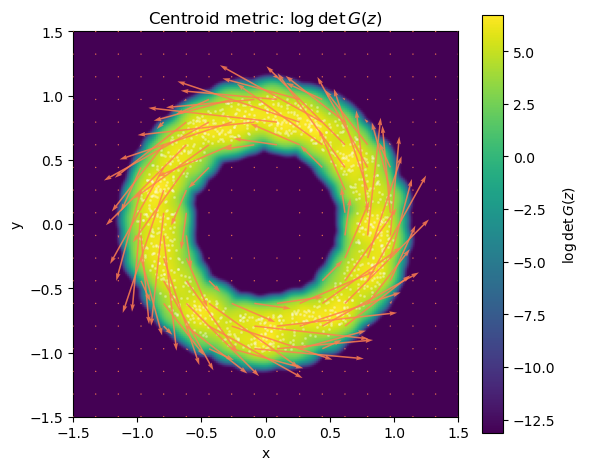

In [19]:
eps = 1e-6

N = 200
x = torch.linspace(-1.5, 1.5, N)
y = torch.linspace(-1.5, 1.5, N)
xx, yy = torch.meshgrid(x, y, indexing="ij")
pts = torch.stack([xx.reshape(-1), yy.reshape(-1)], dim=1)

grid_fine   = 100  # resolution for contour
grid_coarse = 18   # resolution for quiver

xg = np.linspace(-1.5, 1.5, grid_fine)
yg = np.linspace(-1.5, 1.5, grid_fine)
xx, yy = np.meshgrid(xg, yg)
pts_flat = np.stack([xx.ravel(), yy.ravel()], axis=1)

xg_c = np.linspace(-1.5, 1.5, grid_coarse)
yg_c = np.linspace(-1.5, 1.5, grid_coarse)
xx_c, yy_c = np.meshgrid(xg_c, yg_c)
pts_c_flat = np.stack([xx_c.ravel(), yy_c.ravel()], axis=1)
mask_c = np.linalg.norm(pts_c_flat, axis=1) > 0.15   # skip near-origin for quiver

with torch.no_grad():
    pts_tensor   = torch.tensor(pts_flat, dtype=torch.float32)
    pts_c_tensor = torch.tensor(pts_c_flat[mask_c], dtype=torch.float32)

    # log det G(z) — high where metric is large (far from data), low in the annulus
    logdet_vals = randers_metric.base_cometric.logdet(pts_tensor).numpy()
    # ω vector field from the Randers metric
    omega_vecs  = randers_metric.omega(pts_c_tensor).detach().numpy()

with torch.no_grad():
    g_inv_diag = randers_metric.base_cometric(pts.float())
    det_G = 1.0 / (g_inv_diag[:, 0] * g_inv_diag[:, 1] + eps)

det_G = det_G.reshape(N, N).numpy()
log_det_G = np.log(det_G + eps)

finite = log_det_G[np.isfinite(log_det_G)]
vmax = np.percentile(finite, 100)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(
    log_det_G.T,
    origin="lower",
    extent=[-1.5, 1.5, -1.5, 1.5],
    cmap="viridis",
    vmin=finite.min(),
    vmax=vmax,
)

# --- Data points (annulus) ---
ax.scatter(X[:, 0].numpy(), X[:, 1].numpy(),
           s=1.5, c="white", alpha=0.25, zorder=2, label="data")

# --- ω quiver ---
ax.quiver(
    pts_c_flat[mask_c, 0], pts_c_flat[mask_c, 1],
    omega_vecs[:, 0],      omega_vecs[:, 1],
    color="coral", alpha=0.85, zorder=3,
    angles="xy", scale_units="xy", scale=5, width=0.004,
)

fig.colorbar(im, ax=ax, label=r"$\log \det G(z)$")

ax.set_title(r"Centroid metric: $\log \det G(z)$")
ax.set_xlabel("x")
ax.set_ylabel("y")
plt.tight_layout()
plt.show()


## 2 - Hamiltonian trajectories for Randers geodesics

In [23]:
l = 50
N_fx = 6
gamma = 0.01
N_run = 1

sampler = ImplicitFHMC(
    randers_cometric,
    l, 
    N_fx,
    gamma, 
    N_run, 
    pbar = True,
    skip_acceptance = True
    )

In [28]:
z_0 = torch.tensor([[0.,1.]])
#z_1 = z_0.clone()
v_0 = torch.tensor([[-1., 0.]])
p_0 = sampler.legendre(v_0, z_0)
#p_1 = p_0.clone()
#traj = sampler.leapfrog(z_0, p_0, z_1, p_1, return_traj=True)
traj = sampler.leapfrog(z_0, p_0, return_traj=True)

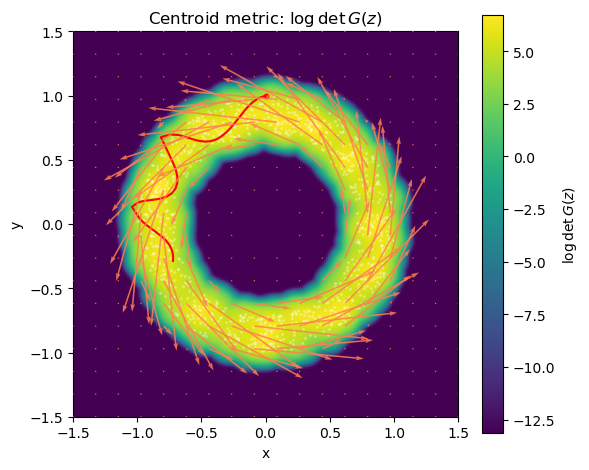

In [29]:
eps = 1e-6

N = 200
x = torch.linspace(-1.5, 1.5, N)
y = torch.linspace(-1.5, 1.5, N)
xx, yy = torch.meshgrid(x, y, indexing="ij")
pts = torch.stack([xx.reshape(-1), yy.reshape(-1)], dim=1)

grid_fine   = 100  # resolution for contour
grid_coarse = 18   # resolution for quiver

xg = np.linspace(-1.5, 1.5, grid_fine)
yg = np.linspace(-1.5, 1.5, grid_fine)
xx, yy = np.meshgrid(xg, yg)
pts_flat = np.stack([xx.ravel(), yy.ravel()], axis=1)

xg_c = np.linspace(-1.5, 1.5, grid_coarse)
yg_c = np.linspace(-1.5, 1.5, grid_coarse)
xx_c, yy_c = np.meshgrid(xg_c, yg_c)
pts_c_flat = np.stack([xx_c.ravel(), yy_c.ravel()], axis=1)
mask_c = np.linalg.norm(pts_c_flat, axis=1) > 0.15   # skip near-origin for quiver

with torch.no_grad():
    pts_tensor   = torch.tensor(pts_flat, dtype=torch.float32)
    pts_c_tensor = torch.tensor(pts_c_flat[mask_c], dtype=torch.float32)

    # log det G(z) — high where metric is large (far from data), low in the annulus
    logdet_vals = randers_metric.base_cometric.logdet(pts_tensor).numpy()
    # ω vector field from the Randers metric
    omega_vecs  = randers_metric.omega(pts_c_tensor).detach().numpy()

with torch.no_grad():
    g_inv_diag = randers_metric.base_cometric(pts.float())
    det_G = 1.0 / (g_inv_diag[:, 0] * g_inv_diag[:, 1] + eps)

det_G = det_G.reshape(N, N).numpy()
log_det_G = np.log(det_G + eps)

finite = log_det_G[np.isfinite(log_det_G)]
vmax = np.percentile(finite, 100)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(
    log_det_G.T,
    origin="lower",
    extent=[-1.5, 1.5, -1.5, 1.5],
    cmap="viridis",
    vmin=finite.min(),
    vmax=vmax,
)

# --- Data points (annulus) ---
ax.scatter(X[:, 0].numpy(), X[:, 1].numpy(),
           s=1.5, c="white", alpha=0.25, zorder=2, label="data")

# --- ω quiver ---
ax.quiver(
    pts_c_flat[mask_c, 0], pts_c_flat[mask_c, 1],
    omega_vecs[:, 0],      omega_vecs[:, 1],
    color="coral", alpha=0.85, zorder=3,
    angles="xy", scale_units="xy", scale=5, width=0.004,
)

# --- traj ---
ax.plot(traj[0][0,:,0],traj[0][0,:,1], c="red" )

# --- start point ---
ax.scatter(traj[0][0,0,0],traj[0][0,0,1], c="red", s = 10)

fig.colorbar(im, ax=ax, label=r"$\log \det G(z)$")

ax.set_title(r"Centroid metric: $\log \det G(z)$")
ax.set_xlabel("x")
ax.set_ylabel("y")
plt.tight_layout()
plt.show()


## 3- Tests for FHMC algorithm with difference acceptation rates

## 3.1. FHMC without rejection (or geodesic Random Walk)

In [113]:
l = 1
N_fx = 6
gamma = 0.01
N_run = 100

sampler = ImplicitFHMC(
    randers_cometric,
    l, 
    N_fx,
    gamma, 
    N_run, 
    pbar = True,
    skip_acceptance = True
    )

Initial momentum and velocity distribution

In [114]:
z_0 = torch.tensor([[0., 1.]]*10**4)

G_star = randers_cometric.G_star(z_0)[0,...]
w_star = randers_cometric.omega_star(z_0)[0,...]
p_0 = sampler.sample_momentum(z_0)
v_0 = sampler.reversed_legendre(p_0, z_0)

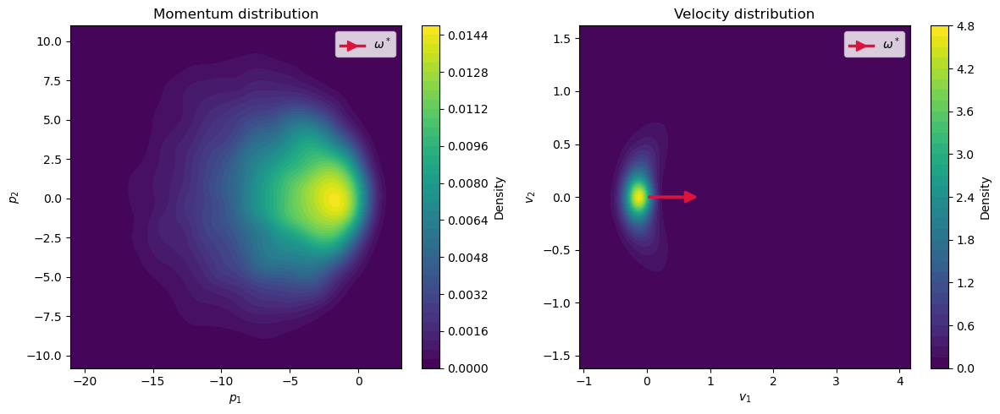

In [115]:
import matplotlib.lines as mlines

# Convert to numpy
p_np = p_0.detach().cpu().numpy()
v_np = v_0.detach().cpu().numpy()
w_np = w_star.detach().cpu().numpy()

# --- Auto-adapt bounds: 0.5–99.5 percentile + 15% margin ---
def auto_bounds(data, q_lo=0.5, q_hi=99.5, margin=0.15):
    lo = np.percentile(data, q_lo, axis=0)
    hi = np.percentile(data, q_hi, axis=0)
    span = hi - lo
    return lo - margin * span, hi + margin * span

p_lo, p_hi = auto_bounds(p_np)
v_lo, v_hi = auto_bounds(v_np)

grid_size = 150

def make_grid(lo, hi, n=grid_size):
    xx, yy = np.meshgrid(np.linspace(lo[0], hi[0], n), np.linspace(lo[1], hi[1], n))
    return xx, yy, np.vstack([xx.ravel(), yy.ravel()])

p_xx, p_yy, p_pts = make_grid(p_lo, p_hi)
v_xx, v_yy, v_pts = make_grid(v_lo, v_hi)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

def plot_panel(ax, data, xx, yy, pts, lo, hi, xlabel, ylabel, title, arrow_w):
    kde = gaussian_kde(data.T)
    zz = kde(pts).reshape(xx.shape)
    cf = ax.contourf(xx, yy, zz, levels=40, cmap="viridis")
    plt.colorbar(cf, ax=ax, label="Density")

    # Arrow scaled to 20% of the plot span, unit-direction normalised
    scale = 0.2 * np.mean(hi - lo) / (np.linalg.norm(arrow_w) + 1e-12)
    dx, dy = scale * arrow_w[0], scale * arrow_w[1]
    ax.annotate("", xy=(dx, dy), xytext=(0, 0),
                arrowprops=dict(arrowstyle="-|>", color="crimson",
                                lw=2.5, mutation_scale=20))

    proxy = mlines.Line2D([], [], color="crimson", lw=2.5,
                          marker=">", markersize=9, label=r"$\omega^*$")
    ax.legend(handles=[proxy], loc="upper right", framealpha=0.8)
    ax.set_xlim(lo[0], hi[0])
    ax.set_ylim(lo[1], hi[1])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

plot_panel(axs[0], p_np, p_xx, p_yy, p_pts, p_lo, p_hi,
           "$p_1$", "$p_2$", "Momentum distribution", w_np)
plot_panel(axs[1], v_np, v_xx, v_yy, v_pts, v_lo, v_hi,
           "$v_1$", "$v_2$", "Velocity distribution", w_np)

plt.tight_layout()
plt.show()

Full trajectories

In [116]:
n_traj = 1
traj = sampler.sample(
    z_0 = torch.tensor([[0., 1.]]*n_traj),
    return_traj= True, 
    progress=True
)

Sampling: 100%|██████████| 100/100 [00:06<00:00, 14.97steps/s, acceptance_rate=1]


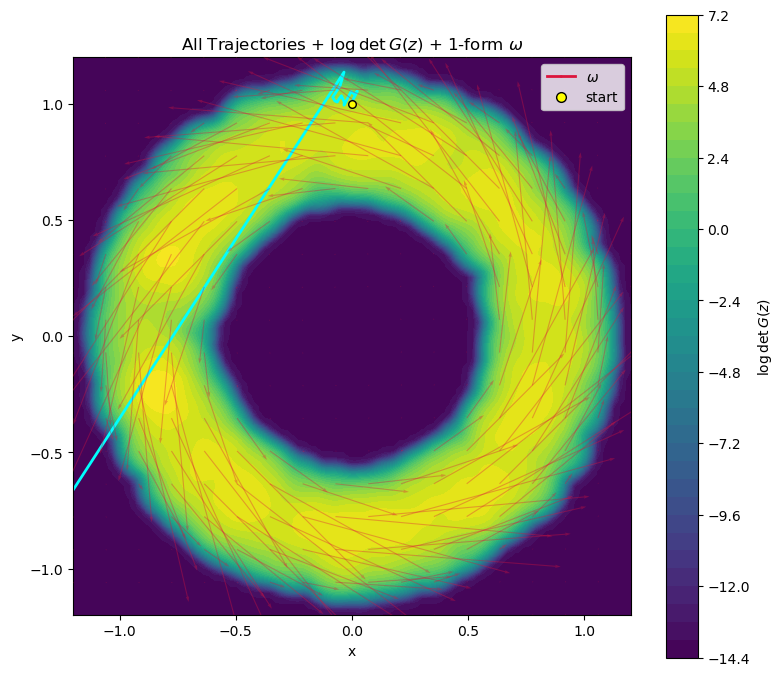

In [117]:
import matplotlib.lines as mlines

# ---- Parse traj into (n_traj, n_steps, d) ----
if hasattr(traj, "detach"):
    positions = traj.detach().cpu().numpy()       # sample() -> (b, N_run+1, d)
elif isinstance(traj, (tuple, list)):
    positions = traj[0].detach().cpu().numpy()    # leapfrog() -> z_traj (b, l+1, d)
else:
    positions = np.asarray(traj)

if positions.ndim == 2:
    positions = positions[np.newaxis]             # (n_steps, d) -> (1, n_steps, d)

# ---- Set axis limits to show the whole ring ----
# For a ring centered at (0,0) with radius approx 1, add some padding to see the whole ring
ring_pad = 0.2
ring_xmin = -1.0 - ring_pad
ring_xmax = 1.0 + ring_pad
ring_ymin = -1.0 - ring_pad
ring_ymax = 1.0 + ring_pad

# ---- Background grids ----
grid_fine, grid_coarse = 100, 18

xg = np.linspace(ring_xmin, ring_xmax, grid_fine)
yg = np.linspace(ring_ymin, ring_ymax, grid_fine)
xx, yy = np.meshgrid(xg, yg)
pts_flat = np.stack([xx.ravel(), yy.ravel()], axis=1)

xg_c = np.linspace(ring_xmin, ring_xmax, grid_coarse)
yg_c = np.linspace(ring_ymin, ring_ymax, grid_coarse)
xx_c, yy_c = np.meshgrid(xg_c, yg_c)
pts_c_flat = np.stack([xx_c.ravel(), yy_c.ravel()], axis=1)
mask_c = np.linalg.norm(pts_c_flat, axis=1) > 0.15

with torch.no_grad():
    pts_tensor   = torch.tensor(pts_flat,           dtype=torch.float32)
    pts_c_tensor = torch.tensor(pts_c_flat[mask_c], dtype=torch.float32)
    logdet_vals  = randers_metric.base_cometric.logdet(pts_tensor).numpy()
    omega_vecs   = randers_metric.omega(pts_c_tensor).numpy()

logdet_grid = logdet_vals.reshape(xx.shape)

fig, ax = plt.subplots(figsize=(8, 7))

cf = ax.contourf(xx, yy, logdet_grid, levels=40, cmap="viridis")
plt.colorbar(cf, ax=ax, label=r"$\log \det G(z)$")

ax.quiver(
    pts_c_flat[mask_c, 0], pts_c_flat[mask_c, 1],
    omega_vecs[:, 0],      omega_vecs[:, 1],
    color="crimson", alpha=0.35, zorder=3,
    angles="xy", scale_units="xy", scale=5, width=0.002,
)

# --- Trajectories (positions is always 3D here) ---

in_box = (
    (positions[:, 0, 0] >= ring_xmin) & (positions[:, 0, 0] <= ring_xmax) &
    (positions[:, 0, 1] >= ring_ymin) & (positions[:, 0, 1] <= ring_ymax)
)
if in_box.any():
    ax.scatter(positions[in_box, 0, 0], positions[in_box, 0, 1],
               color="yellow", edgecolor="black", s=30, zorder=6)

proxy_omega = mlines.Line2D([], [], color="crimson", lw=2,
                             marker=">", markersize=1, label=r"$\omega$")
proxy_start = mlines.Line2D([], [], color="yellow", marker="o", lw=0,
                             markersize=7, markeredgecolor="black", label="start")
n_paths = positions.shape[0]
for i in range(n_paths):
    path = positions[i]
    valid = np.isfinite(path).all(axis=1)
    if valid.any():
        ax.plot(path[valid, 0], path[valid, 1], color="cyan", alpha=1, lw=2.0)
ax.legend(handles=[proxy_omega, proxy_start], loc="upper right", framealpha=0.8)

ax.set_aspect("equal")
ax.set_xlim(ring_xmin, ring_xmax)
ax.set_ylim(ring_ymin, ring_ymax)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_title(r"All Trajectories + $\log \det G(z)$ + 1-form $\omega$")
plt.tight_layout()
plt.show()

## 3.2. FHMC : acceptation ratio as likelihood ratio

In [ ]:
l = 1
N_fx = 6
gamma = 0.01
N_run = 1000

sampler = ImplicitFHMC(
    randers_cometric,
    l, 
    N_fx,
    gamma, 
    N_run, 
    pbar = True,
    skip_acceptance = True
    )

In [ ]:
traj, acc = sampler.sample(
    z_0 = torch.tensor([[0.,1.]]*100),
    return_traj= True, 
    return_acceptance= True,
    progress = True
)
print(f"Acceptance rate: {acc:.4f}")

Sampling:   0%|          | 2/1000 [00:00<05:13,  3.18steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.4666e+00,  3.6821e-02],
                  [ 3.6821e-02,  4.6946e-01]]],


                [[[ 9.9445e+00, -2.2543e-01],
                  [-2.2543e-01,  1.8970e+00]]],


                [[[ 8.2472e+00,  1.4284e-01],
                  [ 1.4284e-01,  1.5706e+00]]],


                [[[ 1.2747e+01, -4.6102e-01],
                  [-4.6102e-01,  2.4464e+00]]],


                [[[ 4.5189e+00,  1.0416e-01],
                  [ 1.0416e-01,  8.6212e-01]]],


                [[[ 3.2968e+00,  5.7800e-02],
                  [ 5.7800e-02,  6.2789e-01]]],


                [[[ 3.9195e+00,  6.5326e-02],
                  [ 6.5326e-02,  7.4631e-01]]],


                [[[ 1.3728e+04, -1.0876e+04],
                  [-1.0876e+04,  1.9236e+04]]],


                [[[ 1.5306e+01,  1.9896e-01],
                  [ 1.9896e-01,  2.9119e+00]]],


                [[[ 2.3439e+00,  6.91

Sampling:   0%|          | 4/1000 [00:01<03:53,  4.26steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.4588e+00,  4.0023e-02],
                  [ 4.0023e-02,  4.6813e-01]]],


                [[[ 7.3667e+00, -3.5012e-02],
                  [-3.5012e-02,  1.3999e+00]]],


                [[[ 1.4520e+01, -7.9495e-01],
                  [-7.9495e-01,  2.8229e+00]]],


                [[[ 8.4752e+00, -1.0018e-01],
                  [-1.0018e-01,  1.6120e+00]]],


                [[[ 4.6015e+00,  9.6272e-02],
                  [ 9.6272e-02,  8.7725e-01]]],


                [[[ 4.2844e+00, -2.8657e-02],
                  [-2.8657e-02,  8.1431e-01]]],


                [[[ 3.7000e+00,  6.1930e-02],
                  [ 6.1930e-02,  7.0452e-01]]],


                [[[ 1.4037e+04, -1.0949e+04],
                  [-1.0949e+04,  1.8926e+04]]],


                [[[ 1.2108e+01,  2.0583e-01],
                  [ 2.0583e-01,  2.3056e+00]]],


                [[[ 2.4387e+00,  4.17

Sampling:   0%|          | 5/1000 [00:01<04:11,  3.96steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.3352e+00,  4.0082e-02],
                  [ 4.0082e-02,  4.4471e-01]]],


                [[[ 6.0985e+00,  5.8661e-03],
                  [ 5.8661e-03,  1.1587e+00]]],


                [[[ 8.2379e+00,  1.4056e-01],
                  [ 1.4056e-01,  1.5687e+00]]],


                [[[ 8.1121e+00, -9.9237e-02],
                  [-9.9237e-02,  1.5431e+00]]],


                [[[ 4.0906e+00,  9.1148e-02],
                  [ 9.1148e-02,  7.8020e-01]]],


                [[[ 3.4857e+00,  6.3162e-02],
                  [ 6.3162e-02,  6.6397e-01]]],


                [[[ 3.7391e+00,  5.9453e-02],
                  [ 5.9453e-02,  7.1182e-01]]],


                [[[ 1.3825e+04, -1.0900e+04],
                  [-1.0900e+04,  1.9139e+04]]],


                [[[ 9.8784e+00,  1.8467e-01],
                  [ 1.8467e-01,  1.8820e+00]]],


                [[[ 2.3723e+00,  7.62

Sampling:   1%|          | 6/1000 [00:01<03:56,  4.20steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.2538e+00,  3.0351e-02],
                  [ 3.0351e-02,  4.2881e-01]]],


                [[[ 9.3679e+00, -9.3517e-02],
                  [-9.3517e-02,  1.7813e+00]]],


                [[[ 7.5045e+00,  1.2781e-01],
                  [ 1.2781e-01,  1.4290e+00]]],


                [[[ 8.1030e+00, -8.9076e-02],
                  [-8.9076e-02,  1.5410e+00]]],


                [[[ 6.1918e+00, -7.1038e-02],
                  [-7.1038e-02,  1.1776e+00]]],


                [[[ 3.2243e+00,  5.8516e-02],
                  [ 5.8516e-02,  6.1418e-01]]],


                [[[ 3.6519e+00,  5.9964e-02],
                  [ 5.9964e-02,  6.9531e-01]]],


                [[[ 1.3999e+04, -1.0941e+04],
                  [-1.0941e+04,  1.8965e+04]]],


                [[[ 9.4285e+00,  1.8209e-01],
                  [ 1.8209e-01,  1.7966e+00]]],


                [[[ 2.3034e+00,  7.15

Sampling:   1%|          | 11/1000 [00:02<03:21,  4.91steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7383e+00,  4.6707e-02],
                  [ 4.6707e-02,  3.3212e-01]]],


                [[[ 1.3872e+01, -8.1710e-02],
                  [-8.1710e-02,  2.6364e+00]]],


                [[[ 2.6398e+04, -5.2473e+03],
                  [-5.2473e+03,  6.5659e+03]]],


                [[[ 2.3233e+04, -8.9600e+03],
                  [-8.9600e+03,  9.7307e+03]]],


                [[[ 2.0317e+04, -1.0543e+04],
                  [-1.0543e+04,  1.2647e+04]]],


                [[[ 2.0652e+04, -1.0415e+04],
                  [-1.0415e+04,  1.2312e+04]]],


                [[[ 3.9768e+00,  1.2463e-01],
                  [ 1.2463e-01,  7.6132e-01]]],


                [[[ 1.5030e+04, -1.1124e+04],
                  [-1.1124e+04,  1.7934e+04]]],


                [[[ 2.1188e+04, -1.0184e+04],
                  [-1.0184e+04,  1.1776e+04]]],


                [[[ 1.8009e+01,  2.11

Sampling:   1%|▏         | 13/1000 [00:02<02:57,  5.56steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7600e+00,  4.5767e-02],
                  [ 4.5767e-02,  3.3615e-01]]],


                [[[ 1.6269e+01, -1.0436e-01],
                  [-1.0436e-01,  3.0921e+00]]],


                [[[ 2.6728e+04, -4.5695e+03],
                  [-4.5695e+03,  6.2359e+03]]],


                [[[ 2.3180e+04, -8.9999e+03],
                  [-8.9999e+03,  9.7840e+03]]],


                [[[ 2.0190e+04, -1.0588e+04],
                  [-1.0588e+04,  1.2774e+04]]],


                [[[ 2.0545e+04, -1.0457e+04],
                  [-1.0457e+04,  1.2419e+04]]],


                [[[ 2.9329e+00,  3.0035e-02],
                  [ 3.0035e-02,  5.5771e-01]]],


                [[[ 1.4979e+04, -1.1118e+04],
                  [-1.1118e+04,  1.7985e+04]]],


                [[[ 2.1203e+04, -1.0177e+04],
                  [-1.0177e+04,  1.1761e+04]]],


                [[[ 1.0835e+01,  1.78

Sampling:   2%|▏         | 15/1000 [00:03<02:55,  5.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.9172e+00,  3.0470e-02],
                  [ 3.0470e-02,  3.6499e-01]]],


                [[[ 1.5650e+01, -4.7572e-02],
                  [-4.7572e-02,  2.9737e+00]]],


                [[[ 2.6734e+04, -4.5565e+03],
                  [-4.5565e+03,  6.2301e+03]]],


                [[[ 2.3121e+04, -9.0433e+03],
                  [-9.0433e+03,  9.8426e+03]]],


                [[[ 2.0300e+04, -1.0549e+04],
                  [-1.0549e+04,  1.2664e+04]]],


                [[[ 2.0774e+04, -1.0366e+04],
                  [-1.0366e+04,  1.2190e+04]]],


                [[[ 4.2197e+00,  1.2355e-01],
                  [ 1.2355e-01,  8.0707e-01]]],


                [[[ 1.4993e+04, -1.1120e+04],
                  [-1.1120e+04,  1.7971e+04]]],


                [[[ 2.1372e+04, -1.0097e+04],
                  [-1.0097e+04,  1.1592e+04]]],


                [[[ 1.2554e+01,  2.37

Sampling:   2%|▏         | 16/1000 [00:03<03:06,  5.26steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7816e+00,  4.6807e-02],
                  [ 4.6807e-02,  3.4030e-01]]],


                [[[ 2.3236e+01, -5.6310e-01],
                  [-5.6310e-01,  4.4348e+00]]],


                [[[ 2.6264e+04, -5.4940e+03],
                  [-5.4940e+03,  6.7005e+03]]],


                [[[ 2.3176e+04, -9.0027e+03],
                  [-9.0027e+03,  9.7877e+03]]],


                [[[ 2.0271e+04, -1.0560e+04],
                  [-1.0560e+04,  1.2693e+04]]],


                [[[ 2.0899e+04, -1.0313e+04],
                  [-1.0313e+04,  1.2065e+04]]],


                [[[ 4.3258e+00,  1.3688e-01],
                  [ 1.3688e-01,  8.2827e-01]]],


                [[[ 1.4956e+04, -1.1115e+04],
                  [-1.1115e+04,  1.8008e+04]]],


                [[[ 2.1108e+04, -1.0220e+04],
                  [-1.0220e+04,  1.1856e+04]]],


                [[[ 1.2022e+01,  2.27

Sampling:   2%|▏         | 18/1000 [00:03<03:02,  5.37steps/s, acceptance_rate=1]

GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[3.3394e-01, 1.7576e+00]],

                [[3.0513e+00, 1.6059e+01]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[7.7294e-01, 4.0681e+00]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[2.0317e+00, 1.0693e+01]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[1.2196e+00, 6.4191e+00]],

                [[3.5385e-01, 1.8624e+00]],

                [[1.9708e+00, 1.0373e+01]],

                [[7.1862e-01, 3.7822e+00]],

                [[6.2817e-01, 3.3061e+00]],

                [[5.5130e-01, 2.9016e+00]],

                [[5.2632e+03, 2.7701e+04]],

                [[7.0711e-01, 3.7216e+00]],

                [[5.4419e-0

Sampling:   2%|▏         | 20/1000 [00:04<02:44,  5.95steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7916e+00,  5.1214e-02],
                  [ 5.1214e-02,  3.4255e-01]]],


                [[[ 1.1348e+01, -5.6975e-02],
                  [-5.6975e-02,  2.1566e+00]]],


                [[[ 2.6706e+04, -4.6181e+03],
                  [-4.6181e+03,  6.2577e+03]]],


                [[[ 2.3312e+04, -8.9006e+03],
                  [-8.9006e+03,  9.6525e+03]]],


                [[[ 2.0185e+04, -1.0590e+04],
                  [-1.0590e+04,  1.2779e+04]]],


                [[[ 2.0541e+04, -1.0459e+04],
                  [-1.0459e+04,  1.2423e+04]]],


                [[[ 4.6401e+00,  1.3915e-01],
                  [ 1.3915e-01,  8.8775e-01]]],


                [[[ 1.4530e+04, -1.1048e+04],
                  [-1.1048e+04,  1.8434e+04]]],


                [[[ 2.1039e+04, -1.0252e+04],
                  [-1.0252e+04,  1.1925e+04]]],


                [[[ 1.2048e+01,  1.91

Sampling:   2%|▏         | 22/1000 [00:04<02:36,  6.23steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7787e+00,  4.7292e-02],
                  [ 4.7292e-02,  3.3980e-01]]],


                [[[ 2.7817e+01, -6.0782e-01],
                  [-6.0782e-01,  5.3047e+00]]],


                [[[ 2.6672e+04, -4.6934e+03],
                  [-4.6934e+03,  6.2921e+03]]],


                [[[ 2.3222e+04, -8.9682e+03],
                  [-8.9682e+03,  9.7415e+03]]],


                [[[ 2.0223e+04, -1.0577e+04],
                  [-1.0577e+04,  1.2741e+04]]],


                [[[ 2.0680e+04, -1.0404e+04],
                  [-1.0404e+04,  1.2284e+04]]],


                [[[ 4.0804e+00,  1.2687e-01],
                  [ 1.2687e-01,  7.8106e-01]]],


                [[[ 1.4825e+04, -1.1096e+04],
                  [-1.1096e+04,  1.8139e+04]]],


                [[[ 2.1366e+04, -1.0100e+04],
                  [-1.0100e+04,  1.1598e+04]]],


                [[[ 1.5197e+01,  2.09

Sampling:   2%|▏         | 23/1000 [00:04<02:33,  6.37steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7395e+00,  4.4443e-02],
                  [ 4.4443e-02,  3.3218e-01]]],


                [[[ 1.3971e+01, -1.0504e-01],
                  [-1.0504e-01,  2.6557e+00]]],


                [[[ 2.6600e+04, -4.8456e+03],
                  [-4.8456e+03,  6.3636e+03]]],


                [[[ 2.3228e+04, -8.9641e+03],
                  [-8.9641e+03,  9.7361e+03]]],


                [[[ 2.0258e+04, -1.0564e+04],
                  [-1.0564e+04,  1.2705e+04]]],


                [[[ 1.9992e+04, -1.0656e+04],
                  [-1.0656e+04,  1.2972e+04]]],


                [[[ 5.0689e+00,  1.4687e-01],
                  [ 1.4687e-01,  9.6934e-01]]],


                [[[ 1.5100e+04, -1.1133e+04],
                  [-1.1133e+04,  1.7864e+04]]],


                [[[ 2.0880e+04, -1.0321e+04],
                  [-1.0321e+04,  1.2084e+04]]],


                [[[ 1.1036e+01,  2.10

Sampling:   2%|▎         | 25/1000 [00:05<02:45,  5.89steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7373e+00,  4.8049e-02],
                  [ 4.8049e-02,  3.3204e-01]]],


                [[[ 1.2090e+01, -5.4985e-02],
                  [-5.4985e-02,  2.2975e+00]]],


                [[[ 2.6721e+04, -4.5850e+03],
                  [-4.5850e+03,  6.2428e+03]]],


                [[[ 2.3198e+04, -8.9864e+03],
                  [-8.9864e+03,  9.7658e+03]]],


                [[[ 2.0146e+04, -1.0604e+04],
                  [-1.0604e+04,  1.2818e+04]]],


                [[[ 2.0578e+04, -1.0445e+04],
                  [-1.0445e+04,  1.2386e+04]]],


                [[[ 4.2582e+00,  1.2916e-01],
                  [ 1.2916e-01,  8.1482e-01]]],


                [[[ 1.5031e+04, -1.1125e+04],
                  [-1.1125e+04,  1.7933e+04]]],


                [[[ 1.4909e+04, -1.1108e+04],
                  [-1.1108e+04,  1.8055e+04]]],


                [[[ 1.1556e+01,  2.27

Sampling:   3%|▎         | 27/1000 [00:05<02:53,  5.62steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7896e+00,  4.7188e-02],
                  [ 4.7188e-02,  3.4186e-01]]],


                [[[ 2.7422e+01, -8.6752e-01],
                  [-8.6752e-01,  5.2506e+00]]],


                [[[ 2.6417e+04, -5.2121e+03],
                  [-5.2121e+03,  6.5474e+03]]],


                [[[ 2.2958e+04, -9.1607e+03],
                  [-9.1607e+03,  1.0006e+04]]],


                [[[ 2.0078e+04, -1.0627e+04],
                  [-1.0627e+04,  1.2886e+04]]],


                [[[ 2.0556e+04, -1.0453e+04],
                  [-1.0453e+04,  1.2408e+04]]],


                [[[ 4.7009e+00,  1.3592e-01],
                  [ 1.3592e-01,  8.9894e-01]]],


                [[[ 1.5214e+04, -1.1147e+04],
                  [-1.1147e+04,  1.7750e+04]]],


                [[[ 2.1071e+04, -1.0237e+04],
                  [-1.0237e+04,  1.1893e+04]]],


                [[[ 2.7306e+01, -2.68

Sampling:   3%|▎         | 29/1000 [00:05<02:50,  5.69steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7572e+00,  4.6305e-02],
                  [ 4.6305e-02,  3.3566e-01]]],


                [[[ 1.0240e+01, -6.6717e-02],
                  [-6.6717e-02,  1.9462e+00]]],


                [[[ 2.6713e+04, -4.6023e+03],
                  [-4.6023e+03,  6.2506e+03]]],


                [[[ 2.3144e+04, -9.0264e+03],
                  [-9.0264e+03,  9.8196e+03]]],


                [[[ 2.0215e+04, -1.0580e+04],
                  [-1.0580e+04,  1.2749e+04]]],


                [[[ 2.0803e+04, -1.0353e+04],
                  [-1.0353e+04,  1.2160e+04]]],


                [[[ 3.8947e+00,  1.1392e-01],
                  [ 1.1392e-01,  7.4489e-01]]],


                [[[ 1.5057e+04, -1.1128e+04],
                  [-1.1128e+04,  1.7907e+04]]],


                [[[ 2.1570e+04, -9.9989e+03],
                  [-9.9989e+03,  1.1394e+04]]],


                [[[ 1.1282e+01,  2.00

Sampling:   3%|▎         | 30/1000 [00:05<02:58,  5.42steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7405e+00,  4.6345e-02],
                  [ 4.6345e-02,  3.3251e-01]]],


                [[[ 4.9381e+00, -1.6312e-01],
                  [-1.6312e-01,  9.4615e-01]]],


                [[[ 2.6725e+04, -4.5757e+03],
                  [-4.5757e+03,  6.2387e+03]]],


                [[[ 2.3048e+04, -9.0968e+03],
                  [-9.0968e+03,  9.9161e+03]]],


                [[[ 1.9820e+04, -1.0711e+04],
                  [-1.0711e+04,  1.3144e+04]]],


                [[[ 2.0602e+04, -1.0435e+04],
                  [-1.0435e+04,  1.2362e+04]]],


                [[[ 5.1930e+00,  1.4205e-01],
                  [ 1.4205e-01,  9.9237e-01]]],


                [[[ 1.5012e+04, -1.1122e+04],
                  [-1.1122e+04,  1.7952e+04]]],


                [[[ 2.1145e+04, -1.0204e+04],
                  [-1.0204e+04,  1.1819e+04]]],


                [[[ 1.4978e+01,  2.40

Sampling:   3%|▎         | 31/1000 [00:06<03:19,  4.85steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7566e+00,  4.6205e-02],
                  [ 4.6205e-02,  3.3553e-01]]],


                [[[ 3.9515e+01, -2.3270e+00],
                  [-2.3270e+00,  7.7093e+00]]],


                [[[ 2.6751e+04, -4.5170e+03],
                  [-4.5170e+03,  6.2127e+03]]],


                [[[ 2.3153e+04, -9.0199e+03],
                  [-9.0199e+03,  9.8109e+03]]],


                [[[ 2.0259e+04, -1.0564e+04],
                  [-1.0564e+04,  1.2705e+04]]],


                [[[ 2.0668e+04, -1.0408e+04],
                  [-1.0408e+04,  1.2295e+04]]],


                [[[ 4.2627e+00,  1.3393e-01],
                  [ 1.3393e-01,  8.1610e-01]]],


                [[[ 1.5011e+04, -1.1122e+04],
                  [-1.1122e+04,  1.7953e+04]]],


                [[[ 2.1343e+04, -1.0111e+04],
                  [-1.0111e+04,  1.1621e+04]]],


                [[[ 1.3080e+01,  2.19

Sampling:   3%|▎         | 32/1000 [00:06<03:21,  4.80steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7299e+00,  4.6616e-02],
                  [ 4.6616e-02,  3.3054e-01]]],


                [[[ 1.3790e+01, -7.6059e-02],
                  [-7.6059e-02,  2.6207e+00]]],


                [[[ 2.6570e+04, -4.9095e+03],
                  [-4.9095e+03,  6.3944e+03]]],


                [[[ 2.3292e+04, -8.9153e+03],
                  [-8.9153e+03,  9.6717e+03]]],


                [[[ 2.0258e+04, -1.0564e+04],
                  [-1.0564e+04,  1.2706e+04]]],


                [[[ 2.0424e+04, -1.0504e+04],
                  [-1.0504e+04,  1.2540e+04]]],


                [[[ 4.3977e+00,  1.3449e-01],
                  [ 1.3449e-01,  8.4161e-01]]],


                [[[ 1.5162e+04, -1.1141e+04],
                  [-1.1141e+04,  1.7802e+04]]],


                [[[ 2.1373e+04, -1.0097e+04],
                  [-1.0097e+04,  1.1591e+04]]],


                [[[ 1.9432e+00, -1.94

Sampling:   3%|▎         | 34/1000 [00:06<03:34,  4.50steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7616e+00,  4.7535e-02],
                  [ 4.7535e-02,  3.3659e-01]]],


                [[[ 1.4481e+01, -9.9978e-02],
                  [-9.9978e-02,  2.7524e+00]]],


                [[[ 2.6719e+04, -4.5899e+03],
                  [-4.5899e+03,  6.2450e+03]]],


                [[[ 2.3200e+04, -8.9847e+03],
                  [-8.9847e+03,  9.7636e+03]]],


                [[[ 2.0189e+04, -1.0589e+04],
                  [-1.0589e+04,  1.2775e+04]]],


                [[[ 2.0788e+04, -1.0359e+04],
                  [-1.0359e+04,  1.2176e+04]]],


                [[[ 4.6272e+00,  1.4972e-01],
                  [ 1.4972e-01,  8.8629e-01]]],


                [[[ 1.4979e+04, -1.1118e+04],
                  [-1.1118e+04,  1.7985e+04]]],


                [[[ 2.0760e+04, -1.0371e+04],
                  [-1.0371e+04,  1.2204e+04]]],


                [[[ 1.0236e+01,  2.03

Sampling:   4%|▎         | 36/1000 [00:07<03:29,  4.59steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.7837e+00,  4.9599e-02],
                  [ 4.9599e-02,  3.4093e-01]]],


                [[[ 2.8345e+01, -1.1113e+00],
                  [-1.1113e+00,  5.4496e+00]]],


                [[[ 2.6693e+04, -4.6479e+03],
                  [-4.6479e+03,  6.2713e+03]]],


                [[[ 2.2685e+04, -9.3478e+03],
                  [-9.3478e+03,  1.0279e+04]]],


                [[[ 2.0254e+04, -1.0566e+04],
                  [-1.0566e+04,  1.2710e+04]]],


                [[[ 2.0567e+04, -1.0449e+04],
                  [-1.0449e+04,  1.2397e+04]]],


                [[[ 4.5174e+00,  1.3839e-01],
                  [ 1.3839e-01,  8.6454e-01]]],


                [[[ 1.5256e+04, -1.1152e+04],
                  [-1.1152e+04,  1.7708e+04]]],


                [[[ 2.0508e+04, -1.0471e+04],
                  [-1.0471e+04,  1.2456e+04]]],


                [[[ 1.0056e+01,  1.75

Sampling:   4%|▎         | 37/1000 [00:07<03:22,  4.76steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.6907e+00,  2.6221e-02],
                  [ 2.6221e-02,  3.2183e-01]]],


                [[[ 1.3600e+01, -5.9535e-02],
                  [-5.9535e-02,  2.5843e+00]]],


                [[[ 2.6715e+04, -4.5995e+03],
                  [-4.5995e+03,  6.2494e+03]]],


                [[[ 2.3206e+04, -8.9802e+03],
                  [-8.9802e+03,  9.7575e+03]]],


                [[[ 2.0227e+04, -1.0575e+04],
                  [-1.0575e+04,  1.2737e+04]]],


                [[[ 2.0460e+04, -1.0490e+04],
                  [-1.0490e+04,  1.2504e+04]]],


                [[[ 3.0182e+00,  8.9175e-02],
                  [ 8.9175e-02,  5.7732e-01]]],


                [[[ 1.5051e+04, -1.1127e+04],
                  [-1.1127e+04,  1.7913e+04]]],


                [[[ 2.1155e+04, -1.0199e+04],
                  [-1.0199e+04,  1.1809e+04]]],


                [[[ 1.1645e+01,  2.38

Sampling:   4%|▍         | 42/1000 [00:08<03:05,  5.17steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.5387e+00,  5.6829e-02],
                  [ 5.6829e-02,  2.9543e-01]]],


                [[[ 2.7699e+04,  1.7941e+02],
                  [ 1.7941e+02,  5.2646e+03]]],


                [[[ 2.7653e+04, -1.0322e+03],
                  [-1.0322e+03,  5.3107e+03]]],


                [[[ 2.3891e+04, -8.4247e+03],
                  [-8.4247e+03,  9.0734e+03]]],


                [[[ 1.9829e+04, -1.0708e+04],
                  [-1.0708e+04,  1.3135e+04]]],


                [[[ 2.2358e+04, -9.5572e+03],
                  [-9.5572e+03,  1.0606e+04]]],


                [[[ 2.5153e+04,  7.1186e+03],
                  [ 7.1186e+03,  7.8109e+03]]],


                [[[ 1.8378e+04, -1.1057e+04],
                  [-1.1057e+04,  1.4586e+04]]],


                [[[ 2.1118e+04, -1.0216e+04],
                  [-1.0216e+04,  1.1846e+04]]],


                [[[ 2.5703e+04, -6.39

Sampling:   5%|▍         | 49/1000 [00:10<03:21,  4.71steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4343e+00,  1.0386e-01],
                  [ 1.0386e-01,  2.8358e-01]]],


                [[[ 2.2878e+04, -9.2173e+03],
                  [-9.2173e+03,  1.0086e+04]]],


                [[[ 2.7260e+04, -3.1133e+03],
                  [-3.1133e+03,  5.7038e+03]]],


                [[[ 2.2656e+04, -9.3674e+03],
                  [-9.3674e+03,  1.0308e+04]]],


                [[[ 2.1039e+04, -1.0252e+04],
                  [-1.0252e+04,  1.1925e+04]]],


                [[[ 2.5986e+04, -5.9617e+03],
                  [-5.9617e+03,  6.9783e+03]]],


                [[[ 2.1490e+04,  1.0039e+04],
                  [ 1.0039e+04,  1.1474e+04]]],


                [[[ 2.0066e+04, -1.0631e+04],
                  [-1.0631e+04,  1.2898e+04]]],


                [[[ 2.6107e+04, -5.7642e+03],
                  [-5.7642e+03,  6.8572e+03]]],


                [[[ 2.7701e+04, -3.07

Sampling:   6%|▌         | 56/1000 [00:11<03:18,  4.75steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3746e+00,  8.8824e-02],
                  [ 8.8824e-02,  2.6961e-01]]],


                [[[ 2.3392e+04, -8.8381e+03],
                  [-8.8381e+03,  9.5719e+03]]],


                [[[ 2.6551e+04,  4.9466e+03],
                  [ 4.9466e+03,  6.4126e+03]]],


                [[[ 2.1286e+04, -1.0138e+04],
                  [-1.0138e+04,  1.1678e+04]]],


                [[[ 2.2098e+04, -9.7118e+03],
                  [-9.7118e+03,  1.0866e+04]]],


                [[[ 2.7565e+04,  1.7379e+03],
                  [ 1.7379e+03,  5.3986e+03]]],


                [[[ 2.0160e+04,  1.0599e+04],
                  [ 1.0599e+04,  1.2804e+04]]],


                [[[ 1.8710e+04, -1.0995e+04],
                  [-1.0995e+04,  1.4254e+04]]],


                [[[ 2.6640e+04, -4.7611e+03],
                  [-4.7611e+03,  6.3235e+03]]],


                [[[ 2.7643e+04, -1.13

Sampling:   6%|▌         | 57/1000 [00:12<03:35,  4.37steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3645e+00,  8.9121e-02],
                  [ 8.9121e-02,  2.6781e-01]]],


                [[[ 2.3023e+04, -9.1148e+03],
                  [-9.1148e+03,  9.9412e+03]]],


                [[[ 2.6723e+04,  4.5805e+03],
                  [ 4.5805e+03,  6.2408e+03]]],


                [[[ 2.1324e+04, -1.0120e+04],
                  [-1.0120e+04,  1.1640e+04]]],


                [[[ 2.2102e+04, -9.7094e+03],
                  [-9.7094e+03,  1.0862e+04]]],


                [[[ 2.7596e+04,  1.5291e+03],
                  [ 1.5291e+03,  5.3678e+03]]],


                [[[ 2.0047e+04,  1.0637e+04],
                  [ 1.0637e+04,  1.2917e+04]]],


                [[[ 1.8430e+04, -1.1048e+04],
                  [-1.1048e+04,  1.4534e+04]]],


                [[[ 2.6616e+04, -4.8122e+03],
                  [-4.8122e+03,  6.3476e+03]]],


                [[[ 2.7669e+04, -8.46

Sampling:   6%|▌         | 58/1000 [00:12<03:32,  4.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3650e+00,  9.0454e-02],
                  [ 9.0454e-02,  2.6816e-01]]],


                [[[ 2.3420e+04, -8.8160e+03],
                  [-8.8160e+03,  9.5436e+03]]],


                [[[ 2.6558e+04,  4.9334e+03],
                  [ 4.9334e+03,  6.4061e+03]]],


                [[[ 2.1289e+04, -1.0137e+04],
                  [-1.0137e+04,  1.1675e+04]]],


                [[[ 2.1961e+04, -9.7898e+03],
                  [-9.7898e+03,  1.1003e+04]]],


                [[[ 2.7572e+04,  1.6955e+03],
                  [ 1.6955e+03,  5.3920e+03]]],


                [[[ 1.9985e+04,  1.0658e+04],
                  [ 1.0658e+04,  1.2978e+04]]],


                [[[ 1.8799e+04, -1.0977e+04],
                  [-1.0977e+04,  1.4165e+04]]],


                [[[ 2.6631e+04, -4.7810e+03],
                  [-4.7810e+03,  6.3329e+03]]],


                [[[ 2.7674e+04, -7.78

Sampling:   6%|▌         | 60/1000 [00:12<03:08,  4.99steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3784e+00,  8.8424e-02],
                  [ 8.8424e-02,  2.7023e-01]]],


                [[[ 2.3380e+04, -8.8478e+03],
                  [-8.8478e+03,  9.5843e+03]]],


                [[[ 2.6664e+04,  4.7095e+03],
                  [ 4.7095e+03,  6.2995e+03]]],


                [[[ 2.1315e+04, -1.0125e+04],
                  [-1.0125e+04,  1.1649e+04]]],


                [[[ 2.2068e+04, -9.7294e+03],
                  [-9.7294e+03,  1.0896e+04]]],


                [[[ 2.7577e+04,  1.6621e+03],
                  [ 1.6621e+03,  5.3870e+03]]],


                [[[ 2.0315e+04,  1.0544e+04],
                  [ 1.0544e+04,  1.2649e+04]]],


                [[[ 1.8634e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4330e+04]]],


                [[[ 2.6499e+04, -5.0522e+03],
                  [-5.0522e+03,  6.4651e+03]]],


                [[[ 2.7673e+04, -7.83

Sampling:   6%|▌         | 61/1000 [00:12<03:01,  5.16steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3721e+00,  8.8940e-02],
                  [ 8.8940e-02,  2.6919e-01]]],


                [[[ 2.3369e+04, -8.8561e+03],
                  [-8.8561e+03,  9.5949e+03]]],


                [[[ 2.6686e+04,  4.6637e+03],
                  [ 4.6637e+03,  6.2784e+03]]],


                [[[ 2.1149e+04, -1.0202e+04],
                  [-1.0202e+04,  1.1815e+04]]],


                [[[ 2.2099e+04, -9.7116e+03],
                  [-9.7116e+03,  1.0865e+04]]],


                [[[ 2.7650e+04,  1.0650e+03],
                  [ 1.0650e+03,  5.3138e+03]]],


                [[[ 1.9957e+04,  1.0667e+04],
                  [ 1.0667e+04,  1.3007e+04]]],


                [[[ 1.8130e+04, -1.1097e+04],
                  [-1.1097e+04,  1.4834e+04]]],


                [[[ 2.6682e+04, -4.6723e+03],
                  [-4.6723e+03,  6.2824e+03]]],


                [[[ 2.7667e+04, -8.70

Sampling:   6%|▋         | 63/1000 [00:13<02:56,  5.31steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3840e+00,  8.8964e-02],
                  [ 8.8964e-02,  2.7136e-01]]],


                [[[ 2.3451e+04, -8.7921e+03],
                  [-8.7921e+03,  9.5134e+03]]],


                [[[ 2.6551e+04,  4.9469e+03],
                  [ 4.9469e+03,  6.4127e+03]]],


                [[[ 2.1170e+04, -1.0192e+04],
                  [-1.0192e+04,  1.1794e+04]]],


                [[[ 2.2090e+04, -9.7167e+03],
                  [-9.7167e+03,  1.0874e+04]]],


                [[[ 2.7602e+04,  1.4893e+03],
                  [ 1.4893e+03,  5.3624e+03]]],


                [[[ 2.0113e+04,  1.0615e+04],
                  [ 1.0615e+04,  1.2851e+04]]],


                [[[ 1.6719e+04, -1.1216e+04],
                  [-1.1216e+04,  1.6245e+04]]],


                [[[ 2.6381e+04, -5.2796e+03],
                  [-5.2796e+03,  6.5831e+03]]],


                [[[ 2.7673e+04, -7.90

Sampling:   6%|▋         | 65/1000 [00:13<02:40,  5.83steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3802e+00,  9.0341e-02],
                  [ 9.0341e-02,  2.7094e-01]]],


                [[[ 2.3436e+04, -8.8037e+03],
                  [-8.8037e+03,  9.5281e+03]]],


                [[[ 2.6620e+04,  4.8041e+03],
                  [ 4.8041e+03,  6.3438e+03]]],


                [[[ 2.1208e+04, -1.0175e+04],
                  [-1.0175e+04,  1.1756e+04]]],


                [[[ 2.1948e+04, -9.7972e+03],
                  [-9.7972e+03,  1.1016e+04]]],


                [[[ 2.7602e+04,  1.4845e+03],
                  [ 1.4845e+03,  5.3618e+03]]],


                [[[ 2.0244e+04,  1.0569e+04],
                  [ 1.0569e+04,  1.2720e+04]]],


                [[[ 1.8385e+04, -1.1056e+04],
                  [-1.1056e+04,  1.4579e+04]]],


                [[[ 2.6582e+04, -4.8848e+03],
                  [-4.8848e+03,  6.3824e+03]]],


                [[[ 2.7297e+04, -2.98

Sampling:   7%|▋         | 66/1000 [00:13<02:35,  5.99steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3690e+00,  8.8122e-02],
                  [ 8.8122e-02,  2.6846e-01]]],


                [[[ 2.3488e+04, -8.7622e+03],
                  [-8.7622e+03,  9.4759e+03]]],


                [[[ 2.6583e+04,  4.8824e+03],
                  [ 4.8824e+03,  6.3813e+03]]],


                [[[ 2.1247e+04, -1.0157e+04],
                  [-1.0157e+04,  1.1717e+04]]],


                [[[ 2.2125e+04, -9.6961e+03],
                  [-9.6961e+03,  1.0839e+04]]],


                [[[ 2.7611e+04,  1.4173e+03],
                  [ 1.4173e+03,  5.3530e+03]]],


                [[[ 1.9946e+04,  1.0671e+04],
                  [ 1.0671e+04,  1.3018e+04]]],


                [[[ 1.8569e+04, -1.1023e+04],
                  [-1.1023e+04,  1.4395e+04]]],


                [[[ 2.6649e+04, -4.7420e+03],
                  [-4.7420e+03,  6.3146e+03]]],


                [[[ 2.7668e+04, -8.52

Sampling:   7%|▋         | 67/1000 [00:13<03:05,  5.04steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3688e+00,  9.0266e-02],
                  [ 9.0266e-02,  2.6884e-01]]],


                [[[ 2.3150e+04, -9.0220e+03],
                  [-9.0220e+03,  9.8138e+03]]],


                [[[ 2.6521e+04,  5.0070e+03],
                  [ 5.0070e+03,  6.4425e+03]]],


                [[[ 2.1157e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1807e+04]]],


                [[[ 2.2049e+04, -9.7403e+03],
                  [-9.7403e+03,  1.0915e+04]]],


                [[[ 2.7605e+04,  1.4655e+03],
                  [ 1.4655e+03,  5.3593e+03]]],


                [[[ 2.0114e+04,  1.0615e+04],
                  [ 1.0615e+04,  1.2850e+04]]],


                [[[ 1.8373e+04, -1.1058e+04],
                  [-1.1058e+04,  1.4591e+04]]],


                [[[ 2.6627e+04, -4.7898e+03],
                  [-4.7898e+03,  6.3370e+03]]],


                [[[ 2.7667e+04, -8.63

Sampling:   7%|▋         | 69/1000 [00:14<02:58,  5.21steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3675e+00,  8.6134e-02],
                  [ 8.6134e-02,  2.6780e-01]]],


                [[[ 2.3421e+04, -8.8153e+03],
                  [-8.8153e+03,  9.5428e+03]]],


                [[[ 2.6603e+04,  4.8393e+03],
                  [ 4.8393e+03,  6.3606e+03]]],


                [[[ 2.1288e+04, -1.0137e+04],
                  [-1.0137e+04,  1.1676e+04]]],


                [[[ 2.1961e+04, -9.7897e+03],
                  [-9.7897e+03,  1.1003e+04]]],


                [[[ 2.7581e+04,  1.6364e+03],
                  [ 1.6364e+03,  5.3831e+03]]],


                [[[ 2.0077e+04,  1.0627e+04],
                  [ 1.0627e+04,  1.2887e+04]]],


                [[[ 1.8783e+04, -1.0980e+04],
                  [-1.0980e+04,  1.4181e+04]]],


                [[[ 2.6611e+04, -4.8230e+03],
                  [-4.8230e+03,  6.3528e+03]]],


                [[[ 2.7682e+04, -6.52

Sampling:   7%|▋         | 70/1000 [00:14<02:49,  5.50steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3750e+00,  9.0088e-02],
                  [ 9.0088e-02,  2.6992e-01]]],


                [[[ 2.3372e+04, -8.8541e+03],
                  [-8.8541e+03,  9.5923e+03]]],


                [[[ 2.6606e+04,  4.8336e+03],
                  [ 4.8336e+03,  6.3578e+03]]],


                [[[ 2.1271e+04, -1.0146e+04],
                  [-1.0146e+04,  1.1693e+04]]],


                [[[ 2.2014e+04, -9.7603e+03],
                  [-9.7603e+03,  1.0950e+04]]],


                [[[ 2.7581e+04,  1.6333e+03],
                  [ 1.6333e+03,  5.3827e+03]]],


                [[[ 2.0521e+04,  1.0467e+04],
                  [ 1.0467e+04,  1.2443e+04]]],


                [[[ 1.8665e+04, -1.1004e+04],
                  [-1.1004e+04,  1.4299e+04]]],


                [[[ 2.6600e+04, -4.8459e+03],
                  [-4.8459e+03,  6.3637e+03]]],


                [[[ 2.7681e+04, -6.66

Sampling:   7%|▋         | 73/1000 [00:15<02:42,  5.70steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3739e+00,  8.9371e-02],
                  [ 8.9371e-02,  2.6960e-01]]],


                [[[ 2.3516e+04, -8.7398e+03],
                  [-8.7398e+03,  9.4479e+03]]],


                [[[ 2.6641e+04,  4.7607e+03],
                  [ 4.7607e+03,  6.3233e+03]]],


                [[[ 2.1184e+04, -1.0186e+04],
                  [-1.0186e+04,  1.1780e+04]]],


                [[[ 2.2107e+04, -9.7068e+03],
                  [-9.7068e+03,  1.0857e+04]]],


                [[[ 2.7581e+04,  1.6347e+03],
                  [ 1.6347e+03,  5.3829e+03]]],


                [[[ 2.6716e+04,  4.5968e+03],
                  [ 4.5968e+03,  6.2481e+03]]],


                [[[ 1.8270e+04, -1.1075e+04],
                  [-1.1075e+04,  1.4694e+04]]],


                [[[ 2.6649e+04, -4.7438e+03],
                  [-4.7438e+03,  6.3154e+03]]],


                [[[ 2.7677e+04, -7.28

Sampling:   8%|▊         | 75/1000 [00:15<02:33,  6.04steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3759e+00,  8.8657e-02],
                  [ 8.8657e-02,  2.6983e-01]]],


                [[[ 2.3306e+04, -8.9045e+03],
                  [-8.9045e+03,  9.6576e+03]]],


                [[[ 2.6625e+04,  4.7946e+03],
                  [ 4.7946e+03,  6.3393e+03]]],


                [[[ 2.1141e+04, -1.0206e+04],
                  [-1.0206e+04,  1.1823e+04]]],


                [[[ 2.2043e+04, -9.7437e+03],
                  [-9.7437e+03,  1.0921e+04]]],


                [[[ 2.7610e+04,  1.4236e+03],
                  [ 1.4236e+03,  5.3538e+03]]],


                [[[ 2.0162e+04,  1.0598e+04],
                  [ 1.0598e+04,  1.2802e+04]]],


                [[[ 1.8623e+04, -1.1013e+04],
                  [-1.1013e+04,  1.4341e+04]]],


                [[[ 2.6745e+04, -4.5324e+03],
                  [-4.5324e+03,  6.2194e+03]]],


                [[[ 2.7675e+04, -7.59

Sampling:   8%|▊         | 76/1000 [00:15<02:41,  5.72steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3683e+00,  8.5364e-02],
                  [ 8.5364e-02,  2.6780e-01]]],


                [[[ 2.3340e+04, -8.8786e+03],
                  [-8.8786e+03,  9.6240e+03]]],


                [[[ 2.6616e+04,  4.8135e+03],
                  [ 4.8135e+03,  6.3482e+03]]],


                [[[ 2.1249e+04, -1.0155e+04],
                  [-1.0155e+04,  1.1715e+04]]],


                [[[ 2.2064e+04, -9.7317e+03],
                  [-9.7317e+03,  1.0900e+04]]],


                [[[ 2.7570e+04,  1.7087e+03],
                  [ 1.7087e+03,  5.3940e+03]]],


                [[[ 2.0294e+04,  1.0551e+04],
                  [ 1.0551e+04,  1.2670e+04]]],


                [[[ 1.8540e+04, -1.1028e+04],
                  [-1.1028e+04,  1.4424e+04]]],


                [[[ 2.6766e+04, -4.4840e+03],
                  [-4.4840e+03,  6.1982e+03]]],


                [[[ 2.7676e+04, -7.42

Sampling:   8%|▊         | 78/1000 [00:15<02:52,  5.33steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3706e+00,  8.7711e-02],
                  [ 8.7711e-02,  2.6867e-01]]],


                [[[ 2.3452e+04, -8.7912e+03],
                  [-8.7912e+03,  9.5123e+03]]],


                [[[ 2.6606e+04,  4.8337e+03],
                  [ 4.8337e+03,  6.3579e+03]]],


                [[[ 2.1133e+04, -1.0209e+04],
                  [-1.0209e+04,  1.1831e+04]]],


                [[[ 2.2110e+04, -9.7048e+03],
                  [-9.7048e+03,  1.0854e+04]]],


                [[[ 2.7556e+04,  1.7992e+03],
                  [ 1.7992e+03,  5.4084e+03]]],


                [[[ 2.0041e+04,  1.0639e+04],
                  [ 1.0639e+04,  1.2923e+04]]],


                [[[ 1.8598e+04, -1.1018e+04],
                  [-1.1018e+04,  1.4366e+04]]],


                [[[ 2.6727e+04, -4.5725e+03],
                  [-4.5725e+03,  6.2373e+03]]],


                [[[ 2.7673e+04, -7.92

Sampling:   8%|▊         | 79/1000 [00:16<02:51,  5.38steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4326e+00,  4.8038e-02],
                  [ 4.8038e-02,  2.7455e-01]]],


                [[[ 2.3400e+04, -8.8316e+03],
                  [-8.8316e+03,  9.5636e+03]]],


                [[[ 2.6641e+04,  4.7595e+03],
                  [ 4.7595e+03,  6.3228e+03]]],


                [[[ 2.1318e+04, -1.0123e+04],
                  [-1.0123e+04,  1.1646e+04]]],


                [[[ 2.2045e+04, -9.7425e+03],
                  [-9.7425e+03,  1.0919e+04]]],


                [[[ 2.7582e+04,  1.6266e+03],
                  [ 1.6266e+03,  5.3817e+03]]],


                [[[ 2.0121e+04,  1.0612e+04],
                  [ 1.0612e+04,  1.2843e+04]]],


                [[[ 1.8705e+04, -1.0996e+04],
                  [-1.0996e+04,  1.4259e+04]]],


                [[[ 2.6781e+04, -4.4477e+03],
                  [-4.4477e+03,  6.1825e+03]]],


                [[[ 2.7674e+04, -7.79

Sampling:   8%|▊         | 80/1000 [00:16<02:56,  5.21steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3748e+00,  8.8556e-02],
                  [ 8.8556e-02,  2.6961e-01]]],


                [[[ 2.3511e+04, -8.7437e+03],
                  [-8.7437e+03,  9.4528e+03]]],


                [[[ 2.6634e+04,  4.7752e+03],
                  [ 4.7752e+03,  6.3302e+03]]],


                [[[ 2.1073e+04, -1.0236e+04],
                  [-1.0236e+04,  1.1891e+04]]],


                [[[ 2.2055e+04, -9.7365e+03],
                  [-9.7365e+03,  1.0909e+04]]],


                [[[ 2.7573e+04,  1.6907e+03],
                  [ 1.6907e+03,  5.3913e+03]]],


                [[[ 2.0144e+04,  1.0604e+04],
                  [ 1.0604e+04,  1.2820e+04]]],


                [[[ 1.8729e+04, -1.0991e+04],
                  [-1.0991e+04,  1.4235e+04]]],


                [[[ 2.6695e+04, -4.6433e+03],
                  [-4.6433e+03,  6.2692e+03]]],


                [[[ 2.7677e+04, -7.35

Sampling:   8%|▊         | 81/1000 [00:16<03:36,  4.25steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3726e+00,  8.9431e-02],
                  [ 8.9431e-02,  2.6936e-01]]],


                [[[ 2.3467e+04, -8.7790e+03],
                  [-8.7790e+03,  9.4969e+03]]],


                [[[ 2.6596e+04,  4.8546e+03],
                  [ 4.8546e+03,  6.3679e+03]]],


                [[[ 2.1157e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1807e+04]]],


                [[[ 2.2061e+04, -9.7332e+03],
                  [-9.7332e+03,  1.0903e+04]]],


                [[[ 2.7568e+04,  1.7184e+03],
                  [ 1.7184e+03,  5.3955e+03]]],


                [[[ 2.0098e+04,  1.0620e+04],
                  [ 1.0620e+04,  1.2866e+04]]],


                [[[ 1.8639e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4325e+04]]],


                [[[ 2.6682e+04, -4.6704e+03],
                  [-4.6704e+03,  6.2815e+03]]],


                [[[ 2.7662e+04, -9.29

Sampling:   8%|▊         | 82/1000 [00:16<03:40,  4.17steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3670e+00,  8.9832e-02],
                  [ 8.9832e-02,  2.6842e-01]]],


                [[[ 2.3441e+04, -8.7993e+03],
                  [-8.7993e+03,  9.5225e+03]]],


                [[[ 2.6583e+04,  4.8810e+03],
                  [ 4.8810e+03,  6.3806e+03]]],


                [[[ 2.1029e+04, -1.0256e+04],
                  [-1.0256e+04,  1.1935e+04]]],


                [[[ 2.2115e+04, -9.7022e+03],
                  [-9.7022e+03,  1.0849e+04]]],


                [[[ 2.7700e+04,  1.4042e+02],
                  [ 1.4042e+02,  5.2640e+03]]],


                [[[ 2.0035e+04,  1.0641e+04],
                  [ 1.0641e+04,  1.2929e+04]]],


                [[[ 1.8665e+04, -1.1004e+04],
                  [-1.1004e+04,  1.4299e+04]]],


                [[[ 2.6513e+04, -5.0243e+03],
                  [-5.0243e+03,  6.4511e+03]]],


                [[[ 2.7684e+04, -6.04

Sampling:   8%|▊         | 83/1000 [00:17<03:53,  3.92steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3748e+00,  9.0342e-02],
                  [ 9.0342e-02,  2.6994e-01]]],


                [[[ 2.3522e+04, -8.7353e+03],
                  [-8.7353e+03,  9.4424e+03]]],


                [[[ 2.6540e+04,  4.9697e+03],
                  [ 4.9697e+03,  6.4239e+03]]],


                [[[ 2.1154e+04, -1.0200e+04],
                  [-1.0200e+04,  1.1810e+04]]],


                [[[ 2.2003e+04, -9.7665e+03],
                  [-9.7665e+03,  1.0961e+04]]],


                [[[ 2.7578e+04,  1.6540e+03],
                  [ 1.6540e+03,  5.3858e+03]]],


                [[[ 2.0119e+04,  1.0613e+04],
                  [ 1.0613e+04,  1.2845e+04]]],


                [[[ 1.8639e+04, -1.1009e+04],
                  [-1.1009e+04,  1.4325e+04]]],


                [[[ 2.6670e+04, -4.6978e+03],
                  [-4.6978e+03,  6.2941e+03]]],


                [[[ 2.7675e+04, -7.58

Sampling:   8%|▊         | 84/1000 [00:17<04:10,  3.65steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3716e+00,  8.9678e-02],
                  [ 8.9678e-02,  2.6923e-01]]],


                [[[ 2.3339e+04, -8.8795e+03],
                  [-8.8795e+03,  9.6252e+03]]],


                [[[ 2.6576e+04,  4.8972e+03],
                  [ 4.8972e+03,  6.3885e+03]]],


                [[[ 2.1282e+04, -1.0140e+04],
                  [-1.0140e+04,  1.1682e+04]]],


                [[[ 2.2052e+04, -9.7387e+03],
                  [-9.7387e+03,  1.0912e+04]]],


                [[[ 2.7582e+04,  1.6261e+03],
                  [ 1.6261e+03,  5.3816e+03]]],


                [[[ 2.0122e+04,  1.0612e+04],
                  [ 1.0612e+04,  1.2842e+04]]],


                [[[ 1.8670e+04, -1.1003e+04],
                  [-1.1003e+04,  1.4294e+04]]],


                [[[ 2.6571e+04, -4.9062e+03],
                  [-4.9062e+03,  6.3928e+03]]],


                [[[ 2.7673e+04, -7.91

Sampling:   8%|▊         | 85/1000 [00:17<03:55,  3.88steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3700e+00,  8.9785e-02],
                  [ 8.9785e-02,  2.6896e-01]]],


                [[[ 2.3458e+04, -8.7863e+03],
                  [-8.7863e+03,  9.5060e+03]]],


                [[[ 2.6616e+04,  4.8128e+03],
                  [ 4.8128e+03,  6.3479e+03]]],


                [[[ 2.1302e+04, -1.0131e+04],
                  [-1.0131e+04,  1.1662e+04]]],


                [[[ 2.2047e+04, -9.7411e+03],
                  [-9.7411e+03,  1.0917e+04]]],


                [[[ 2.7603e+04,  1.4821e+03],
                  [ 1.4821e+03,  5.3615e+03]]],


                [[[ 2.0094e+04,  1.0622e+04],
                  [ 1.0622e+04,  1.2870e+04]]],


                [[[ 1.8623e+04, -1.1013e+04],
                  [-1.1013e+04,  1.4341e+04]]],


                [[[ 2.6603e+04, -4.8399e+03],
                  [-4.8399e+03,  6.3609e+03]]],


                [[[ 2.7672e+04, -8.01

Sampling:   9%|▊         | 86/1000 [00:18<04:08,  3.67steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3718e+00,  8.8005e-02],
                  [ 8.8005e-02,  2.6894e-01]]],


                [[[ 2.3156e+04, -9.0174e+03],
                  [-9.0174e+03,  9.8075e+03]]],


                [[[ 2.6657e+04,  4.7258e+03],
                  [ 4.7258e+03,  6.3071e+03]]],


                [[[ 2.1259e+04, -1.0151e+04],
                  [-1.0151e+04,  1.1705e+04]]],


                [[[ 2.2109e+04, -9.7056e+03],
                  [-9.7056e+03,  1.0855e+04]]],


                [[[ 2.7591e+04,  1.5663e+03],
                  [ 1.5663e+03,  5.3730e+03]]],


                [[[ 2.0136e+04,  1.0607e+04],
                  [ 1.0607e+04,  1.2828e+04]]],


                [[[ 1.8614e+04, -1.1014e+04],
                  [-1.1014e+04,  1.4350e+04]]],


                [[[ 2.6364e+04, -5.3107e+03],
                  [-5.3107e+03,  6.5997e+03]]],


                [[[ 2.7670e+04, -8.35

Sampling:   9%|▊         | 87/1000 [00:18<03:57,  3.84steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3785e+00,  8.9995e-02],
                  [ 8.9995e-02,  2.7056e-01]]],


                [[[ 2.3476e+04, -8.7722e+03],
                  [-8.7722e+03,  9.4884e+03]]],


                [[[ 2.6649e+04,  4.7437e+03],
                  [ 4.7437e+03,  6.3154e+03]]],


                [[[ 2.1148e+04, -1.0202e+04],
                  [-1.0202e+04,  1.1816e+04]]],


                [[[ 2.2041e+04, -9.7445e+03],
                  [-9.7445e+03,  1.0923e+04]]],


                [[[ 2.7661e+04, -9.4936e+02],
                  [-9.4936e+02,  5.3034e+03]]],


                [[[ 1.9970e+04,  1.0663e+04],
                  [ 1.0663e+04,  1.2994e+04]]],


                [[[ 1.8096e+04, -1.1102e+04],
                  [-1.1102e+04,  1.4868e+04]]],


                [[[ 2.6588e+04, -4.8710e+03],
                  [-4.8710e+03,  6.3758e+03]]],


                [[[ 2.7669e+04, -8.39

Sampling:   9%|▉         | 89/1000 [00:18<03:29,  4.35steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3689e+00,  8.8580e-02],
                  [ 8.8580e-02,  2.6852e-01]]],


                [[[ 2.3391e+04, -8.8389e+03],
                  [-8.8389e+03,  9.5729e+03]]],


                [[[ 2.6553e+04,  4.9435e+03],
                  [ 4.9435e+03,  6.4110e+03]]],


                [[[ 2.1206e+04, -1.0176e+04],
                  [-1.0176e+04,  1.1758e+04]]],


                [[[ 2.2041e+04, -9.7447e+03],
                  [-9.7447e+03,  1.0923e+04]]],


                [[[ 2.7606e+04,  1.4548e+03],
                  [ 1.4548e+03,  5.3579e+03]]],


                [[[ 2.0076e+04,  1.0628e+04],
                  [ 1.0628e+04,  1.2888e+04]]],


                [[[ 1.8383e+04, -1.1057e+04],
                  [-1.1057e+04,  1.4581e+04]]],


                [[[ 2.6492e+04, -5.0667e+03],
                  [-5.0667e+03,  6.4724e+03]]],


                [[[ 2.7685e+04, -6.03

Sampling:   9%|▉         | 90/1000 [00:18<03:09,  4.79steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3701e+00,  8.7699e-02],
                  [ 8.7699e-02,  2.6857e-01]]],


                [[[ 2.3451e+04, -8.7915e+03],
                  [-8.7915e+03,  9.5126e+03]]],


                [[[ 2.6600e+04,  4.8473e+03],
                  [ 4.8473e+03,  6.3644e+03]]],


                [[[ 2.1244e+04, -1.0158e+04],
                  [-1.0158e+04,  1.1720e+04]]],


                [[[ 2.2059e+04, -9.7344e+03],
                  [-9.7344e+03,  1.0905e+04]]],


                [[[ 2.7611e+04,  1.4190e+03],
                  [ 1.4190e+03,  5.3533e+03]]],


                [[[ 2.0150e+04,  1.0602e+04],
                  [ 1.0602e+04,  1.2814e+04]]],


                [[[ 1.8690e+04, -1.0999e+04],
                  [-1.0999e+04,  1.4274e+04]]],


                [[[ 2.6629e+04, -4.7851e+03],
                  [-4.7851e+03,  6.3348e+03]]],


                [[[ 2.7679e+04, -7.06

Sampling:   9%|▉         | 92/1000 [00:19<02:55,  5.19steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3703e+00,  8.9361e-02],
                  [ 8.9361e-02,  2.6892e-01]]],


                [[[ 2.3016e+04, -9.1197e+03],
                  [-9.1197e+03,  9.9481e+03]]],


                [[[ 2.6623e+04,  4.7990e+03],
                  [ 4.7990e+03,  6.3414e+03]]],


                [[[ 2.1191e+04, -1.0183e+04],
                  [-1.0183e+04,  1.1773e+04]]],


                [[[ 2.2052e+04, -9.7384e+03],
                  [-9.7384e+03,  1.0912e+04]]],


                [[[ 2.7574e+04,  1.6851e+03],
                  [ 1.6851e+03,  5.3904e+03]]],


                [[[ 1.9983e+04,  1.0658e+04],
                  [ 1.0658e+04,  1.2981e+04]]],


                [[[ 1.8590e+04, -1.1019e+04],
                  [-1.1019e+04,  1.4374e+04]]],


                [[[ 2.6510e+04, -5.0296e+03],
                  [-5.0296e+03,  6.4538e+03]]],


                [[[ 2.7675e+04, -7.53

Sampling:   9%|▉         | 94/1000 [00:19<02:39,  5.68steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3752e+00,  8.8333e-02],
                  [ 8.8333e-02,  2.6964e-01]]],


                [[[ 2.3363e+04, -8.8606e+03],
                  [-8.8606e+03,  9.6007e+03]]],


                [[[ 2.6618e+04,  4.8096e+03],
                  [ 4.8096e+03,  6.3464e+03]]],


                [[[ 2.1091e+04, -1.0228e+04],
                  [-1.0228e+04,  1.1873e+04]]],


                [[[ 2.2120e+04, -9.6993e+03],
                  [-9.6993e+03,  1.0844e+04]]],


                [[[ 2.7613e+04,  1.3986e+03],
                  [ 1.3986e+03,  5.3507e+03]]],


                [[[ 2.0500e+04,  1.0475e+04],
                  [ 1.0475e+04,  1.2464e+04]]],


                [[[ 1.8658e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4306e+04]]],


                [[[ 2.6369e+04, -5.3010e+03],
                  [-5.3010e+03,  6.5945e+03]]],


                [[[ 2.7674e+04, -7.69

Sampling:  10%|▉         | 96/1000 [00:19<02:39,  5.66steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3910e+00,  8.9588e-02],
                  [ 8.9588e-02,  2.7277e-01]]],


                [[[ 2.3405e+04, -8.8279e+03],
                  [-8.8279e+03,  9.5588e+03]]],


                [[[ 2.6585e+04,  4.8779e+03],
                  [ 4.8779e+03,  6.3791e+03]]],


                [[[ 2.1209e+04, -1.0175e+04],
                  [-1.0175e+04,  1.1755e+04]]],


                [[[ 2.2082e+04, -9.7211e+03],
                  [-9.7211e+03,  1.0882e+04]]],


                [[[ 2.7585e+04,  1.6094e+03],
                  [ 1.6094e+03,  5.3792e+03]]],


                [[[ 2.0068e+04,  1.0630e+04],
                  [ 1.0630e+04,  1.2896e+04]]],


                [[[ 1.8747e+04, -1.0988e+04],
                  [-1.0988e+04,  1.4217e+04]]],


                [[[ 2.6620e+04, -4.8044e+03],
                  [-4.8044e+03,  6.3439e+03]]],


                [[[ 2.7669e+04, -8.38

Sampling:  10%|▉         | 98/1000 [00:20<02:31,  5.97steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3711e+00,  8.8842e-02],
                  [ 8.8842e-02,  2.6897e-01]]],


                [[[ 2.3000e+04, -9.1310e+03],
                  [-9.1310e+03,  9.9638e+03]]],


                [[[ 2.6490e+04,  5.0707e+03],
                  [ 5.0707e+03,  6.4745e+03]]],


                [[[ 2.1183e+04, -1.0186e+04],
                  [-1.0186e+04,  1.1781e+04]]],


                [[[ 2.2057e+04, -9.7355e+03],
                  [-9.7355e+03,  1.0907e+04]]],


                [[[ 2.7648e+04,  1.0920e+03],
                  [ 1.0920e+03,  5.3164e+03]]],


                [[[ 2.0004e+04,  1.0652e+04],
                  [ 1.0652e+04,  1.2960e+04]]],


                [[[ 1.8603e+04, -1.1016e+04],
                  [-1.1016e+04,  1.4361e+04]]],


                [[[ 2.6575e+04, -4.8975e+03],
                  [-4.8975e+03,  6.3886e+03]]],


                [[[ 2.7675e+04, -7.67

Sampling:  10%|█         | 100/1000 [00:20<02:31,  5.93steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3737e+00,  8.8369e-02],
                  [ 8.8369e-02,  2.6937e-01]]],


                [[[ 2.3442e+04, -8.7988e+03],
                  [-8.7988e+03,  9.5219e+03]]],


                [[[ 2.6613e+04,  4.8185e+03],
                  [ 4.8185e+03,  6.3506e+03]]],


                [[[ 2.1163e+04, -1.0196e+04],
                  [-1.0196e+04,  1.1801e+04]]],


                [[[ 2.2042e+04, -9.7442e+03],
                  [-9.7442e+03,  1.0922e+04]]],


                [[[ 2.7574e+04,  1.6805e+03],
                  [ 1.6805e+03,  5.3897e+03]]],


                [[[ 1.9975e+04,  1.0661e+04],
                  [ 1.0661e+04,  1.2989e+04]]],


                [[[ 1.8724e+04, -1.0993e+04],
                  [-1.0993e+04,  1.4240e+04]]],


                [[[ 2.6664e+04, -4.7112e+03],
                  [-4.7112e+03,  6.3003e+03]]],


                [[[ 2.7678e+04, -7.08

Sampling:  10%|█         | 102/1000 [00:20<02:30,  5.99steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4062e+00,  8.2016e-02],
                  [ 8.2016e-02,  2.7422e-01]]],


                [[[ 2.3399e+04, -8.8328e+03],
                  [-8.8328e+03,  9.5650e+03]]],


                [[[ 2.6533e+04,  4.9841e+03],
                  [ 4.9841e+03,  6.4311e+03]]],


                [[[ 2.1174e+04, -1.0191e+04],
                  [-1.0191e+04,  1.1790e+04]]],


                [[[ 2.2075e+04, -9.7252e+03],
                  [-9.7252e+03,  1.0889e+04]]],


                [[[ 2.7596e+04,  1.5331e+03],
                  [ 1.5331e+03,  5.3684e+03]]],


                [[[ 2.0007e+04,  1.0651e+04],
                  [ 1.0651e+04,  1.2957e+04]]],


                [[[ 1.8361e+04, -1.1060e+04],
                  [-1.1060e+04,  1.4603e+04]]],


                [[[ 2.6558e+04, -4.9333e+03],
                  [-4.9333e+03,  6.4060e+03]]],


                [[[ 2.7671e+04, -8.21

Sampling:  10%|█         | 104/1000 [00:21<02:32,  5.87steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3656e+00,  9.0115e-02],
                  [ 9.0115e-02,  2.6822e-01]]],


                [[[ 2.3379e+04, -8.8485e+03],
                  [-8.8485e+03,  9.5852e+03]]],


                [[[ 2.6606e+04,  4.8344e+03],
                  [ 4.8344e+03,  6.3582e+03]]],


                [[[ 2.1050e+04, -1.0247e+04],
                  [-1.0247e+04,  1.1914e+04]]],


                [[[ 2.1934e+04, -9.8047e+03],
                  [-9.8047e+03,  1.1030e+04]]],


                [[[ 2.7583e+04,  1.6249e+03],
                  [ 1.6249e+03,  5.3814e+03]]],


                [[[ 2.0133e+04,  1.0608e+04],
                  [ 1.0608e+04,  1.2831e+04]]],


                [[[ 1.8741e+04, -1.0989e+04],
                  [-1.0989e+04,  1.4223e+04]]],


                [[[ 2.6564e+04, -4.9201e+03],
                  [-4.9201e+03,  6.3996e+03]]],


                [[[ 2.7683e+04, -6.33

Sampling:  11%|█         | 106/1000 [00:21<02:34,  5.80steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3652e+00,  8.8989e-02],
                  [ 8.8989e-02,  2.6792e-01]]],


                [[[ 2.3442e+04, -8.7986e+03],
                  [-8.7986e+03,  9.5217e+03]]],


                [[[ 2.6582e+04,  4.8842e+03],
                  [ 4.8842e+03,  6.3821e+03]]],


                [[[ 2.1178e+04, -1.0189e+04],
                  [-1.0189e+04,  1.1786e+04]]],


                [[[ 2.2040e+04, -9.7455e+03],
                  [-9.7455e+03,  1.0924e+04]]],


                [[[ 2.7696e+04,  3.1854e+02],
                  [ 3.1854e+02,  5.2677e+03]]],


                [[[ 2.0102e+04,  1.0619e+04],
                  [ 1.0619e+04,  1.2862e+04]]],


                [[[ 1.8825e+04, -1.0971e+04],
                  [-1.0971e+04,  1.4139e+04]]],


                [[[ 2.6588e+04, -4.8713e+03],
                  [-4.8713e+03,  6.3759e+03]]],


                [[[ 2.7676e+04, -7.40

Sampling:  11%|█         | 107/1000 [00:21<02:48,  5.30steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3683e+00,  9.0615e-02],
                  [ 9.0615e-02,  2.6881e-01]]],


                [[[ 2.3422e+04, -8.8146e+03],
                  [-8.8146e+03,  9.5418e+03]]],


                [[[ 2.6644e+04,  4.7527e+03],
                  [ 4.7527e+03,  6.3196e+03]]],


                [[[ 2.1076e+04, -1.0235e+04],
                  [-1.0235e+04,  1.1888e+04]]],


                [[[ 2.2132e+04, -9.6924e+03],
                  [-9.6924e+03,  1.0832e+04]]],


                [[[ 2.7622e+04,  1.3305e+03],
                  [ 1.3305e+03,  5.3423e+03]]],


                [[[ 2.0001e+04,  1.0653e+04],
                  [ 1.0653e+04,  1.2963e+04]]],


                [[[ 1.8780e+04, -1.0981e+04],
                  [-1.0981e+04,  1.4184e+04]]],


                [[[ 2.6601e+04, -4.8447e+03],
                  [-4.8447e+03,  6.3632e+03]]],


                [[[ 2.7673e+04, -7.90

Sampling:  11%|█         | 110/1000 [00:22<02:53,  5.14steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3721e+00,  8.9365e-02],
                  [ 8.9365e-02,  2.6926e-01]]],


                [[[ 2.3467e+04, -8.7791e+03],
                  [-8.7791e+03,  9.4970e+03]]],


                [[[ 2.6606e+04,  4.8334e+03],
                  [ 4.8334e+03,  6.3578e+03]]],


                [[[ 2.1256e+04, -1.0152e+04],
                  [-1.0152e+04,  1.1708e+04]]],


                [[[ 2.2041e+04, -9.7446e+03],
                  [-9.7446e+03,  1.0923e+04]]],


                [[[ 2.7601e+04,  1.4959e+03],
                  [ 1.4959e+03,  5.3633e+03]]],


                [[[ 2.0096e+04,  1.0621e+04],
                  [ 1.0621e+04,  1.2868e+04]]],


                [[[ 1.8677e+04, -1.1002e+04],
                  [-1.1002e+04,  1.4287e+04]]],


                [[[ 2.6688e+04, -4.6583e+03],
                  [-4.6583e+03,  6.2760e+03]]],


                [[[ 2.7666e+04, -8.77

Sampling:  11%|█         | 112/1000 [00:22<02:40,  5.52steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3704e+00,  8.9291e-02],
                  [ 8.9291e-02,  2.6894e-01]]],


                [[[ 2.3481e+04, -8.7680e+03],
                  [-8.7680e+03,  9.4831e+03]]],


                [[[ 2.6648e+04,  4.7444e+03],
                  [ 4.7444e+03,  6.3157e+03]]],


                [[[ 2.1049e+04, -1.0247e+04],
                  [-1.0247e+04,  1.1915e+04]]],


                [[[ 2.2144e+04, -9.6850e+03],
                  [-9.6850e+03,  1.0820e+04]]],


                [[[ 2.7605e+04,  1.4610e+03],
                  [ 1.4610e+03,  5.3587e+03]]],


                [[[ 2.0168e+04,  1.0596e+04],
                  [ 1.0596e+04,  1.2796e+04]]],


                [[[ 1.8554e+04, -1.1026e+04],
                  [-1.1026e+04,  1.4410e+04]]],


                [[[ 2.6573e+04, -4.9017e+03],
                  [-4.9017e+03,  6.3906e+03]]],


                [[[ 2.7674e+04, -7.81

Sampling:  11%|█▏        | 114/1000 [00:23<02:49,  5.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3747e+00,  8.9380e-02],
                  [ 8.9380e-02,  2.6975e-01]]],


                [[[ 2.3497e+04, -8.7549e+03],
                  [-8.7549e+03,  9.4668e+03]]],


                [[[ 2.6690e+04,  4.6538e+03],
                  [ 4.6538e+03,  6.2740e+03]]],


                [[[ 2.1288e+04, -1.0137e+04],
                  [-1.0137e+04,  1.1676e+04]]],


                [[[ 2.1968e+04, -9.7861e+03],
                  [-9.7861e+03,  1.0996e+04]]],


                [[[ 2.7563e+04,  1.7505e+03],
                  [ 1.7505e+03,  5.4006e+03]]],


                [[[ 2.0132e+04,  1.0608e+04],
                  [ 1.0608e+04,  1.2832e+04]]],


                [[[ 1.8608e+04, -1.1016e+04],
                  [-1.1016e+04,  1.4356e+04]]],


                [[[ 2.6648e+04, -4.7446e+03],
                  [-4.7446e+03,  6.3158e+03]]],


                [[[ 2.7654e+04, -1.02

Sampling:  12%|█▏        | 115/1000 [00:23<02:52,  5.14steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3717e+00,  8.8796e-02],
                  [ 8.8796e-02,  2.6908e-01]]],


                [[[ 2.3404e+04, -8.8289e+03],
                  [-8.8289e+03,  9.5600e+03]]],


                [[[ 2.6780e+04,  4.4503e+03],
                  [ 4.4503e+03,  6.1836e+03]]],


                [[[ 2.1144e+04, -1.0204e+04],
                  [-1.0204e+04,  1.1820e+04]]],


                [[[ 2.2048e+04, -9.7409e+03],
                  [-9.7409e+03,  1.0916e+04]]],


                [[[ 2.7558e+04,  1.7863e+03],
                  [ 1.7863e+03,  5.4063e+03]]],


                [[[ 1.9960e+04,  1.0666e+04],
                  [ 1.0666e+04,  1.3004e+04]]],


                [[[ 1.8730e+04, -1.0991e+04],
                  [-1.0991e+04,  1.4234e+04]]],


                [[[ 2.6592e+04, -4.8633e+03],
                  [-4.8633e+03,  6.3720e+03]]],


                [[[ 2.7672e+04, -8.04

Sampling:  12%|█▏        | 117/1000 [00:23<02:47,  5.28steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3737e+00,  8.8481e-02],
                  [ 8.8481e-02,  2.6939e-01]]],


                [[[ 2.2787e+04, -9.2793e+03],
                  [-9.2793e+03,  1.0177e+04]]],


                [[[ 2.6607e+04,  4.8320e+03],
                  [ 4.8320e+03,  6.3570e+03]]],


                [[[ 2.1225e+04, -1.0167e+04],
                  [-1.0167e+04,  1.1739e+04]]],


                [[[ 2.2028e+04, -9.7519e+03],
                  [-9.7519e+03,  1.0936e+04]]],


                [[[ 2.7589e+04,  1.5776e+03],
                  [ 1.5776e+03,  5.3746e+03]]],


                [[[ 2.0003e+04,  1.0652e+04],
                  [ 1.0652e+04,  1.2961e+04]]],


                [[[ 1.8509e+04, -1.1034e+04],
                  [-1.1034e+04,  1.4455e+04]]],


                [[[ 2.6691e+04, -4.6509e+03],
                  [-4.6509e+03,  6.2726e+03]]],


                [[[ 2.7677e+04, -7.33

Sampling:  12%|█▏        | 119/1000 [00:24<02:46,  5.29steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3580e+00,  8.8352e-02],
                  [ 8.8352e-02,  2.6647e-01]]],


                [[[ 2.2649e+04, -9.3720e+03],
                  [-9.3720e+03,  1.0315e+04]]],


                [[[ 2.6575e+04,  4.8978e+03],
                  [ 4.8978e+03,  6.3887e+03]]],


                [[[ 2.1268e+04, -1.0147e+04],
                  [-1.0147e+04,  1.1696e+04]]],


                [[[ 2.2048e+04, -9.7405e+03],
                  [-9.7405e+03,  1.0916e+04]]],


                [[[ 2.7588e+04,  1.5885e+03],
                  [ 1.5885e+03,  5.3762e+03]]],


                [[[ 1.9974e+04,  1.0661e+04],
                  [ 1.0661e+04,  1.2990e+04]]],


                [[[ 1.8767e+04, -1.0984e+04],
                  [-1.0984e+04,  1.4197e+04]]],


                [[[ 2.6605e+04, -4.8351e+03],
                  [-4.8351e+03,  6.3585e+03]]],


                [[[ 2.7671e+04, -8.17

Sampling:  12%|█▏        | 121/1000 [00:24<02:55,  5.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3728e+00,  8.9103e-02],
                  [ 8.9103e-02,  2.6935e-01]]],


                [[[ 2.3509e+04, -8.7457e+03],
                  [-8.7457e+03,  9.4552e+03]]],


                [[[ 2.6581e+04,  4.8852e+03],
                  [ 4.8852e+03,  6.3826e+03]]],


                [[[ 2.1269e+04, -1.0146e+04],
                  [-1.0146e+04,  1.1695e+04]]],


                [[[ 2.2098e+04, -9.7117e+03],
                  [-9.7117e+03,  1.0866e+04]]],


                [[[ 2.7602e+04,  1.4844e+03],
                  [ 1.4844e+03,  5.3618e+03]]],


                [[[ 2.0005e+04,  1.0651e+04],
                  [ 1.0651e+04,  1.2959e+04]]],


                [[[ 1.8686e+04, -1.1000e+04],
                  [-1.1000e+04,  1.4278e+04]]],


                [[[ 2.6569e+04, -4.9102e+03],
                  [-4.9102e+03,  6.3948e+03]]],


                [[[ 2.7662e+04, -9.29

Sampling:  12%|█▏        | 123/1000 [00:24<02:42,  5.39steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3695e+00,  9.0543e-02],
                  [ 9.0543e-02,  2.6901e-01]]],


                [[[ 2.3259e+04, -8.9403e+03],
                  [-8.9403e+03,  9.7046e+03]]],


                [[[ 2.6596e+04,  4.8550e+03],
                  [ 4.8550e+03,  6.3681e+03]]],


                [[[ 2.0949e+04, -1.0291e+04],
                  [-1.0291e+04,  1.2015e+04]]],


                [[[ 2.2058e+04, -9.7348e+03],
                  [-9.7348e+03,  1.0906e+04]]],


                [[[ 2.7603e+04,  1.4774e+03],
                  [ 1.4774e+03,  5.3609e+03]]],


                [[[ 2.0058e+04,  1.0634e+04],
                  [ 1.0634e+04,  1.2906e+04]]],


                [[[ 1.8568e+04, -1.1023e+04],
                  [-1.1023e+04,  1.4396e+04]]],


                [[[ 2.6625e+04, -4.7930e+03],
                  [-4.7930e+03,  6.3386e+03]]],


                [[[ 2.7672e+04, -7.96

Sampling:  12%|█▎        | 125/1000 [00:25<02:39,  5.48steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3728e+00,  8.8381e-02],
                  [ 8.8381e-02,  2.6920e-01]]],


                [[[ 2.3281e+04, -8.9238e+03],
                  [-8.9238e+03,  9.6829e+03]]],


                [[[ 2.6600e+04,  4.8460e+03],
                  [ 4.8460e+03,  6.3638e+03]]],


                [[[ 2.1192e+04, -1.0182e+04],
                  [-1.0182e+04,  1.1772e+04]]],


                [[[ 2.2090e+04, -9.7168e+03],
                  [-9.7168e+03,  1.0874e+04]]],


                [[[ 2.7623e+04,  1.3207e+03],
                  [ 1.3207e+03,  5.3412e+03]]],


                [[[ 2.0105e+04,  1.0618e+04],
                  [ 1.0618e+04,  1.2859e+04]]],


                [[[ 1.8655e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4309e+04]]],


                [[[ 2.6617e+04, -4.8108e+03],
                  [-4.8108e+03,  6.3470e+03]]],


                [[[ 2.7670e+04, -8.28

Sampling:  13%|█▎        | 127/1000 [00:25<02:37,  5.56steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3755e+00,  8.8652e-02],
                  [ 8.8652e-02,  2.6975e-01]]],


                [[[ 2.3424e+04, -8.8127e+03],
                  [-8.8127e+03,  9.5395e+03]]],


                [[[ 2.6924e+04,  4.1023e+03],
                  [ 4.1023e+03,  6.0401e+03]]],


                [[[ 2.1155e+04, -1.0199e+04],
                  [-1.0199e+04,  1.1809e+04]]],


                [[[ 2.2078e+04, -9.7235e+03],
                  [-9.7235e+03,  1.0886e+04]]],


                [[[ 2.7571e+04,  1.7037e+03],
                  [ 1.7037e+03,  5.3933e+03]]],


                [[[ 1.9993e+04,  1.0655e+04],
                  [ 1.0655e+04,  1.2971e+04]]],


                [[[ 1.8615e+04, -1.1014e+04],
                  [-1.1014e+04,  1.4349e+04]]],


                [[[ 2.6657e+04, -4.7260e+03],
                  [-4.7260e+03,  6.3071e+03]]],


                [[[ 2.7667e+04, -8.71

Sampling:  13%|█▎        | 128/1000 [00:25<02:37,  5.55steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3626e+00,  8.8787e-02],
                  [ 8.8787e-02,  2.6741e-01]]],


                [[[ 2.3364e+04, -8.8601e+03],
                  [-8.8601e+03,  9.6001e+03]]],


                [[[ 2.6642e+04,  4.7576e+03],
                  [ 4.7576e+03,  6.3219e+03]]],


                [[[ 2.1162e+04, -1.0196e+04],
                  [-1.0196e+04,  1.1802e+04]]],


                [[[ 2.2060e+04, -9.7337e+03],
                  [-9.7337e+03,  1.0904e+04]]],


                [[[ 2.7612e+04,  1.4128e+03],
                  [ 1.4128e+03,  5.3525e+03]]],


                [[[ 2.0161e+04,  1.0598e+04],
                  [ 1.0598e+04,  1.2803e+04]]],


                [[[ 1.8814e+04, -1.0974e+04],
                  [-1.0974e+04,  1.4150e+04]]],


                [[[ 2.6749e+04, -4.5226e+03],
                  [-4.5226e+03,  6.2151e+03]]],


                [[[ 2.7671e+04, -8.18

Sampling:  13%|█▎        | 129/1000 [00:26<03:03,  4.75steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3758e+00,  8.8787e-02],
                  [ 8.8787e-02,  2.6983e-01]]],


                [[[ 2.3423e+04, -8.8136e+03],
                  [-8.8136e+03,  9.5406e+03]]],


                [[[ 2.6612e+04,  4.8220e+03],
                  [ 4.8220e+03,  6.3523e+03]]],


                [[[ 2.1169e+04, -1.0193e+04],
                  [-1.0193e+04,  1.1795e+04]]],


                [[[ 2.2056e+04, -9.7362e+03],
                  [-9.7362e+03,  1.0908e+04]]],


                [[[ 2.7692e+04,  4.3441e+02],
                  [ 4.3441e+02,  5.2716e+03]]],


                [[[ 2.0462e+04,  1.0489e+04],
                  [ 1.0489e+04,  1.2502e+04]]],


                [[[ 1.8597e+04, -1.1018e+04],
                  [-1.1018e+04,  1.4367e+04]]],


                [[[ 2.6546e+04, -4.9584e+03],
                  [-4.9584e+03,  6.4184e+03]]],


                [[[ 2.7671e+04, -8.23

Sampling:  13%|█▎        | 130/1000 [00:26<03:09,  4.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3661e+00,  8.8928e-02],
                  [ 8.8928e-02,  2.6807e-01]]],


                [[[ 2.3268e+04, -8.9337e+03],
                  [-8.9337e+03,  9.6959e+03]]],


                [[[ 2.6688e+04,  4.6584e+03],
                  [ 4.6584e+03,  6.2760e+03]]],


                [[[ 2.0863e+04, -1.0328e+04],
                  [-1.0328e+04,  1.2101e+04]]],


                [[[ 2.2060e+04, -9.7338e+03],
                  [-9.7338e+03,  1.0904e+04]]],


                [[[ 2.7663e+04,  9.2210e+02],
                  [ 9.2210e+02,  5.3011e+03]]],


                [[[ 2.0014e+04,  1.0648e+04],
                  [ 1.0648e+04,  1.2950e+04]]],


                [[[ 1.8949e+04, -1.0944e+04],
                  [-1.0944e+04,  1.4015e+04]]],


                [[[ 2.6423e+04, -5.1990e+03],
                  [-5.1990e+03,  6.5405e+03]]],


                [[[ 2.7673e+04, -7.82

Sampling:  13%|█▎        | 132/1000 [00:26<03:21,  4.31steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3757e+00,  8.2886e-02],
                  [ 8.2886e-02,  2.6873e-01]]],


                [[[ 2.3392e+04, -8.8381e+03],
                  [-8.8381e+03,  9.5719e+03]]],


                [[[ 2.6540e+04,  4.9704e+03],
                  [ 4.9704e+03,  6.4243e+03]]],


                [[[ 2.1150e+04, -1.0202e+04],
                  [-1.0202e+04,  1.1814e+04]]],


                [[[ 2.1926e+04, -9.8093e+03],
                  [-9.8093e+03,  1.1038e+04]]],


                [[[ 2.7573e+04,  1.6904e+03],
                  [ 1.6904e+03,  5.3912e+03]]],


                [[[ 2.0024e+04,  1.0645e+04],
                  [ 1.0645e+04,  1.2940e+04]]],


                [[[ 1.8687e+04, -1.1000e+04],
                  [-1.1000e+04,  1.4277e+04]]],


                [[[ 2.6602e+04, -4.8419e+03],
                  [-4.8419e+03,  6.3618e+03]]],


                [[[ 2.7669e+04, -8.39

Sampling:  13%|█▎        | 134/1000 [00:27<02:52,  5.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3741e+00,  8.8400e-02],
                  [ 8.8400e-02,  2.6945e-01]]],


                [[[ 2.3520e+04, -8.7362e+03],
                  [-8.7362e+03,  9.4435e+03]]],


                [[[ 2.6618e+04,  4.8086e+03],
                  [ 4.8086e+03,  6.3459e+03]]],


                [[[ 2.0896e+04, -1.0314e+04],
                  [-1.0314e+04,  1.2068e+04]]],


                [[[ 2.2024e+04, -9.7546e+03],
                  [-9.7546e+03,  1.0940e+04]]],


                [[[ 2.7576e+04,  1.6722e+03],
                  [ 1.6722e+03,  5.3885e+03]]],


                [[[ 2.0613e+04,  1.0430e+04],
                  [ 1.0430e+04,  1.2351e+04]]],


                [[[ 1.8672e+04, -1.1003e+04],
                  [-1.1003e+04,  1.4292e+04]]],


                [[[ 2.6620e+04, -4.8040e+03],
                  [-4.8040e+03,  6.3438e+03]]],


                [[[ 2.7679e+04, -7.05

Sampling:  14%|█▎        | 136/1000 [00:27<02:49,  5.09steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3728e+00,  8.9460e-02],
                  [ 8.9460e-02,  2.6941e-01]]],


                [[[ 2.3329e+04, -8.8869e+03],
                  [-8.8869e+03,  9.6347e+03]]],


                [[[ 2.6624e+04,  4.7968e+03],
                  [ 4.7968e+03,  6.3403e+03]]],


                [[[ 2.0955e+04, -1.0289e+04],
                  [-1.0289e+04,  1.2009e+04]]],


                [[[ 2.2015e+04, -9.7593e+03],
                  [-9.7593e+03,  1.0949e+04]]],


                [[[ 2.7601e+04,  1.4915e+03],
                  [ 1.4915e+03,  5.3627e+03]]],


                [[[ 2.0104e+04,  1.0618e+04],
                  [ 1.0618e+04,  1.2859e+04]]],


                [[[ 1.8636e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4328e+04]]],


                [[[ 2.6625e+04, -4.7947e+03],
                  [-4.7947e+03,  6.3394e+03]]],


                [[[ 2.7678e+04, -7.16

Sampling:  14%|█▎        | 137/1000 [00:27<02:44,  5.24steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3644e+00,  9.1620e-02],
                  [ 9.1620e-02,  2.6828e-01]]],


                [[[ 2.2706e+04, -9.3337e+03],
                  [-9.3337e+03,  1.0257e+04]]],


                [[[ 2.6602e+04,  4.8417e+03],
                  [ 4.8417e+03,  6.3617e+03]]],


                [[[ 2.1168e+04, -1.0194e+04],
                  [-1.0194e+04,  1.1796e+04]]],


                [[[ 2.2058e+04, -9.7350e+03],
                  [-9.7350e+03,  1.0906e+04]]],


                [[[ 2.7695e+04,  3.6893e+02],
                  [ 3.6893e+02,  5.2692e+03]]],


                [[[ 2.0014e+04,  1.0648e+04],
                  [ 1.0648e+04,  1.2950e+04]]],


                [[[ 1.8652e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4312e+04]]],


                [[[ 2.6667e+04, -4.7035e+03],
                  [-4.7035e+03,  6.2968e+03]]],


                [[[ 2.7676e+04, -7.46

Sampling:  14%|█▍        | 139/1000 [00:28<02:57,  4.84steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3631e+00,  9.0456e-02],
                  [ 9.0456e-02,  2.6782e-01]]],


                [[[ 2.3217e+04, -8.9727e+03],
                  [-8.9727e+03,  9.7475e+03]]],


                [[[ 2.6646e+04,  4.7496e+03],
                  [ 4.7496e+03,  6.3182e+03]]],


                [[[ 2.1142e+04, -1.0205e+04],
                  [-1.0205e+04,  1.1822e+04]]],


                [[[ 2.2087e+04, -9.7183e+03],
                  [-9.7183e+03,  1.0877e+04]]],


                [[[ 2.7609e+04,  1.4334e+03],
                  [ 1.4334e+03,  5.3551e+03]]],


                [[[ 2.0643e+04,  1.0419e+04],
                  [ 1.0419e+04,  1.2321e+04]]],


                [[[ 1.8027e+04, -1.1112e+04],
                  [-1.1112e+04,  1.4937e+04]]],


                [[[ 2.6702e+04, -4.6271e+03],
                  [-4.6271e+03,  6.2618e+03]]],


                [[[ 2.7676e+04, -7.47

Sampling:  14%|█▍        | 140/1000 [00:28<02:59,  4.78steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3707e+00,  8.9082e-02],
                  [ 8.9082e-02,  2.6895e-01]]],


                [[[ 2.3020e+04, -9.1166e+03],
                  [-9.1166e+03,  9.9436e+03]]],


                [[[ 2.6649e+04,  4.7426e+03],
                  [ 4.7426e+03,  6.3149e+03]]],


                [[[ 2.1218e+04, -1.0170e+04],
                  [-1.0170e+04,  1.1746e+04]]],


                [[[ 2.2047e+04, -9.7411e+03],
                  [-9.7411e+03,  1.0917e+04]]],


                [[[ 2.7622e+04,  1.3250e+03],
                  [ 1.3250e+03,  5.3417e+03]]],


                [[[ 2.0102e+04,  1.0619e+04],
                  [ 1.0619e+04,  1.2862e+04]]],


                [[[ 1.8615e+04, -1.1014e+04],
                  [-1.1014e+04,  1.4349e+04]]],


                [[[ 2.6597e+04, -4.8531e+03],
                  [-4.8531e+03,  6.3672e+03]]],


                [[[ 2.7681e+04, -6.73

Sampling:  14%|█▍        | 141/1000 [00:28<03:34,  4.00steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3875e+00,  8.7066e-02],
                  [ 8.7066e-02,  2.7165e-01]]],


                [[[ 2.3412e+04, -8.8222e+03],
                  [-8.8222e+03,  9.5516e+03]]],


                [[[ 2.6655e+04,  4.7308e+03],
                  [ 4.7308e+03,  6.3094e+03]]],


                [[[ 2.1314e+04, -1.0125e+04],
                  [-1.0125e+04,  1.1650e+04]]],


                [[[ 2.2081e+04, -9.7217e+03],
                  [-9.7217e+03,  1.0883e+04]]],


                [[[ 2.7605e+04,  1.4613e+03],
                  [ 1.4613e+03,  5.3587e+03]]],


                [[[ 2.0073e+04,  1.0628e+04],
                  [ 1.0628e+04,  1.2890e+04]]],


                [[[ 1.7641e+04, -1.1159e+04],
                  [-1.1159e+04,  1.5323e+04]]],


                [[[ 2.6598e+04, -4.8513e+03],
                  [-4.8513e+03,  6.3663e+03]]],


                [[[ 2.7665e+04, -8.91

Sampling:  14%|█▍        | 142/1000 [00:29<03:58,  3.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3771e+00,  8.9287e-02],
                  [ 8.9287e-02,  2.7016e-01]]],


                [[[ 2.1335e+04, -1.0115e+04],
                  [-1.0115e+04,  1.1629e+04]]],


                [[[ 2.6555e+04,  4.9403e+03],
                  [ 4.9403e+03,  6.4095e+03]]],


                [[[ 2.1286e+04, -1.0138e+04],
                  [-1.0138e+04,  1.1678e+04]]],


                [[[ 2.2047e+04, -9.7412e+03],
                  [-9.7412e+03,  1.0917e+04]]],


                [[[ 2.7582e+04,  1.6286e+03],
                  [ 1.6286e+03,  5.3820e+03]]],


                [[[ 2.0248e+04,  1.0568e+04],
                  [ 1.0568e+04,  1.2716e+04]]],


                [[[ 1.8613e+04, -1.1015e+04],
                  [-1.1015e+04,  1.4351e+04]]],


                [[[ 2.6588e+04, -4.8718e+03],
                  [-4.8718e+03,  6.3762e+03]]],


                [[[ 2.7670e+04, -8.33

Sampling:  14%|█▍        | 143/1000 [00:29<03:58,  3.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3736e+00,  8.8631e-02],
                  [ 8.8631e-02,  2.6939e-01]]],


                [[[ 2.3399e+04, -8.8330e+03],
                  [-8.8330e+03,  9.5653e+03]]],


                [[[ 2.6615e+04,  4.8153e+03],
                  [ 4.8153e+03,  6.3491e+03]]],


                [[[ 2.1181e+04, -1.0187e+04],
                  [-1.0187e+04,  1.1783e+04]]],


                [[[ 2.2139e+04, -9.6881e+03],
                  [-9.6881e+03,  1.0825e+04]]],


                [[[ 2.7663e+04, -9.2103e+02],
                  [-9.2103e+02,  5.3010e+03]]],


                [[[ 2.0090e+04,  1.0623e+04],
                  [ 1.0623e+04,  1.2874e+04]]],


                [[[ 1.8630e+04, -1.1011e+04],
                  [-1.1011e+04,  1.4334e+04]]],


                [[[ 2.6634e+04, -4.7754e+03],
                  [-4.7754e+03,  6.3303e+03]]],


                [[[ 2.7669e+04, -8.38

Sampling:  14%|█▍        | 144/1000 [00:29<03:51,  3.70steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3895e+00,  8.8189e-02],
                  [ 8.8189e-02,  2.7224e-01]]],


                [[[ 2.2946e+04, -9.1692e+03],
                  [-9.1692e+03,  1.0018e+04]]],


                [[[ 2.6965e+04,  3.9971e+03],
                  [ 3.9971e+03,  5.9994e+03]]],


                [[[ 2.1216e+04, -1.0171e+04],
                  [-1.0171e+04,  1.1748e+04]]],


                [[[ 2.2082e+04, -9.7212e+03],
                  [-9.7212e+03,  1.0882e+04]]],


                [[[ 2.7601e+04,  1.4923e+03],
                  [ 1.4923e+03,  5.3628e+03]]],


                [[[ 1.9902e+04,  1.0685e+04],
                  [ 1.0685e+04,  1.3062e+04]]],


                [[[ 1.8654e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4310e+04]]],


                [[[ 2.6610e+04, -4.8265e+03],
                  [-4.8265e+03,  6.3545e+03]]],


                [[[ 2.7680e+04, -6.86

Sampling:  14%|█▍        | 145/1000 [00:29<04:05,  3.48steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3998e+00,  8.8222e-02],
                  [ 8.8222e-02,  2.7414e-01]]],


                [[[ 2.3374e+04, -8.8521e+03],
                  [-8.8521e+03,  9.5898e+03]]],


                [[[ 2.6561e+04,  4.9269e+03],
                  [ 4.9269e+03,  6.4029e+03]]],


                [[[ 2.1221e+04, -1.0169e+04],
                  [-1.0169e+04,  1.1743e+04]]],


                [[[ 2.2031e+04, -9.7503e+03],
                  [-9.7503e+03,  1.0933e+04]]],


                [[[ 2.7581e+04,  1.6359e+03],
                  [ 1.6359e+03,  5.3831e+03]]],


                [[[ 2.0125e+04,  1.0611e+04],
                  [ 1.0611e+04,  1.2839e+04]]],


                [[[ 1.8670e+04, -1.1003e+04],
                  [-1.1003e+04,  1.4294e+04]]],


                [[[ 2.6652e+04, -4.7372e+03],
                  [-4.7372e+03,  6.3124e+03]]],


                [[[ 2.7671e+04, -8.19

Sampling:  15%|█▍        | 146/1000 [00:30<03:56,  3.61steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3711e+00,  8.9001e-02],
                  [ 8.9001e-02,  2.6900e-01]]],


                [[[ 2.3414e+04, -8.8212e+03],
                  [-8.8212e+03,  9.5503e+03]]],


                [[[ 2.6588e+04,  4.8706e+03],
                  [ 4.8706e+03,  6.3756e+03]]],


                [[[ 2.1302e+04, -1.0131e+04],
                  [-1.0131e+04,  1.1662e+04]]],


                [[[ 2.2024e+04, -9.7542e+03],
                  [-9.7542e+03,  1.0940e+04]]],


                [[[ 2.7561e+04,  1.7626e+03],
                  [ 1.7626e+03,  5.4025e+03]]],


                [[[ 1.9954e+04,  1.0668e+04],
                  [ 1.0668e+04,  1.3010e+04]]],


                [[[ 1.8581e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4383e+04]]],


                [[[ 2.6650e+04, -4.7405e+03],
                  [-4.7405e+03,  6.3139e+03]]],


                [[[ 2.7633e+04, -1.22

Sampling:  15%|█▍        | 147/1000 [00:30<04:07,  3.45steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3636e+00,  9.0696e-02],
                  [ 9.0696e-02,  2.6796e-01]]],


                [[[ 2.3431e+04, -8.8074e+03],
                  [-8.8074e+03,  9.5327e+03]]],


                [[[ 2.6488e+04,  5.0726e+03],
                  [ 5.0726e+03,  6.4755e+03]]],


                [[[ 2.1251e+04, -1.0155e+04],
                  [-1.0155e+04,  1.1713e+04]]],


                [[[ 2.2080e+04, -9.7224e+03],
                  [-9.7224e+03,  1.0884e+04]]],


                [[[ 2.7590e+04,  1.5740e+03],
                  [ 1.5740e+03,  5.3741e+03]]],


                [[[ 2.0133e+04,  1.0608e+04],
                  [ 1.0608e+04,  1.2831e+04]]],


                [[[ 1.8661e+04, -1.1005e+04],
                  [-1.1005e+04,  1.4303e+04]]],


                [[[ 2.6638e+04, -4.7659e+03],
                  [-4.7659e+03,  6.3258e+03]]],


                [[[ 2.7671e+04, -8.19

Sampling:  15%|█▍        | 148/1000 [00:30<04:31,  3.13steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3728e+00,  8.8984e-02],
                  [ 8.8984e-02,  2.6932e-01]]],


                [[[ 2.3397e+04, -8.8340e+03],
                  [-8.8340e+03,  9.5666e+03]]],


                [[[ 2.6696e+04,  4.6411e+03],
                  [ 4.6411e+03,  6.2682e+03]]],


                [[[ 2.1199e+04, -1.0179e+04],
                  [-1.0179e+04,  1.1765e+04]]],


                [[[ 2.1802e+04, -9.8774e+03],
                  [-9.8774e+03,  1.1162e+04]]],


                [[[ 2.7596e+04,  1.5301e+03],
                  [ 1.5301e+03,  5.3680e+03]]],


                [[[ 2.0108e+04,  1.0617e+04],
                  [ 1.0617e+04,  1.2856e+04]]],


                [[[ 1.8795e+04, -1.0978e+04],
                  [-1.0978e+04,  1.4169e+04]]],


                [[[ 2.6645e+04, -4.7518e+03],
                  [-4.7518e+03,  6.3192e+03]]],


                [[[ 2.7668e+04, -8.51

Sampling:  15%|█▍        | 149/1000 [00:31<04:22,  3.24steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3706e+00,  8.9421e-02],
                  [ 8.9421e-02,  2.6899e-01]]],


                [[[ 2.3377e+04, -8.8501e+03],
                  [-8.8501e+03,  9.5872e+03]]],


                [[[ 2.6640e+04,  4.7621e+03],
                  [ 4.7621e+03,  6.3240e+03]]],


                [[[ 2.1208e+04, -1.0175e+04],
                  [-1.0175e+04,  1.1756e+04]]],


                [[[ 2.1803e+04, -9.8765e+03],
                  [-9.8765e+03,  1.1161e+04]]],


                [[[ 2.7600e+04,  1.5036e+03],
                  [ 1.5036e+03,  5.3644e+03]]],


                [[[ 2.0111e+04,  1.0616e+04],
                  [ 1.0616e+04,  1.2853e+04]]],


                [[[ 1.8117e+04, -1.1099e+04],
                  [-1.1099e+04,  1.4847e+04]]],


                [[[ 2.6585e+04, -4.8776e+03],
                  [-4.8776e+03,  6.3790e+03]]],


                [[[ 2.7673e+04, -7.82

Sampling:  15%|█▌        | 150/1000 [00:31<04:11,  3.38steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3736e+00,  8.9184e-02],
                  [ 8.9184e-02,  2.6951e-01]]],


                [[[ 2.3467e+04, -8.7792e+03],
                  [-8.7792e+03,  9.4972e+03]]],


                [[[ 2.6591e+04,  4.8644e+03],
                  [ 4.8644e+03,  6.3726e+03]]],


                [[[ 2.1261e+04, -1.0150e+04],
                  [-1.0150e+04,  1.1703e+04]]],


                [[[ 2.2060e+04, -9.7339e+03],
                  [-9.7339e+03,  1.0904e+04]]],


                [[[ 2.7634e+04,  1.2246e+03],
                  [ 1.2246e+03,  5.3302e+03]]],


                [[[ 2.0342e+04,  1.0534e+04],
                  [ 1.0534e+04,  1.2622e+04]]],


                [[[ 1.8801e+04, -1.0977e+04],
                  [-1.0977e+04,  1.4163e+04]]],


                [[[ 2.6640e+04, -4.7624e+03],
                  [-4.7624e+03,  6.3241e+03]]],


                [[[ 2.7661e+04, -9.46

Sampling:  15%|█▌        | 151/1000 [00:31<04:01,  3.51steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3733e+00,  9.1195e-02],
                  [ 9.1195e-02,  2.6983e-01]]],


                [[[ 2.3530e+04, -8.7285e+03],
                  [-8.7285e+03,  9.4339e+03]]],


                [[[ 2.6620e+04,  4.8035e+03],
                  [ 4.8035e+03,  6.3435e+03]]],


                [[[ 2.1251e+04, -1.0155e+04],
                  [-1.0155e+04,  1.1713e+04]]],


                [[[ 2.1415e+04, -1.0076e+04],
                  [-1.0076e+04,  1.1549e+04]]],


                [[[ 2.7603e+04,  1.4814e+03],
                  [ 1.4814e+03,  5.3614e+03]]],


                [[[ 2.0116e+04,  1.0614e+04],
                  [ 1.0614e+04,  1.2848e+04]]],


                [[[ 1.8690e+04, -1.0999e+04],
                  [-1.0999e+04,  1.4274e+04]]],


                [[[ 2.6628e+04, -4.7884e+03],
                  [-4.7884e+03,  6.3364e+03]]],


                [[[ 2.7651e+04, -1.05

Sampling:  15%|█▌        | 152/1000 [00:32<04:10,  3.38steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3633e+00,  8.9642e-02],
                  [ 8.9642e-02,  2.6771e-01]]],


                [[[ 2.3434e+04, -8.8056e+03],
                  [-8.8056e+03,  9.5304e+03]]],


                [[[ 2.6614e+04,  4.8168e+03],
                  [ 4.8168e+03,  6.3498e+03]]],


                [[[ 2.1295e+04, -1.0134e+04],
                  [-1.0134e+04,  1.1669e+04]]],


                [[[ 2.2063e+04, -9.7321e+03],
                  [-9.7321e+03,  1.0901e+04]]],


                [[[ 2.7604e+04,  1.4669e+03],
                  [ 1.4669e+03,  5.3595e+03]]],


                [[[ 2.0120e+04,  1.0613e+04],
                  [ 1.0613e+04,  1.2844e+04]]],


                [[[ 1.8586e+04, -1.1020e+04],
                  [-1.1020e+04,  1.4378e+04]]],


                [[[ 2.6521e+04, -5.0088e+03],
                  [-5.0088e+03,  6.4434e+03]]],


                [[[ 2.7680e+04, -6.82

Sampling:  15%|█▌        | 154/1000 [00:32<03:37,  3.89steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3963e+00,  8.2656e-02],
                  [ 8.2656e-02,  2.7249e-01]]],


                [[[ 2.3355e+04, -8.8672e+03],
                  [-8.8672e+03,  9.6092e+03]]],


                [[[ 2.6652e+04,  4.7354e+03],
                  [ 4.7354e+03,  6.3115e+03]]],


                [[[ 2.0892e+04, -1.0316e+04],
                  [-1.0316e+04,  1.2072e+04]]],


                [[[ 2.2142e+04, -9.6863e+03],
                  [-9.6863e+03,  1.0822e+04]]],


                [[[ 2.7582e+04,  1.6282e+03],
                  [ 1.6282e+03,  5.3819e+03]]],


                [[[ 2.0490e+04,  1.0478e+04],
                  [ 1.0478e+04,  1.2474e+04]]],


                [[[ 1.8638e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4326e+04]]],


                [[[ 2.6627e+04, -4.7900e+03],
                  [-4.7900e+03,  6.3371e+03]]],


                [[[ 2.7673e+04, -7.85

Sampling:  16%|█▌        | 155/1000 [00:32<03:20,  4.21steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3713e+00,  8.9379e-02],
                  [ 8.9379e-02,  2.6911e-01]]],


                [[[ 2.3459e+04, -8.7855e+03],
                  [-8.7855e+03,  9.5051e+03]]],


                [[[ 2.6718e+04,  4.5922e+03],
                  [ 4.5922e+03,  6.2461e+03]]],


                [[[ 1.9385e+04, -1.0837e+04],
                  [-1.0837e+04,  1.3579e+04]]],


                [[[ 2.2051e+04, -9.7388e+03],
                  [-9.7388e+03,  1.0913e+04]]],


                [[[ 2.7610e+04,  1.4275e+03],
                  [ 1.4275e+03,  5.3543e+03]]],


                [[[ 2.0384e+04,  1.0518e+04],
                  [ 1.0518e+04,  1.2580e+04]]],


                [[[ 1.8414e+04, -1.1051e+04],
                  [-1.1051e+04,  1.4550e+04]]],


                [[[ 2.6550e+04, -4.9497e+03],
                  [-4.9497e+03,  6.4141e+03]]],


                [[[ 2.7680e+04, -6.83

Sampling:  16%|█▌        | 156/1000 [00:32<03:16,  4.30steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3724e+00,  8.9070e-02],
                  [ 8.9070e-02,  2.6926e-01]]],


                [[[ 2.3356e+04, -8.8662e+03],
                  [-8.8662e+03,  9.6079e+03]]],


                [[[ 2.6561e+04,  4.9277e+03],
                  [ 4.9277e+03,  6.4033e+03]]],


                [[[ 2.1200e+04, -1.0178e+04],
                  [-1.0178e+04,  1.1764e+04]]],


                [[[ 2.2102e+04, -9.7098e+03],
                  [-9.7098e+03,  1.0862e+04]]],


                [[[ 2.7604e+04,  1.4675e+03],
                  [ 1.4675e+03,  5.3595e+03]]],


                [[[ 2.0071e+04,  1.0629e+04],
                  [ 1.0629e+04,  1.2893e+04]]],


                [[[ 1.8581e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4383e+04]]],


                [[[ 2.6567e+04, -4.9152e+03],
                  [-4.9152e+03,  6.3972e+03]]],


                [[[ 2.7686e+04, -5.79

Sampling:  16%|█▌        | 157/1000 [00:33<03:12,  4.38steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3741e+00,  8.8194e-02],
                  [ 8.8194e-02,  2.6941e-01]]],


                [[[ 2.2840e+04, -9.2435e+03],
                  [-9.2435e+03,  1.0124e+04]]],


                [[[ 2.6510e+04,  5.0300e+03],
                  [ 5.0300e+03,  6.4540e+03]]],


                [[[ 2.0859e+04, -1.0330e+04],
                  [-1.0330e+04,  1.2105e+04]]],


                [[[ 2.2015e+04, -9.7597e+03],
                  [-9.7597e+03,  1.0949e+04]]],


                [[[ 2.7597e+04,  1.5197e+03],
                  [ 1.5197e+03,  5.3666e+03]]],


                [[[ 1.9967e+04,  1.0664e+04],
                  [ 1.0664e+04,  1.2997e+04]]],


                [[[ 1.8742e+04, -1.0989e+04],
                  [-1.0989e+04,  1.4222e+04]]],


                [[[ 2.6605e+04, -4.8367e+03],
                  [-4.8367e+03,  6.3593e+03]]],


                [[[ 2.7682e+04, -6.56

Sampling:  16%|█▌        | 158/1000 [00:33<03:14,  4.34steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3820e+00,  8.8849e-02],
                  [ 8.8849e-02,  2.7099e-01]]],


                [[[ 2.3383e+04, -8.8451e+03],
                  [-8.8451e+03,  9.5809e+03]]],


                [[[ 2.6630e+04,  4.7825e+03],
                  [ 4.7825e+03,  6.3336e+03]]],


                [[[ 2.1235e+04, -1.0162e+04],
                  [-1.0162e+04,  1.1729e+04]]],


                [[[ 2.2020e+04, -9.7568e+03],
                  [-9.7568e+03,  1.0944e+04]]],


                [[[ 2.7635e+04,  1.2180e+03],
                  [ 1.2180e+03,  5.3295e+03]]],


                [[[ 2.0170e+04,  1.0595e+04],
                  [ 1.0595e+04,  1.2794e+04]]],


                [[[ 1.8758e+04, -1.0986e+04],
                  [-1.0986e+04,  1.4206e+04]]],


                [[[ 2.6592e+04, -4.8626e+03],
                  [-4.8626e+03,  6.3718e+03]]],


                [[[ 2.7677e+04, -7.28

Sampling:  16%|█▌        | 159/1000 [00:33<03:22,  4.16steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3774e+00,  8.9077e-02],
                  [ 8.9077e-02,  2.7019e-01]]],


                [[[ 2.3333e+04, -8.8838e+03],
                  [-8.8838e+03,  9.6307e+03]]],


                [[[ 2.6569e+04,  4.9102e+03],
                  [ 4.9102e+03,  6.3948e+03]]],


                [[[ 2.1076e+04, -1.0235e+04],
                  [-1.0235e+04,  1.1888e+04]]],


                [[[ 2.2102e+04, -9.7094e+03],
                  [-9.7094e+03,  1.0862e+04]]],


                [[[ 2.7594e+04,  1.5415e+03],
                  [ 1.5415e+03,  5.3696e+03]]],


                [[[ 2.0046e+04,  1.0638e+04],
                  [ 1.0638e+04,  1.2918e+04]]],


                [[[ 1.8281e+04, -1.1074e+04],
                  [-1.1074e+04,  1.4683e+04]]],


                [[[ 2.6610e+04, -4.8264e+03],
                  [-4.8264e+03,  6.3544e+03]]],


                [[[ 2.7678e+04, -7.10

Sampling:  16%|█▌        | 160/1000 [00:33<03:16,  4.27steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3721e+00,  8.3155e-02],
                  [ 8.3155e-02,  2.6811e-01]]],


                [[[ 2.3412e+04, -8.8224e+03],
                  [-8.8224e+03,  9.5518e+03]]],


                [[[ 2.6603e+04,  4.8398e+03],
                  [ 4.8398e+03,  6.3608e+03]]],


                [[[ 2.1157e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1807e+04]]],


                [[[ 2.1892e+04, -9.8282e+03],
                  [-9.8282e+03,  1.1072e+04]]],


                [[[ 2.7601e+04,  1.4904e+03],
                  [ 1.4904e+03,  5.3626e+03]]],


                [[[ 1.9997e+04,  1.0654e+04],
                  [ 1.0654e+04,  1.2967e+04]]],


                [[[ 1.8787e+04, -1.0979e+04],
                  [-1.0979e+04,  1.4177e+04]]],


                [[[ 2.6642e+04, -4.7584e+03],
                  [-4.7584e+03,  6.3223e+03]]],


                [[[ 2.7674e+04, -7.68

Sampling:  16%|█▌        | 161/1000 [00:34<03:11,  4.37steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3720e+00,  8.9407e-02],
                  [ 8.9407e-02,  2.6925e-01]]],


                [[[ 2.3413e+04, -8.8214e+03],
                  [-8.8214e+03,  9.5505e+03]]],


                [[[ 2.6751e+04,  4.5171e+03],
                  [ 4.5171e+03,  6.2127e+03]]],


                [[[ 2.1081e+04, -1.0233e+04],
                  [-1.0233e+04,  1.1883e+04]]],


                [[[ 2.2046e+04, -9.7418e+03],
                  [-9.7418e+03,  1.0918e+04]]],


                [[[ 2.7575e+04,  1.6728e+03],
                  [ 1.6728e+03,  5.3886e+03]]],


                [[[ 2.0047e+04,  1.0637e+04],
                  [ 1.0637e+04,  1.2917e+04]]],


                [[[ 1.8731e+04, -1.0991e+04],
                  [-1.0991e+04,  1.4233e+04]]],


                [[[ 2.6658e+04, -4.7229e+03],
                  [-4.7229e+03,  6.3057e+03]]],


                [[[ 2.7683e+04, -6.31

Sampling:  16%|█▌        | 162/1000 [00:34<03:18,  4.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3723e+00,  8.9059e-02],
                  [ 8.9059e-02,  2.6924e-01]]],


                [[[ 2.3229e+04, -8.9634e+03],
                  [-8.9634e+03,  9.7352e+03]]],


                [[[ 2.6637e+04,  4.7679e+03],
                  [ 4.7679e+03,  6.3267e+03]]],


                [[[ 2.1264e+04, -1.0149e+04],
                  [-1.0149e+04,  1.1700e+04]]],


                [[[ 2.2038e+04, -9.7464e+03],
                  [-9.7464e+03,  1.0926e+04]]],


                [[[ 2.7572e+04,  1.6980e+03],
                  [ 1.6980e+03,  5.3924e+03]]],


                [[[ 1.9988e+04,  1.0657e+04],
                  [ 1.0657e+04,  1.2976e+04]]],


                [[[ 1.8597e+04, -1.1018e+04],
                  [-1.1018e+04,  1.4367e+04]]],


                [[[ 2.6576e+04, -4.8972e+03],
                  [-4.8972e+03,  6.3885e+03]]],


                [[[ 2.7677e+04, -7.33

Sampling:  16%|█▋        | 164/1000 [00:34<03:00,  4.62steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3694e+00,  9.0152e-02],
                  [ 9.0152e-02,  2.6892e-01]]],


                [[[ 2.3398e+04, -8.8334e+03],
                  [-8.8334e+03,  9.5658e+03]]],


                [[[ 2.6648e+04,  4.7453e+03],
                  [ 4.7453e+03,  6.3161e+03]]],


                [[[ 2.1157e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1807e+04]]],


                [[[ 2.2096e+04, -9.7132e+03],
                  [-9.7132e+03,  1.0868e+04]]],


                [[[ 2.7578e+04,  1.6538e+03],
                  [ 1.6538e+03,  5.3857e+03]]],


                [[[ 2.0111e+04,  1.0616e+04],
                  [ 1.0616e+04,  1.2853e+04]]],


                [[[ 1.8521e+04, -1.1032e+04],
                  [-1.1032e+04,  1.4443e+04]]],


                [[[ 2.6623e+04, -4.7989e+03],
                  [-4.7989e+03,  6.3413e+03]]],


                [[[ 2.7672e+04, -8.00

Sampling:  16%|█▋        | 165/1000 [00:34<03:14,  4.30steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3794e+00,  8.8134e-02],
                  [ 8.8134e-02,  2.7037e-01]]],


                [[[ 2.3448e+04, -8.7940e+03],
                  [-8.7940e+03,  9.5157e+03]]],


                [[[ 2.6635e+04,  4.7721e+03],
                  [ 4.7721e+03,  6.3287e+03]]],


                [[[ 2.1297e+04, -1.0133e+04],
                  [-1.0133e+04,  1.1667e+04]]],


                [[[ 2.2016e+04, -9.7589e+03],
                  [-9.7589e+03,  1.0948e+04]]],


                [[[ 2.7601e+04,  1.4959e+03],
                  [ 1.4959e+03,  5.3633e+03]]],


                [[[ 2.0174e+04,  1.0594e+04],
                  [ 1.0594e+04,  1.2790e+04]]],


                [[[ 1.8696e+04, -1.0998e+04],
                  [-1.0998e+04,  1.4268e+04]]],


                [[[ 2.6573e+04, -4.9031e+03],
                  [-4.9031e+03,  6.3913e+03]]],


                [[[ 2.7675e+04, -7.65

Sampling:  17%|█▋        | 166/1000 [00:35<03:28,  4.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3693e+00,  8.7873e-02],
                  [ 8.7873e-02,  2.6846e-01]]],


                [[[ 2.3406e+04, -8.8273e+03],
                  [-8.8273e+03,  9.5580e+03]]],


                [[[ 2.6605e+04,  4.8356e+03],
                  [ 4.8356e+03,  6.3588e+03]]],


                [[[ 2.1192e+04, -1.0182e+04],
                  [-1.0182e+04,  1.1772e+04]]],


                [[[ 2.2070e+04, -9.7284e+03],
                  [-9.7284e+03,  1.0894e+04]]],


                [[[ 2.7611e+04,  1.4143e+03],
                  [ 1.4143e+03,  5.3527e+03]]],


                [[[ 2.0101e+04,  1.0619e+04],
                  [ 1.0619e+04,  1.2863e+04]]],


                [[[ 1.8554e+04, -1.1026e+04],
                  [-1.1026e+04,  1.4410e+04]]],


                [[[ 2.6645e+04, -4.7513e+03],
                  [-4.7513e+03,  6.3189e+03]]],


                [[[ 2.7672e+04, -8.08

Sampling:  17%|█▋        | 167/1000 [00:35<03:35,  3.86steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3873e+00,  7.4085e-02],
                  [ 7.4085e-02,  2.6941e-01]]],


                [[[ 2.2715e+04, -9.3280e+03],
                  [-9.3280e+03,  1.0249e+04]]],


                [[[ 2.6666e+04,  4.7054e+03],
                  [ 4.7054e+03,  6.2976e+03]]],


                [[[ 2.1180e+04, -1.0188e+04],
                  [-1.0188e+04,  1.1784e+04]]],


                [[[ 2.1750e+04, -9.9053e+03],
                  [-9.9053e+03,  1.1214e+04]]],


                [[[ 2.7572e+04,  1.6939e+03],
                  [ 1.6939e+03,  5.3918e+03]]],


                [[[ 2.0055e+04,  1.0635e+04],
                  [ 1.0635e+04,  1.2909e+04]]],


                [[[ 1.8101e+04, -1.1101e+04],
                  [-1.1101e+04,  1.4863e+04]]],


                [[[ 2.6373e+04, -5.2941e+03],
                  [-5.2941e+03,  6.5908e+03]]],


                [[[ 2.7676e+04, -7.49

Sampling:  17%|█▋        | 169/1000 [00:35<03:10,  4.37steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3750e+00,  8.9898e-02],
                  [ 8.9898e-02,  2.6990e-01]]],


                [[[ 2.2088e+04, -9.7178e+03],
                  [-9.7178e+03,  1.0876e+04]]],


                [[[ 2.6589e+04,  4.8696e+03],
                  [ 4.8696e+03,  6.3751e+03]]],


                [[[ 2.1229e+04, -1.0165e+04],
                  [-1.0165e+04,  1.1735e+04]]],


                [[[ 2.2062e+04, -9.7329e+03],
                  [-9.7329e+03,  1.0902e+04]]],


                [[[ 2.7613e+04,  1.3997e+03],
                  [ 1.3997e+03,  5.3508e+03]]],


                [[[ 2.0074e+04,  1.0628e+04],
                  [ 1.0628e+04,  1.2890e+04]]],


                [[[ 1.8572e+04, -1.1022e+04],
                  [-1.1022e+04,  1.4392e+04]]],


                [[[ 2.6643e+04, -4.7554e+03],
                  [-4.7554e+03,  6.3208e+03]]],


                [[[ 2.7667e+04, -8.64

Sampling:  17%|█▋        | 170/1000 [00:36<03:25,  4.04steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3777e+00,  8.8488e-02],
                  [ 8.8488e-02,  2.7012e-01]]],


                [[[ 2.3264e+04, -8.9367e+03],
                  [-8.9367e+03,  9.6999e+03]]],


                [[[ 1.2715e+04, -1.0568e+04],
                  [-1.0568e+04,  2.0249e+04]]],


                [[[ 2.1246e+04, -1.0157e+04],
                  [-1.0157e+04,  1.1718e+04]]],


                [[[ 2.2108e+04, -9.7060e+03],
                  [-9.7060e+03,  1.0856e+04]]],


                [[[ 2.7586e+04,  1.6031e+03],
                  [ 1.6031e+03,  5.3783e+03]]],


                [[[ 2.0040e+04,  1.0640e+04],
                  [ 1.0640e+04,  1.2924e+04]]],


                [[[ 1.8265e+04, -1.1076e+04],
                  [-1.1076e+04,  1.4699e+04]]],


                [[[ 2.6580e+04, -4.8870e+03],
                  [-4.8870e+03,  6.3835e+03]]],


                [[[ 2.7686e+04, -5.78

Sampling:  17%|█▋        | 171/1000 [00:36<03:50,  3.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3767e+00,  9.0591e-02],
                  [ 9.0591e-02,  2.7034e-01]]],


                [[[ 2.3445e+04, -8.7962e+03],
                  [-8.7962e+03,  9.5186e+03]]],


                [[[ 2.6580e+04,  4.8877e+03],
                  [ 4.8877e+03,  6.3838e+03]]],


                [[[ 2.1242e+04, -1.0159e+04],
                  [-1.0159e+04,  1.1722e+04]]],


                [[[ 2.1950e+04, -9.7963e+03],
                  [-9.7963e+03,  1.1014e+04]]],


                [[[ 2.7601e+04,  1.4896e+03],
                  [ 1.4896e+03,  5.3625e+03]]],


                [[[ 2.0085e+04,  1.0625e+04],
                  [ 1.0625e+04,  1.2879e+04]]],


                [[[ 1.8511e+04, -1.1034e+04],
                  [-1.1034e+04,  1.4453e+04]]],


                [[[ 2.6592e+04, -4.8639e+03],
                  [-4.8639e+03,  6.3724e+03]]],


                [[[ 2.7675e+04, -7.56

Sampling:  17%|█▋        | 172/1000 [00:36<04:12,  3.28steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3671e+00,  9.0392e-02],
                  [ 9.0392e-02,  2.6855e-01]]],


                [[[ 2.3512e+04, -8.7429e+03],
                  [-8.7429e+03,  9.4518e+03]]],


                [[[ 2.6745e+04,  4.5325e+03],
                  [ 4.5325e+03,  6.2195e+03]]],


                [[[ 2.1172e+04, -1.0191e+04],
                  [-1.0191e+04,  1.1792e+04]]],


                [[[ 1.9884e+04, -1.0691e+04],
                  [-1.0691e+04,  1.3080e+04]]],


                [[[ 2.7580e+04,  1.6447e+03],
                  [ 1.6447e+03,  5.3844e+03]]],


                [[[ 2.0227e+04,  1.0575e+04],
                  [ 1.0575e+04,  1.2737e+04]]],


                [[[ 1.8584e+04, -1.1020e+04],
                  [-1.1020e+04,  1.4380e+04]]],


                [[[ 2.6642e+04, -4.7583e+03],
                  [-4.7583e+03,  6.3222e+03]]],


                [[[ 2.7655e+04, -1.01

Sampling:  17%|█▋        | 173/1000 [00:37<04:16,  3.23steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3752e+00,  8.8314e-02],
                  [ 8.8314e-02,  2.6962e-01]]],


                [[[ 2.3419e+04, -8.8171e+03],
                  [-8.8171e+03,  9.5451e+03]]],


                [[[ 2.6604e+04,  4.8383e+03],
                  [ 4.8383e+03,  6.3601e+03]]],


                [[[ 2.1223e+04, -1.0168e+04],
                  [-1.0168e+04,  1.1741e+04]]],


                [[[ 2.2049e+04, -9.7402e+03],
                  [-9.7402e+03,  1.0915e+04]]],


                [[[ 2.7602e+04,  1.4879e+03],
                  [ 1.4879e+03,  5.3623e+03]]],


                [[[ 2.0111e+04,  1.0616e+04],
                  [ 1.0616e+04,  1.2853e+04]]],


                [[[ 1.8581e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4383e+04]]],


                [[[ 2.6312e+04, -5.4070e+03],
                  [-5.4070e+03,  6.6521e+03]]],


                [[[ 2.7533e+04, -1.93

Sampling:  17%|█▋        | 174/1000 [00:37<04:16,  3.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3729e+00,  8.7855e-02],
                  [ 8.7855e-02,  2.6911e-01]]],


                [[[ 2.3398e+04, -8.8335e+03],
                  [-8.8335e+03,  9.5659e+03]]],


                [[[ 2.6982e+04,  3.9522e+03],
                  [ 3.9522e+03,  5.9824e+03]]],


                [[[ 2.1180e+04, -1.0188e+04],
                  [-1.0188e+04,  1.1784e+04]]],


                [[[ 2.2085e+04, -9.7196e+03],
                  [-9.7196e+03,  1.0879e+04]]],


                [[[ 2.7555e+04,  1.8040e+03],
                  [ 1.8040e+03,  5.4092e+03]]],


                [[[ 2.0131e+04,  1.0609e+04],
                  [ 1.0609e+04,  1.2833e+04]]],


                [[[ 1.8579e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4385e+04]]],


                [[[ 2.6459e+04, -5.1304e+03],
                  [-5.1304e+03,  6.5050e+03]]],


                [[[ 2.7676e+04, -7.39

Sampling:  18%|█▊        | 175/1000 [00:37<04:34,  3.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3740e+00,  8.9448e-02],
                  [ 8.9448e-02,  2.6963e-01]]],


                [[[ 2.3401e+04, -8.8311e+03],
                  [-8.8311e+03,  9.5628e+03]]],


                [[[ 2.6793e+04,  4.4219e+03],
                  [ 4.4219e+03,  6.1714e+03]]],


                [[[ 2.1157e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1807e+04]]],


                [[[ 2.1946e+04, -9.7984e+03],
                  [-9.7984e+03,  1.1018e+04]]],


                [[[ 2.7593e+04,  1.5492e+03],
                  [ 1.5492e+03,  5.3706e+03]]],


                [[[ 2.0022e+04,  1.0646e+04],
                  [ 1.0646e+04,  1.2942e+04]]],


                [[[ 1.8406e+04, -1.1053e+04],
                  [-1.1053e+04,  1.4558e+04]]],


                [[[ 2.6603e+04, -4.8411e+03],
                  [-4.8411e+03,  6.3614e+03]]],


                [[[ 2.7674e+04, -7.70

Sampling:  18%|█▊        | 176/1000 [00:38<04:35,  3.00steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4141e+00,  5.8722e-02],
                  [ 5.8722e-02,  2.7226e-01]]],


                [[[ 2.3437e+04, -8.8030e+03],
                  [-8.8030e+03,  9.5272e+03]]],


                [[[ 2.6626e+04,  4.7916e+03],
                  [ 4.7916e+03,  6.3379e+03]]],


                [[[ 2.1140e+04, -1.0206e+04],
                  [-1.0206e+04,  1.1824e+04]]],


                [[[ 2.2042e+04, -9.7443e+03],
                  [-9.7443e+03,  1.0922e+04]]],


                [[[ 2.7639e+04,  1.1791e+03],
                  [ 1.1791e+03,  5.3253e+03]]],


                [[[ 2.0023e+04,  1.0645e+04],
                  [ 1.0645e+04,  1.2941e+04]]],


                [[[ 1.8293e+04, -1.1072e+04],
                  [-1.1072e+04,  1.4671e+04]]],


                [[[ 2.5378e+04, -6.8358e+03],
                  [-6.8358e+03,  7.5863e+03]]],


                [[[ 2.7674e+04, -7.81

Sampling:  18%|█▊        | 177/1000 [00:38<04:27,  3.08steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3692e+00,  9.0266e-02],
                  [ 9.0266e-02,  2.6891e-01]]],


                [[[ 2.3476e+04, -8.7719e+03],
                  [-8.7719e+03,  9.4880e+03]]],


                [[[ 2.6664e+04,  4.7114e+03],
                  [ 4.7114e+03,  6.3004e+03]]],


                [[[ 2.1258e+04, -1.0151e+04],
                  [-1.0151e+04,  1.1706e+04]]],


                [[[ 2.2053e+04, -9.7377e+03],
                  [-9.7377e+03,  1.0911e+04]]],


                [[[ 2.7609e+04,  1.4340e+03],
                  [ 1.4340e+03,  5.3552e+03]]],


                [[[ 2.4343e+04,  8.0039e+03],
                  [ 8.0039e+03,  8.6208e+03]]],


                [[[ 1.8644e+04, -1.1009e+04],
                  [-1.1009e+04,  1.4320e+04]]],


                [[[ 2.6666e+04, -4.7058e+03],
                  [-4.7058e+03,  6.2978e+03]]],


                [[[ 2.7676e+04, -7.40

Sampling:  18%|█▊        | 178/1000 [00:39<04:43,  2.89steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3663e+00,  8.7471e-02],
                  [ 8.7471e-02,  2.6784e-01]]],


                [[[ 2.3452e+04, -8.7907e+03],
                  [-8.7907e+03,  9.5116e+03]]],


                [[[ 2.6631e+04,  4.7819e+03],
                  [ 4.7819e+03,  6.3333e+03]]],


                [[[ 2.1056e+04, -1.0244e+04],
                  [-1.0244e+04,  1.1908e+04]]],


                [[[ 2.2084e+04, -9.7200e+03],
                  [-9.7200e+03,  1.0880e+04]]],


                [[[ 2.7580e+04,  1.6449e+03],
                  [ 1.6449e+03,  5.3844e+03]]],


                [[[ 2.0178e+04,  1.0593e+04],
                  [ 1.0593e+04,  1.2786e+04]]],


                [[[ 1.8615e+04, -1.1014e+04],
                  [-1.1014e+04,  1.4349e+04]]],


                [[[ 2.6651e+04, -4.7387e+03],
                  [-4.7387e+03,  6.3131e+03]]],


                [[[ 2.7673e+04, -7.85

Sampling:  18%|█▊        | 180/1000 [00:39<03:58,  3.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3719e+00,  8.8688e-02],
                  [ 8.8688e-02,  2.6909e-01]]],


                [[[ 2.3411e+04, -8.8232e+03],
                  [-8.8232e+03,  9.5529e+03]]],


                [[[ 2.6642e+04,  4.7582e+03],
                  [ 4.7582e+03,  6.3222e+03]]],


                [[[ 2.1098e+04, -1.0225e+04],
                  [-1.0225e+04,  1.1866e+04]]],


                [[[ 2.1928e+04, -9.8082e+03],
                  [-9.8082e+03,  1.1036e+04]]],


                [[[ 2.7583e+04,  1.6214e+03],
                  [ 1.6214e+03,  5.3809e+03]]],


                [[[ 1.9968e+04,  1.0664e+04],
                  [ 1.0664e+04,  1.2996e+04]]],


                [[[ 1.8649e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4315e+04]]],


                [[[ 2.6618e+04, -4.8096e+03],
                  [-4.8096e+03,  6.3464e+03]]],


                [[[ 2.7674e+04, -7.79

Sampling:  18%|█▊        | 182/1000 [00:39<03:16,  4.16steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3733e+00,  8.8577e-02],
                  [ 8.8577e-02,  2.6934e-01]]],


                [[[ 2.3393e+04, -8.8371e+03],
                  [-8.8371e+03,  9.5706e+03]]],


                [[[ 2.6667e+04,  4.7044e+03],
                  [ 4.7044e+03,  6.2971e+03]]],


                [[[ 2.1124e+04, -1.0213e+04],
                  [-1.0213e+04,  1.1840e+04]]],


                [[[ 2.2079e+04, -9.7228e+03],
                  [-9.7228e+03,  1.0885e+04]]],


                [[[ 2.7601e+04,  1.4900e+03],
                  [ 1.4900e+03,  5.3625e+03]]],


                [[[ 2.0165e+04,  1.0597e+04],
                  [ 1.0597e+04,  1.2799e+04]]],


                [[[ 1.8715e+04, -1.0994e+04],
                  [-1.0994e+04,  1.4249e+04]]],


                [[[ 2.6709e+04, -4.6111e+03],
                  [-4.6111e+03,  6.2546e+03]]],


                [[[ 2.7671e+04, -8.15

Sampling:  18%|█▊        | 184/1000 [00:40<02:58,  4.58steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3746e+00,  8.8436e-02],
                  [ 8.8436e-02,  2.6954e-01]]],


                [[[ 2.3555e+04, -8.7081e+03],
                  [-8.7081e+03,  9.4087e+03]]],


                [[[ 2.6580e+04,  4.8890e+03],
                  [ 4.8890e+03,  6.3844e+03]]],


                [[[ 2.1050e+04, -1.0247e+04],
                  [-1.0247e+04,  1.1914e+04]]],


                [[[ 2.2115e+04, -9.7024e+03],
                  [-9.7024e+03,  1.0849e+04]]],


                [[[ 2.7617e+04,  1.3669e+03],
                  [ 1.3669e+03,  5.3467e+03]]],


                [[[ 2.1183e+04,  1.0187e+04],
                  [ 1.0187e+04,  1.1781e+04]]],


                [[[ 1.8807e+04, -1.0975e+04],
                  [-1.0975e+04,  1.4157e+04]]],


                [[[ 2.6570e+04, -4.9086e+03],
                  [-4.9086e+03,  6.3940e+03]]],


                [[[ 2.7671e+04, -8.15

Sampling:  19%|█▊        | 186/1000 [00:40<02:44,  4.96steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3838e+00,  8.9369e-02],
                  [ 8.9369e-02,  2.7141e-01]]],


                [[[ 2.3422e+04, -8.8143e+03],
                  [-8.8143e+03,  9.5415e+03]]],


                [[[ 2.6568e+04,  4.9127e+03],
                  [ 4.9127e+03,  6.3960e+03]]],


                [[[ 2.1232e+04, -1.0163e+04],
                  [-1.0163e+04,  1.1732e+04]]],


                [[[ 2.2061e+04, -9.7332e+03],
                  [-9.7332e+03,  1.0903e+04]]],


                [[[ 2.7583e+04,  1.6247e+03],
                  [ 1.6247e+03,  5.3814e+03]]],


                [[[ 2.0118e+04,  1.0613e+04],
                  [ 1.0613e+04,  1.2846e+04]]],


                [[[ 1.8780e+04, -1.0981e+04],
                  [-1.0981e+04,  1.4184e+04]]],


                [[[ 2.6614e+04, -4.8163e+03],
                  [-4.8163e+03,  6.3496e+03]]],


                [[[ 2.7635e+04, -1.21

Sampling:  19%|█▉        | 188/1000 [00:41<02:40,  5.07steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3776e+00,  9.0510e-02],
                  [ 9.0510e-02,  2.7049e-01]]],


                [[[ 2.2935e+04, -9.1774e+03],
                  [-9.1774e+03,  1.0029e+04]]],


                [[[ 2.6524e+04,  5.0029e+03],
                  [ 5.0029e+03,  6.4404e+03]]],


                [[[ 2.1337e+04, -1.0114e+04],
                  [-1.0114e+04,  1.1627e+04]]],


                [[[ 2.2016e+04, -9.7590e+03],
                  [-9.7590e+03,  1.0948e+04]]],


                [[[ 2.7592e+04,  1.5615e+03],
                  [ 1.5615e+03,  5.3724e+03]]],


                [[[ 2.6387e+04,  5.2681e+03],
                  [ 5.2681e+03,  6.5770e+03]]],


                [[[ 1.8675e+04, -1.1002e+04],
                  [-1.1002e+04,  1.4289e+04]]],


                [[[ 2.6692e+04, -4.6502e+03],
                  [-4.6502e+03,  6.2723e+03]]],


                [[[ 2.7687e+04, -5.64

Sampling:  19%|█▉        | 190/1000 [00:41<02:36,  5.16steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3787e+00,  8.7730e-02],
                  [ 8.7730e-02,  2.7016e-01]]],


                [[[ 2.3348e+04, -8.8724e+03],
                  [-8.8724e+03,  9.6159e+03]]],


                [[[ 2.6609e+04,  4.8274e+03],
                  [ 4.8274e+03,  6.3549e+03]]],


                [[[ 2.1142e+04, -1.0205e+04],
                  [-1.0205e+04,  1.1822e+04]]],


                [[[ 2.2056e+04, -9.7361e+03],
                  [-9.7361e+03,  1.0908e+04]]],


                [[[ 2.7575e+04,  1.6744e+03],
                  [ 1.6744e+03,  5.3888e+03]]],


                [[[ 2.0564e+04,  1.0450e+04],
                  [ 1.0450e+04,  1.2400e+04]]],


                [[[ 1.8584e+04, -1.1020e+04],
                  [-1.1020e+04,  1.4380e+04]]],


                [[[ 2.6586e+04, -4.8762e+03],
                  [-4.8762e+03,  6.3783e+03]]],


                [[[ 2.7678e+04, -7.19

Sampling:  19%|█▉        | 192/1000 [00:41<02:35,  5.19steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3794e+00,  8.9026e-02],
                  [ 8.9026e-02,  2.7054e-01]]],


                [[[ 2.3591e+04, -8.6791e+03],
                  [-8.6791e+03,  9.3732e+03]]],


                [[[ 2.6629e+04,  4.7847e+03],
                  [ 4.7847e+03,  6.3346e+03]]],


                [[[ 2.1211e+04, -1.0174e+04],
                  [-1.0174e+04,  1.1753e+04]]],


                [[[ 2.2094e+04, -9.7145e+03],
                  [-9.7145e+03,  1.0870e+04]]],


                [[[ 2.7569e+04,  1.7117e+03],
                  [ 1.7117e+03,  5.3945e+03]]],


                [[[ 2.0138e+04,  1.0606e+04],
                  [ 1.0606e+04,  1.2826e+04]]],


                [[[ 1.8544e+04, -1.1028e+04],
                  [-1.1028e+04,  1.4420e+04]]],


                [[[ 2.6655e+04, -4.7309e+03],
                  [-4.7309e+03,  6.3095e+03]]],


                [[[ 2.7673e+04, -7.94

Sampling:  19%|█▉        | 194/1000 [00:42<02:31,  5.31steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3787e+00,  8.9055e-02],
                  [ 8.9055e-02,  2.7042e-01]]],


                [[[ 2.3459e+04, -8.7854e+03],
                  [-8.7854e+03,  9.5050e+03]]],


                [[[ 2.6599e+04,  4.8489e+03],
                  [ 4.8489e+03,  6.3652e+03]]],


                [[[ 2.1158e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1806e+04]]],


                [[[ 2.2047e+04, -9.7411e+03],
                  [-9.7411e+03,  1.0917e+04]]],


                [[[ 2.7606e+04,  1.4523e+03],
                  [ 1.4523e+03,  5.3576e+03]]],


                [[[ 2.0013e+04,  1.0649e+04],
                  [ 1.0649e+04,  1.2951e+04]]],


                [[[ 1.8588e+04, -1.1019e+04],
                  [-1.1019e+04,  1.4376e+04]]],


                [[[ 2.6589e+04, -4.8696e+03],
                  [-4.8696e+03,  6.3751e+03]]],


                [[[ 2.7667e+04, -8.73

Sampling:  20%|█▉        | 196/1000 [00:42<02:32,  5.26steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3678e+00,  9.0329e-02],
                  [ 9.0329e-02,  2.6865e-01]]],


                [[[ 2.3355e+04, -8.8670e+03],
                  [-8.8670e+03,  9.6089e+03]]],


                [[[ 2.6585e+04,  4.8775e+03],
                  [ 4.8775e+03,  6.3789e+03]]],


                [[[ 2.1150e+04, -1.0202e+04],
                  [-1.0202e+04,  1.1814e+04]]],


                [[[ 2.2089e+04, -9.7172e+03],
                  [-9.7172e+03,  1.0875e+04]]],


                [[[ 2.7589e+04,  1.5809e+03],
                  [ 1.5809e+03,  5.3751e+03]]],


                [[[ 2.0214e+04,  1.0580e+04],
                  [ 1.0580e+04,  1.2749e+04]]],


                [[[ 1.8578e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4386e+04]]],


                [[[ 2.6610e+04, -4.8257e+03],
                  [-4.8257e+03,  6.3541e+03]]],


                [[[ 2.7679e+04, -7.01

Sampling:  20%|█▉        | 198/1000 [00:42<02:28,  5.41steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4009e+00,  7.6311e-02],
                  [ 7.6311e-02,  2.7229e-01]]],


                [[[ 2.3278e+04, -8.9262e+03],
                  [-8.9262e+03,  9.6861e+03]]],


                [[[ 2.6745e+04,  4.5307e+03],
                  [ 4.5307e+03,  6.2187e+03]]],


                [[[ 2.1192e+04, -1.0182e+04],
                  [-1.0182e+04,  1.1772e+04]]],


                [[[ 2.1690e+04, -9.9365e+03],
                  [-9.9365e+03,  1.1273e+04]]],


                [[[ 2.7555e+04,  1.8024e+03],
                  [ 1.8024e+03,  5.4089e+03]]],


                [[[ 2.0138e+04,  1.0606e+04],
                  [ 1.0606e+04,  1.2826e+04]]],


                [[[ 1.8637e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4327e+04]]],


                [[[ 2.6617e+04, -4.8097e+03],
                  [-4.8097e+03,  6.3465e+03]]],


                [[[ 2.7677e+04, -7.27

Sampling:  20%|██        | 200/1000 [00:43<02:22,  5.61steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3708e+00,  8.9395e-02],
                  [ 8.9395e-02,  2.6904e-01]]],


                [[[ 2.3449e+04, -8.7937e+03],
                  [-8.7937e+03,  9.5155e+03]]],


                [[[ 2.6568e+04,  4.9121e+03],
                  [ 4.9121e+03,  6.3957e+03]]],


                [[[ 2.0991e+04, -1.0273e+04],
                  [-1.0273e+04,  1.1973e+04]]],


                [[[ 2.2036e+04, -9.7474e+03],
                  [-9.7474e+03,  1.0928e+04]]],


                [[[ 2.7596e+04,  1.5310e+03],
                  [ 1.5310e+03,  5.3681e+03]]],


                [[[ 1.9987e+04,  1.0657e+04],
                  [ 1.0657e+04,  1.2977e+04]]],


                [[[ 1.8662e+04, -1.1005e+04],
                  [-1.1005e+04,  1.4302e+04]]],


                [[[ 2.6686e+04, -4.6631e+03],
                  [-4.6631e+03,  6.2782e+03]]],


                [[[ 2.7669e+04, -8.49

Sampling:  20%|██        | 201/1000 [00:43<02:25,  5.49steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3711e+00,  9.0372e-02],
                  [ 9.0372e-02,  2.6926e-01]]],


                [[[ 2.3383e+04, -8.8453e+03],
                  [-8.8453e+03,  9.5810e+03]]],


                [[[ 2.6545e+04,  4.9602e+03],
                  [ 4.9602e+03,  6.4193e+03]]],


                [[[ 2.1329e+04, -1.0118e+04],
                  [-1.0118e+04,  1.1635e+04]]],


                [[[ 2.2001e+04, -9.7675e+03],
                  [-9.7675e+03,  1.0963e+04]]],


                [[[ 2.7607e+04,  1.4445e+03],
                  [ 1.4445e+03,  5.3565e+03]]],


                [[[ 1.9999e+04,  1.0653e+04],
                  [ 1.0653e+04,  1.2965e+04]]],


                [[[ 1.8698e+04, -1.0998e+04],
                  [-1.0998e+04,  1.4266e+04]]],


                [[[ 2.6572e+04, -4.9056e+03],
                  [-4.9056e+03,  6.3925e+03]]],


                [[[ 2.7539e+04, -1.89

Sampling:  20%|██        | 203/1000 [00:44<02:59,  4.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3691e+00,  8.6701e-02],
                  [ 8.6701e-02,  2.6820e-01]]],


                [[[ 2.3352e+04, -8.8690e+03],
                  [-8.8690e+03,  9.6115e+03]]],


                [[[ 2.6622e+04,  4.7996e+03],
                  [ 4.7996e+03,  6.3417e+03]]],


                [[[ 2.1178e+04, -1.0189e+04],
                  [-1.0189e+04,  1.1786e+04]]],


                [[[ 2.2044e+04, -9.7428e+03],
                  [-9.7428e+03,  1.0920e+04]]],


                [[[ 2.7568e+04,  1.7232e+03],
                  [ 1.7232e+03,  5.3963e+03]]],


                [[[ 2.0050e+04,  1.0636e+04],
                  [ 1.0636e+04,  1.2914e+04]]],


                [[[ 1.8532e+04, -1.1030e+04],
                  [-1.1030e+04,  1.4432e+04]]],


                [[[ 2.6715e+04, -4.5982e+03],
                  [-4.5982e+03,  6.2488e+03]]],


                [[[ 2.7668e+04, -8.62

Sampling:  20%|██        | 205/1000 [00:44<03:12,  4.12steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3711e+00,  8.9019e-02],
                  [ 8.9019e-02,  2.6901e-01]]],


                [[[ 2.3424e+04, -8.8132e+03],
                  [-8.8132e+03,  9.5401e+03]]],


                [[[ 2.6632e+04,  4.7799e+03],
                  [ 4.7799e+03,  6.3324e+03]]],


                [[[ 2.1287e+04, -1.0138e+04],
                  [-1.0138e+04,  1.1677e+04]]],


                [[[ 2.2030e+04, -9.7509e+03],
                  [-9.7509e+03,  1.0934e+04]]],


                [[[ 2.7637e+04,  1.1970e+03],
                  [ 1.1970e+03,  5.3272e+03]]],


                [[[ 2.0106e+04,  1.0618e+04],
                  [ 1.0618e+04,  1.2858e+04]]],


                [[[ 1.8623e+04, -1.1013e+04],
                  [-1.1013e+04,  1.4341e+04]]],


                [[[ 2.6561e+04, -4.9263e+03],
                  [-4.9263e+03,  6.4026e+03]]],


                [[[ 2.7677e+04, -7.31

Sampling:  21%|██        | 207/1000 [00:45<02:49,  4.67steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3680e+00,  8.7437e-02],
                  [ 8.7437e-02,  2.6814e-01]]],


                [[[ 2.3453e+04, -8.7899e+03],
                  [-8.7899e+03,  9.5107e+03]]],


                [[[ 2.6556e+04,  4.9376e+03],
                  [ 4.9376e+03,  6.4081e+03]]],


                [[[ 2.1270e+04, -1.0146e+04],
                  [-1.0146e+04,  1.1694e+04]]],


                [[[ 2.2096e+04, -9.7130e+03],
                  [-9.7130e+03,  1.0868e+04]]],


                [[[ 2.7587e+04,  1.5924e+03],
                  [ 1.5924e+03,  5.3768e+03]]],


                [[[ 2.0075e+04,  1.0628e+04],
                  [ 1.0628e+04,  1.2888e+04]]],


                [[[ 1.8704e+04, -1.0997e+04],
                  [-1.0997e+04,  1.4260e+04]]],


                [[[ 2.6593e+04, -4.8605e+03],
                  [-4.8605e+03,  6.3707e+03]]],


                [[[ 2.7682e+04, -6.57

Sampling:  21%|██        | 208/1000 [00:45<02:37,  5.03steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3975e+00,  8.2377e-02],
                  [ 8.2377e-02,  2.7266e-01]]],


                [[[ 2.3448e+04, -8.7945e+03],
                  [-8.7945e+03,  9.5164e+03]]],


                [[[ 2.6635e+04,  4.7722e+03],
                  [ 4.7722e+03,  6.3288e+03]]],


                [[[ 2.1197e+04, -1.0180e+04],
                  [-1.0180e+04,  1.1767e+04]]],


                [[[ 2.2042e+04, -9.7440e+03],
                  [-9.7440e+03,  1.0922e+04]]],


                [[[ 2.7627e+04,  1.2892e+03],
                  [ 1.2892e+03,  5.3375e+03]]],


                [[[ 2.2388e+04,  9.5383e+03],
                  [ 9.5383e+03,  1.0576e+04]]],


                [[[ 1.8731e+04, -1.0991e+04],
                  [-1.0991e+04,  1.4233e+04]]],


                [[[ 2.6681e+04, -4.6733e+03],
                  [-4.6733e+03,  6.2829e+03]]],


                [[[ 2.7679e+04, -6.94

Sampling:  21%|██        | 209/1000 [00:45<02:47,  4.73steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3754e+00,  9.0651e-02],
                  [ 9.0651e-02,  2.7011e-01]]],


                [[[ 2.3389e+04, -8.8404e+03],
                  [-8.8404e+03,  9.5748e+03]]],


                [[[ 2.6580e+04,  4.8881e+03],
                  [ 4.8881e+03,  6.3840e+03]]],


                [[[ 2.1203e+04, -1.0177e+04],
                  [-1.0177e+04,  1.1761e+04]]],


                [[[ 2.2072e+04, -9.7271e+03],
                  [-9.7271e+03,  1.0892e+04]]],


                [[[ 2.7573e+04,  1.6911e+03],
                  [ 1.6911e+03,  5.3913e+03]]],


                [[[ 1.9992e+04,  1.0656e+04],
                  [ 1.0656e+04,  1.2972e+04]]],


                [[[ 1.8651e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4313e+04]]],


                [[[ 2.6579e+04, -4.8895e+03],
                  [-4.8895e+03,  6.3847e+03]]],


                [[[ 2.7670e+04, -8.25

Sampling:  21%|██        | 210/1000 [00:45<03:00,  4.39steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3742e+00,  8.8490e-02],
                  [ 8.8490e-02,  2.6947e-01]]],


                [[[ 2.3366e+04, -8.8584e+03],
                  [-8.8584e+03,  9.5979e+03]]],


                [[[ 2.6625e+04,  4.7948e+03],
                  [ 4.7948e+03,  6.3394e+03]]],


                [[[ 2.1144e+04, -1.0204e+04],
                  [-1.0204e+04,  1.1820e+04]]],


                [[[ 2.2053e+04, -9.7381e+03],
                  [-9.7381e+03,  1.0911e+04]]],


                [[[ 2.7601e+04,  1.4958e+03],
                  [ 1.4958e+03,  5.3633e+03]]],


                [[[ 1.9945e+04,  1.0671e+04],
                  [ 1.0671e+04,  1.3019e+04]]],


                [[[ 1.8500e+04, -1.1036e+04],
                  [-1.1036e+04,  1.4464e+04]]],


                [[[ 2.6660e+04, -4.7190e+03],
                  [-4.7190e+03,  6.3039e+03]]],


                [[[ 2.7665e+04, -9.00

Sampling:  21%|██        | 212/1000 [00:46<02:36,  5.03steps/s, acceptance_rate=1]

GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3717e+00,  8.9470e-02],
                  [ 8.9470e-02,  2.6921e-01]]],


                [[[ 2.3412e+04, -8.8229e+03],
                  [-8.8229e+03,  9.5524e+03]]],


                [[[ 2.6584e+04,  4.8790e+03],
                  [ 4.8790e+03,  6.3796e+03]]],


                [[[ 2.1366e+04, -1.0100e+04],
                  [-1.0100e+04,  1.1598e+04]]],


                [[[ 2.2048e+04, -9.7406e+03],
                  [-9.7406e+03,  1.0916e+04]]],


                [[[ 2.7607e+04,  1.4469e+03],
                  [ 1.4469e+03,  5.3569e+03]]],


                [[[ 2.0157e+04,  1.0600e+04],
                  [ 1.0600e+04,  1.2807e+04]]],


                [[[ 1.8604e+04, -1.1016e+04],
                  [-1.1016e+04,  1.4360e+04]]],


                [[[ 2.6542e+04, -4.9648e+03],
                  [-4.9648e+03,  6.4215e+03]]],


                [[[ 2.7672e+04, -7.9797e+02],
                 

Sampling:  21%|██▏       | 214/1000 [00:46<02:28,  5.31steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3777e+00,  8.1442e-02],
                  [ 8.1442e-02,  2.6885e-01]]],


                [[[ 2.3561e+04, -8.7031e+03],
                  [-8.7031e+03,  9.4025e+03]]],


                [[[ 2.6623e+04,  4.7989e+03],
                  [ 4.7989e+03,  6.3414e+03]]],


                [[[ 2.1185e+04, -1.0185e+04],
                  [-1.0185e+04,  1.1779e+04]]],


                [[[ 2.0856e+04, -1.0331e+04],
                  [-1.0331e+04,  1.2108e+04]]],


                [[[ 2.7582e+04,  1.6289e+03],
                  [ 1.6289e+03,  5.3820e+03]]],


                [[[ 2.0090e+04,  1.0623e+04],
                  [ 1.0623e+04,  1.2874e+04]]],


                [[[ 1.8572e+04, -1.1022e+04],
                  [-1.1022e+04,  1.4392e+04]]],


                [[[ 2.6499e+04, -5.0518e+03],
                  [-5.0518e+03,  6.4649e+03]]],


                [[[ 2.7676e+04, -7.48

Sampling:  22%|██▏       | 215/1000 [00:46<02:20,  5.58steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4135e+00,  6.3216e-02],
                  [ 6.3216e-02,  2.7272e-01]]],


                [[[ 2.3503e+04, -8.7506e+03],
                  [-8.7506e+03,  9.4614e+03]]],


                [[[ 2.6607e+04,  4.8329e+03],
                  [ 4.8329e+03,  6.3575e+03]]],


                [[[ 2.1187e+04, -1.0185e+04],
                  [-1.0185e+04,  1.1777e+04]]],


                [[[ 2.2120e+04, -9.6995e+03],
                  [-9.6995e+03,  1.0844e+04]]],


                [[[ 2.7574e+04,  1.6821e+03],
                  [ 1.6821e+03,  5.3900e+03]]],


                [[[ 1.9961e+04,  1.0666e+04],
                  [ 1.0666e+04,  1.3003e+04]]],


                [[[ 1.8668e+04, -1.1004e+04],
                  [-1.1004e+04,  1.4296e+04]]],


                [[[ 2.6687e+04, -4.6610e+03],
                  [-4.6610e+03,  6.2772e+03]]],


                [[[ 2.7671e+04, -8.15

Sampling:  22%|██▏       | 217/1000 [00:46<02:28,  5.27steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3732e+00,  8.4404e-02],
                  [ 8.4404e-02,  2.6854e-01]]],


                [[[ 2.3403e+04, -8.8299e+03],
                  [-8.8299e+03,  9.5614e+03]]],


                [[[ 2.6477e+04,  5.0961e+03],
                  [ 5.0961e+03,  6.4874e+03]]],


                [[[ 2.1186e+04, -1.0185e+04],
                  [-1.0185e+04,  1.1778e+04]]],


                [[[ 2.2036e+04, -9.7473e+03],
                  [-9.7473e+03,  1.0927e+04]]],


                [[[ 2.7593e+04,  1.5517e+03],
                  [ 1.5517e+03,  5.3710e+03]]],


                [[[ 2.4511e+04,  7.8355e+03],
                  [ 7.8355e+03,  8.4529e+03]]],


                [[[ 1.8575e+04, -1.1022e+04],
                  [-1.1022e+04,  1.4389e+04]]],


                [[[ 2.6645e+04, -4.7503e+03],
                  [-4.7503e+03,  6.3185e+03]]],


                [[[ 2.7671e+04, -8.17

Sampling:  22%|██▏       | 218/1000 [00:47<02:21,  5.53steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3666e+00,  8.9333e-02],
                  [ 8.9333e-02,  2.6824e-01]]],


                [[[ 2.3520e+04, -8.7366e+03],
                  [-8.7366e+03,  9.4440e+03]]],


                [[[ 2.6547e+04,  4.9562e+03],
                  [ 4.9562e+03,  6.4173e+03]]],


                [[[ 2.1212e+04, -1.0173e+04],
                  [-1.0173e+04,  1.1752e+04]]],


                [[[ 2.2052e+04, -9.7383e+03],
                  [-9.7383e+03,  1.0912e+04]]],


                [[[ 2.7600e+04,  1.4975e+03],
                  [ 1.4975e+03,  5.3635e+03]]],


                [[[ 2.0126e+04,  1.0610e+04],
                  [ 1.0610e+04,  1.2838e+04]]],


                [[[ 1.8801e+04, -1.0976e+04],
                  [-1.0976e+04,  1.4163e+04]]],


                [[[ 2.6584e+04, -4.8797e+03],
                  [-4.8797e+03,  6.3800e+03]]],


                [[[ 2.7680e+04, -6.79

Sampling:  22%|██▏       | 220/1000 [00:47<02:17,  5.67steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3671e+00,  8.6865e-02],
                  [ 8.6865e-02,  2.6787e-01]]],


                [[[ 2.3569e+04, -8.6973e+03],
                  [-8.6973e+03,  9.3955e+03]]],


                [[[ 2.6646e+04,  4.7500e+03],
                  [ 4.7500e+03,  6.3184e+03]]],


                [[[ 2.1205e+04, -1.0176e+04],
                  [-1.0176e+04,  1.1759e+04]]],


                [[[ 2.2109e+04, -9.7054e+03],
                  [-9.7054e+03,  1.0855e+04]]],


                [[[ 2.7555e+04,  1.8054e+03],
                  [ 1.8054e+03,  5.4094e+03]]],


                [[[ 1.9929e+04,  1.0676e+04],
                  [ 1.0676e+04,  1.3035e+04]]],


                [[[ 1.8528e+04, -1.1031e+04],
                  [-1.1031e+04,  1.4436e+04]]],


                [[[ 2.6585e+04, -4.8780e+03],
                  [-4.8780e+03,  6.3792e+03]]],


                [[[ 2.7676e+04, -7.40

Sampling:  22%|██▏       | 222/1000 [00:47<02:15,  5.73steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3702e+00,  8.4072e-02],
                  [ 8.4072e-02,  2.6793e-01]]],


                [[[ 2.3325e+04, -8.8901e+03],
                  [-8.8901e+03,  9.6388e+03]]],


                [[[ 2.6616e+04,  4.8125e+03],
                  [ 4.8125e+03,  6.3478e+03]]],


                [[[ 2.1196e+04, -1.0181e+04],
                  [-1.0181e+04,  1.1768e+04]]],


                [[[ 2.2037e+04, -9.7473e+03],
                  [-9.7473e+03,  1.0927e+04]]],


                [[[ 2.7559e+04,  1.7752e+03],
                  [ 1.7752e+03,  5.4045e+03]]],


                [[[ 2.0080e+04,  1.0626e+04],
                  [ 1.0626e+04,  1.2884e+04]]],


                [[[ 1.8572e+04, -1.1022e+04],
                  [-1.1022e+04,  1.4391e+04]]],


                [[[ 2.6636e+04, -4.7703e+03],
                  [-4.7703e+03,  6.3279e+03]]],


                [[[ 2.7679e+04, -7.00

Sampling:  22%|██▏       | 223/1000 [00:48<02:20,  5.55steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3666e+00,  8.8125e-02],
                  [ 8.8125e-02,  2.6801e-01]]],


                [[[ 2.3370e+04, -8.8554e+03],
                  [-8.8554e+03,  9.5940e+03]]],


                [[[ 2.6657e+04,  4.7262e+03],
                  [ 4.7262e+03,  6.3073e+03]]],


                [[[ 2.0970e+04, -1.0282e+04],
                  [-1.0282e+04,  1.1994e+04]]],


                [[[ 2.2065e+04, -9.7313e+03],
                  [-9.7313e+03,  1.0899e+04]]],


                [[[ 2.7606e+04,  1.4578e+03],
                  [ 1.4578e+03,  5.3583e+03]]],


                [[[ 2.0152e+04,  1.0601e+04],
                  [ 1.0601e+04,  1.2812e+04]]],


                [[[ 1.8589e+04, -1.1019e+04],
                  [-1.1019e+04,  1.4375e+04]]],


                [[[ 2.6542e+04, -4.9648e+03],
                  [-4.9648e+03,  6.4215e+03]]],


                [[[ 2.7680e+04, -6.91

Sampling:  22%|██▏       | 224/1000 [00:48<02:27,  5.26steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4048e+00,  8.5264e-02],
                  [ 8.5264e-02,  2.7452e-01]]],


                [[[ 2.3527e+04, -8.7311e+03],
                  [-8.7311e+03,  9.4371e+03]]],


                [[[ 2.6545e+04,  4.9594e+03],
                  [ 4.9594e+03,  6.4189e+03]]],


                [[[ 2.1041e+04, -1.0251e+04],
                  [-1.0251e+04,  1.1923e+04]]],


                [[[ 2.2053e+04, -9.7380e+03],
                  [-9.7380e+03,  1.0911e+04]]],


                [[[ 2.7587e+04,  1.5936e+03],
                  [ 1.5936e+03,  5.3769e+03]]],


                [[[ 2.0017e+04,  1.0647e+04],
                  [ 1.0647e+04,  1.2947e+04]]],


                [[[ 1.8715e+04, -1.0994e+04],
                  [-1.0994e+04,  1.4249e+04]]],


                [[[ 2.6620e+04, -4.8043e+03],
                  [-4.8043e+03,  6.3439e+03]]],


                [[[ 2.7672e+04, -8.01

Sampling:  23%|██▎       | 226/1000 [00:48<02:30,  5.14steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3733e+00,  8.9276e-02],
                  [ 8.9276e-02,  2.6946e-01]]],


                [[[ 2.3526e+04, -8.7314e+03],
                  [-8.7314e+03,  9.4375e+03]]],


                [[[ 2.6627e+04,  4.7893e+03],
                  [ 4.7893e+03,  6.3368e+03]]],


                [[[ 2.1176e+04, -1.0190e+04],
                  [-1.0190e+04,  1.1788e+04]]],


                [[[ 2.1947e+04, -9.7978e+03],
                  [-9.7978e+03,  1.1017e+04]]],


                [[[ 2.7604e+04,  1.4742e+03],
                  [ 1.4742e+03,  5.3604e+03]]],


                [[[ 1.9910e+04,  1.0682e+04],
                  [ 1.0682e+04,  1.3054e+04]]],


                [[[ 1.8659e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4305e+04]]],


                [[[ 2.6654e+04, -4.7311e+03],
                  [-4.7311e+03,  6.3095e+03]]],


                [[[ 2.7674e+04, -7.68

Sampling:  23%|██▎       | 227/1000 [00:48<02:41,  4.78steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3683e+00,  9.0239e-02],
                  [ 9.0239e-02,  2.6874e-01]]],


                [[[ 2.3408e+04, -8.8260e+03],
                  [-8.8260e+03,  9.5563e+03]]],


                [[[ 2.6673e+04,  4.6915e+03],
                  [ 4.6915e+03,  6.2912e+03]]],


                [[[ 2.1168e+04, -1.0193e+04],
                  [-1.0193e+04,  1.1796e+04]]],


                [[[ 2.2084e+04, -9.7203e+03],
                  [-9.7203e+03,  1.0880e+04]]],


                [[[ 2.7636e+04,  1.2053e+03],
                  [ 1.2053e+03,  5.3281e+03]]],


                [[[ 1.9983e+04,  1.0659e+04],
                  [ 1.0659e+04,  1.2981e+04]]],


                [[[ 1.8408e+04, -1.1052e+04],
                  [-1.1052e+04,  1.4556e+04]]],


                [[[ 2.6682e+04, -4.6709e+03],
                  [-4.6709e+03,  6.2817e+03]]],


                [[[ 2.7536e+04, -1.91

Sampling:  23%|██▎       | 228/1000 [00:49<03:17,  3.92steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3711e+00,  8.8242e-02],
                  [ 8.8242e-02,  2.6885e-01]]],


                [[[ 2.3436e+04, -8.8035e+03],
                  [-8.8035e+03,  9.5278e+03]]],


                [[[ 2.6718e+04,  4.5922e+03],
                  [ 4.5922e+03,  6.2461e+03]]],


                [[[ 2.1221e+04, -1.0169e+04],
                  [-1.0169e+04,  1.1744e+04]]],


                [[[ 2.2067e+04, -9.7299e+03],
                  [-9.7299e+03,  1.0897e+04]]],


                [[[ 2.7626e+04,  1.2951e+03],
                  [ 1.2951e+03,  5.3382e+03]]],


                [[[ 2.0018e+04,  1.0647e+04],
                  [ 1.0647e+04,  1.2946e+04]]],


                [[[ 1.8427e+04, -1.1049e+04],
                  [-1.1049e+04,  1.4537e+04]]],


                [[[ 2.6605e+04, -4.8365e+03],
                  [-4.8365e+03,  6.3592e+03]]],


                [[[ 2.7677e+04, -7.37

Sampling:  23%|██▎       | 229/1000 [00:49<03:39,  3.51steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3755e+00,  8.7871e-02],
                  [ 8.7871e-02,  2.6960e-01]]],


                [[[ 2.3519e+04, -8.7371e+03],
                  [-8.7371e+03,  9.4445e+03]]],


                [[[ 2.6539e+04,  4.9720e+03],
                  [ 4.9720e+03,  6.4251e+03]]],


                [[[ 2.1314e+04, -1.0125e+04],
                  [-1.0125e+04,  1.1650e+04]]],


                [[[ 2.2087e+04, -9.7184e+03],
                  [-9.7184e+03,  1.0877e+04]]],


                [[[ 2.7603e+04,  1.4819e+03],
                  [ 1.4819e+03,  5.3615e+03]]],


                [[[ 2.0003e+04,  1.0652e+04],
                  [ 1.0652e+04,  1.2960e+04]]],


                [[[ 1.8582e+04, -1.1020e+04],
                  [-1.1020e+04,  1.4381e+04]]],


                [[[ 2.6636e+04, -4.7710e+03],
                  [-4.7710e+03,  6.3282e+03]]],


                [[[ 2.7662e+04, -9.34

Sampling:  23%|██▎       | 230/1000 [00:49<03:19,  3.86steps/s, acceptance_rate=1]

GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[-7.1231e-02,  8.9203e-01]],

                [[ 1.3680e+01,  2.7785e+01]],

                [[-6.0281e+00,  2.5885e+01]],

                [[ 1.9221e+01,  3.0375e+01]],

                [[ 3.8444e+01,  6.6145e+01]],

                [[-1.4845e+00,  2.1034e+01]],

                [[-2.0688e+01,  2.8725e+01]],

                [[ 1.9326e+01,  2.4234e+01]],

                [[ 5.9503e+00,  2.4582e+01]],

                [[ 1.2802e+00,  3.7029e+01]],

                [[-1.9898e+00,  1.7173e+01]],

                [[ 1.2301e+02,  7.3819e+00]],

                [[ 1.7275e+00,  2.0097e+01]],

                [[ 8.0526e+00,  4.4832e+01]],

                [[-5.0643e+00,  1.6016e+01]],

                [[ 3.1247e-02,  7.7025e-01]],

                [[ 4.2830e+01,  3.0174e+01]],

                [[-3.4182e+00,  1.6744e+01]],

                [[-6.1680e+00,  6.4080e+00]],

                [[ 1.7592e-01,  9.

Sampling:  23%|██▎       | 231/1000 [00:50<03:37,  3.54steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3709e+00,  9.1262e-02],
                  [ 9.1262e-02,  2.6942e-01]]],


                [[[ 2.3446e+04, -8.7960e+03],
                  [-8.7960e+03,  9.5183e+03]]],


                [[[ 2.6587e+04,  4.8728e+03],
                  [ 4.8728e+03,  6.3766e+03]]],


                [[[ 2.1210e+04, -1.0174e+04],
                  [-1.0174e+04,  1.1754e+04]]],


                [[[ 2.1951e+04, -9.7953e+03],
                  [-9.7953e+03,  1.1013e+04]]],


                [[[ 2.7573e+04,  1.6912e+03],
                  [ 1.6912e+03,  5.3914e+03]]],


                [[[ 2.0093e+04,  1.0622e+04],
                  [ 1.0622e+04,  1.2871e+04]]],


                [[[ 1.8656e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4308e+04]]],


                [[[ 2.6412e+04, -5.2215e+03],
                  [-5.2215e+03,  6.5523e+03]]],


                [[[ 2.7670e+04, -8.30

Sampling:  23%|██▎       | 232/1000 [00:50<03:50,  3.34steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3782e+00,  8.1946e-02],
                  [ 8.1946e-02,  2.6903e-01]]],


                [[[ 2.3364e+04, -8.8598e+03],
                  [-8.8598e+03,  9.5997e+03]]],


                [[[ 2.6551e+04,  4.9469e+03],
                  [ 4.9469e+03,  6.4127e+03]]],


                [[[ 2.1185e+04, -1.0185e+04],
                  [-1.0185e+04,  1.1779e+04]]],


                [[[ 2.2097e+04, -9.7127e+03],
                  [-9.7127e+03,  1.0867e+04]]],


                [[[ 2.7600e+04,  1.5042e+03],
                  [ 1.5042e+03,  5.3645e+03]]],


                [[[ 2.0089e+04,  1.0623e+04],
                  [ 1.0623e+04,  1.2875e+04]]],


                [[[ 1.8580e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4384e+04]]],


                [[[ 2.6669e+04, -4.6990e+03],
                  [-4.6990e+03,  6.2947e+03]]],


                [[[ 2.7678e+04, -7.22

Sampling:  23%|██▎       | 233/1000 [00:50<03:53,  3.29steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3736e+00,  8.2420e-02],
                  [ 8.2420e-02,  2.6826e-01]]],


                [[[ 2.3467e+04, -8.7789e+03],
                  [-8.7789e+03,  9.4968e+03]]],


                [[[ 2.6694e+04,  4.6446e+03],
                  [ 4.6446e+03,  6.2697e+03]]],


                [[[ 2.1155e+04, -1.0199e+04],
                  [-1.0199e+04,  1.1809e+04]]],


                [[[ 2.2003e+04, -9.7664e+03],
                  [-9.7664e+03,  1.0961e+04]]],


                [[[ 2.7580e+04,  1.6414e+03],
                  [ 1.6414e+03,  5.3839e+03]]],


                [[[ 2.0113e+04,  1.0615e+04],
                  [ 1.0615e+04,  1.2851e+04]]],


                [[[ 1.8542e+04, -1.1028e+04],
                  [-1.1028e+04,  1.4422e+04]]],


                [[[ 2.6560e+04, -4.9295e+03],
                  [-4.9295e+03,  6.4042e+03]]],


                [[[ 2.7682e+04, -6.55

Sampling:  23%|██▎       | 234/1000 [00:51<04:16,  2.99steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3741e+00,  8.9996e-02],
                  [ 8.9996e-02,  2.6975e-01]]],


                [[[ 2.3429e+04, -8.8088e+03],
                  [-8.8088e+03,  9.5345e+03]]],


                [[[ 2.6591e+04,  4.8662e+03],
                  [ 4.8662e+03,  6.3735e+03]]],


                [[[ 2.1203e+04, -1.0177e+04],
                  [-1.0177e+04,  1.1761e+04]]],


                [[[ 2.2058e+04, -9.7347e+03],
                  [-9.7347e+03,  1.0905e+04]]],


                [[[ 2.7701e+04,  5.0671e+01],
                  [ 5.0671e+01,  5.2633e+03]]],


                [[[ 2.0082e+04,  1.0626e+04],
                  [ 1.0626e+04,  1.2882e+04]]],


                [[[ 1.8709e+04, -1.0996e+04],
                  [-1.0996e+04,  1.4255e+04]]],


                [[[ 2.6536e+04, -4.9769e+03],
                  [-4.9769e+03,  6.4275e+03]]],


                [[[ 2.7671e+04, -8.18

Sampling:  24%|██▎       | 235/1000 [00:51<04:07,  3.09steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3683e+00,  8.9128e-02],
                  [ 8.9128e-02,  2.6852e-01]]],


                [[[ 2.3354e+04, -8.8680e+03],
                  [-8.8680e+03,  9.6102e+03]]],


                [[[ 2.6584e+04,  4.8804e+03],
                  [ 4.8804e+03,  6.3803e+03]]],


                [[[ 2.1243e+04, -1.0158e+04],
                  [-1.0158e+04,  1.1721e+04]]],


                [[[ 2.2132e+04, -9.6925e+03],
                  [-9.6925e+03,  1.0832e+04]]],


                [[[ 2.7586e+04,  1.5988e+03],
                  [ 1.5988e+03,  5.3777e+03]]],


                [[[ 2.0030e+04,  1.0643e+04],
                  [ 1.0643e+04,  1.2934e+04]]],


                [[[ 1.7198e+04, -1.1196e+04],
                  [-1.1196e+04,  1.5766e+04]]],


                [[[ 2.6601e+04, -4.8443e+03],
                  [-4.8443e+03,  6.3629e+03]]],


                [[[ 2.7676e+04, -7.39

Sampling:  24%|██▎       | 236/1000 [00:51<03:57,  3.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3678e+00,  8.7423e-02],
                  [ 8.7423e-02,  2.6811e-01]]],


                [[[ 2.3340e+04, -8.8787e+03],
                  [-8.8787e+03,  9.6241e+03]]],


                [[[ 2.6612e+04,  4.8215e+03],
                  [ 4.8215e+03,  6.3521e+03]]],


                [[[ 2.1215e+04, -1.0171e+04],
                  [-1.0171e+04,  1.1749e+04]]],


                [[[ 2.2038e+04, -9.7464e+03],
                  [-9.7464e+03,  1.0926e+04]]],


                [[[ 2.7607e+04,  1.4507e+03],
                  [ 1.4507e+03,  5.3573e+03]]],


                [[[ 1.9823e+04,  1.0710e+04],
                  [ 1.0710e+04,  1.3141e+04]]],


                [[[ 1.8665e+04, -1.1004e+04],
                  [-1.1004e+04,  1.4299e+04]]],


                [[[ 2.6662e+04, -4.7148e+03],
                  [-4.7148e+03,  6.3020e+03]]],


                [[[ 2.7623e+04, -1.32

Sampling:  24%|██▎       | 237/1000 [00:52<03:57,  3.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3794e+00,  7.7851e-02],
                  [ 7.7851e-02,  2.6854e-01]]],


                [[[ 2.3173e+04, -9.0055e+03],
                  [-9.0055e+03,  9.7914e+03]]],


                [[[ 2.6621e+04,  4.8019e+03],
                  [ 4.8019e+03,  6.3428e+03]]],


                [[[ 2.1238e+04, -1.0161e+04],
                  [-1.0161e+04,  1.1726e+04]]],


                [[[ 2.2082e+04, -9.7211e+03],
                  [-9.7211e+03,  1.0882e+04]]],


                [[[ 2.7615e+04,  1.3838e+03],
                  [ 1.3838e+03,  5.3488e+03]]],


                [[[ 1.9985e+04,  1.0658e+04],
                  [ 1.0658e+04,  1.2978e+04]]],


                [[[ 1.8780e+04, -1.0981e+04],
                  [-1.0981e+04,  1.4184e+04]]],


                [[[ 2.6584e+04, -4.8788e+03],
                  [-4.8788e+03,  6.3795e+03]]],


                [[[ 2.7683e+04, -6.31

Sampling:  24%|██▍       | 238/1000 [00:52<03:31,  3.60steps/s, acceptance_rate=1]

GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3711e+00,  9.0471e-02],
                  [ 9.0471e-02,  2.6929e-01]]],


                [[[ 2.2462e+04, -9.4924e+03],
                  [-9.4924e+03,  1.0502e+04]]],


                [[[ 2.5956e+04, -6.0087e+03],
                  [-6.0087e+03,  7.0079e+03]]],


                [[[ 2.1262e+04, -1.0149e+04],
                  [-1.0149e+04,  1.1702e+04]]],


                [[[ 2.2048e+04, -9.7408e+03],
                  [-9.7408e+03,  1.0916e+04]]],


                [[[ 2.7591e+04,  1.5642e+03],
                  [ 1.5642e+03,  5.3727e+03]]],


                [[[ 2.0376e+04,  1.0521e+04],
                  [ 1.0521e+04,  1.2588e+04]]],


                [[[ 1.8735e+04, -1.0990e+04],
                  [-1.0990e+04,  1.4229e+04]]],


                [[[ 2.6488e+04, -5.0739e+03],
                  [-5.0739e+03,  6.4761e+03]]],


                [[[ 2.7670e+04, -8.3327e+02],
                 

Sampling:  24%|██▍       | 239/1000 [00:52<03:14,  3.91steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3666e+00,  8.7336e-02],
                  [ 8.7336e-02,  2.6786e-01]]],


                [[[ 2.3447e+04, -8.7951e+03],
                  [-8.7951e+03,  9.5172e+03]]],


                [[[ 2.6608e+04,  4.8305e+03],
                  [ 4.8305e+03,  6.3564e+03]]],


                [[[ 2.1215e+04, -1.0172e+04],
                  [-1.0172e+04,  1.1749e+04]]],


                [[[ 2.2060e+04, -9.7341e+03],
                  [-9.7341e+03,  1.0904e+04]]],


                [[[ 2.7583e+04,  1.6199e+03],
                  [ 1.6199e+03,  5.3807e+03]]],


                [[[ 2.0150e+04,  1.0602e+04],
                  [ 1.0602e+04,  1.2814e+04]]],


                [[[ 1.8605e+04, -1.1016e+04],
                  [-1.1016e+04,  1.4359e+04]]],


                [[[ 2.6657e+04, -4.7263e+03],
                  [-4.7263e+03,  6.3073e+03]]],


                [[[ 2.7672e+04, -8.08

Sampling:  24%|██▍       | 240/1000 [00:52<03:04,  4.11steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3743e+00,  8.9089e-02],
                  [ 8.9089e-02,  2.6961e-01]]],


                [[[ 2.3544e+04, -8.7175e+03],
                  [-8.7175e+03,  9.4204e+03]]],


                [[[ 2.6546e+04,  4.9576e+03],
                  [ 4.9576e+03,  6.4180e+03]]],


                [[[ 2.0937e+04, -1.0296e+04],
                  [-1.0296e+04,  1.2027e+04]]],


                [[[ 2.2068e+04, -9.7294e+03],
                  [-9.7294e+03,  1.0896e+04]]],


                [[[ 2.7594e+04,  1.5435e+03],
                  [ 1.5435e+03,  5.3698e+03]]],


                [[[ 2.0047e+04,  1.0637e+04],
                  [ 1.0637e+04,  1.2917e+04]]],


                [[[ 1.8753e+04, -1.0987e+04],
                  [-1.0987e+04,  1.4211e+04]]],


                [[[ 2.6596e+04, -4.8554e+03],
                  [-4.8554e+03,  6.3683e+03]]],


                [[[ 2.7654e+04, -1.02

Sampling:  24%|██▍       | 241/1000 [00:53<03:46,  3.36steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3800e+00,  8.9485e-02],
                  [ 8.9485e-02,  2.7074e-01]]],


                [[[ 2.3406e+04, -8.8271e+03],
                  [-8.8271e+03,  9.5577e+03]]],


                [[[ 2.6630e+04,  4.7832e+03],
                  [ 4.7832e+03,  6.3339e+03]]],


                [[[ 2.1199e+04, -1.0179e+04],
                  [-1.0179e+04,  1.1765e+04]]],


                [[[ 2.2045e+04, -9.7427e+03],
                  [-9.7427e+03,  1.0919e+04]]],


                [[[ 2.7594e+04,  1.5435e+03],
                  [ 1.5435e+03,  5.3698e+03]]],


                [[[ 2.0163e+04,  1.0598e+04],
                  [ 1.0598e+04,  1.2801e+04]]],


                [[[ 1.8581e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4383e+04]]],


                [[[ 2.6598e+04, -4.8507e+03],
                  [-4.8507e+03,  6.3660e+03]]],


                [[[ 2.7684e+04, -6.06

Sampling:  24%|██▍       | 242/1000 [00:53<04:21,  2.90steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3746e+00,  8.9286e-02],
                  [ 8.9286e-02,  2.6971e-01]]],


                [[[ 2.3443e+04, -8.7981e+03],
                  [-8.7981e+03,  9.5210e+03]]],


                [[[ 2.6657e+04,  4.7266e+03],
                  [ 4.7266e+03,  6.3074e+03]]],


                [[[ 2.1383e+04, -1.0092e+04],
                  [-1.0092e+04,  1.1581e+04]]],


                [[[ 2.2065e+04, -9.7310e+03],
                  [-9.7310e+03,  1.0899e+04]]],


                [[[ 2.7592e+04,  1.5613e+03],
                  [ 1.5613e+03,  5.3723e+03]]],


                [[[ 1.9875e+04,  1.0694e+04],
                  [ 1.0694e+04,  1.3089e+04]]],


                [[[ 1.8624e+04, -1.1012e+04],
                  [-1.1012e+04,  1.4340e+04]]],


                [[[ 2.6581e+04, -4.8854e+03],
                  [-4.8854e+03,  6.3827e+03]]],


                [[[ 2.7661e+04, -9.46

Sampling:  24%|██▍       | 243/1000 [00:53<04:06,  3.07steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3737e+00,  8.8245e-02],
                  [ 8.8245e-02,  2.6934e-01]]],


                [[[ 2.3539e+04, -8.7210e+03],
                  [-8.7210e+03,  9.4246e+03]]],


                [[[ 2.6643e+04,  4.7561e+03],
                  [ 4.7561e+03,  6.3212e+03]]],


                [[[ 2.1205e+04, -1.0176e+04],
                  [-1.0176e+04,  1.1759e+04]]],


                [[[ 2.1953e+04, -9.7946e+03],
                  [-9.7946e+03,  1.1011e+04]]],


                [[[ 2.7582e+04,  1.6310e+03],
                  [ 1.6310e+03,  5.3823e+03]]],


                [[[ 1.9920e+04,  1.0679e+04],
                  [ 1.0679e+04,  1.3044e+04]]],


                [[[ 1.8158e+04, -1.1093e+04],
                  [-1.1093e+04,  1.4806e+04]]],


                [[[ 2.6559e+04, -4.9312e+03],
                  [-4.9312e+03,  6.4050e+03]]],


                [[[ 2.7644e+04, -1.12

Sampling:  24%|██▍       | 244/1000 [00:54<03:39,  3.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3779e+00,  8.9971e-02],
                  [ 8.9971e-02,  2.7044e-01]]],


                [[[ 2.3375e+04, -8.8512e+03],
                  [-8.8512e+03,  9.5886e+03]]],


                [[[ 2.6629e+04,  4.7852e+03],
                  [ 4.7852e+03,  6.3349e+03]]],


                [[[ 2.1250e+04, -1.0155e+04],
                  [-1.0155e+04,  1.1714e+04]]],


                [[[ 2.2066e+04, -9.7305e+03],
                  [-9.7305e+03,  1.0898e+04]]],


                [[[ 2.7586e+04,  1.6012e+03],
                  [ 1.6012e+03,  5.3780e+03]]],


                [[[ 2.0027e+04,  1.0644e+04],
                  [ 1.0644e+04,  1.2937e+04]]],


                [[[ 1.8581e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4383e+04]]],


                [[[ 2.6563e+04, -4.9229e+03],
                  [-4.9229e+03,  6.4010e+03]]],


                [[[ 2.7678e+04, -7.16

Sampling:  24%|██▍       | 245/1000 [00:54<03:34,  3.51steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3741e+00,  8.8030e-02],
                  [ 8.8030e-02,  2.6938e-01]]],


                [[[ 2.3447e+04, -8.7951e+03],
                  [-8.7951e+03,  9.5172e+03]]],


                [[[ 2.6623e+04,  4.7974e+03],
                  [ 4.7974e+03,  6.3406e+03]]],


                [[[ 1.1874e+04, -1.0229e+04],
                  [-1.0229e+04,  2.1090e+04]]],


                [[[ 2.2068e+04, -9.7291e+03],
                  [-9.7291e+03,  1.0896e+04]]],


                [[[ 2.7576e+04,  1.6709e+03],
                  [ 1.6709e+03,  5.3883e+03]]],


                [[[ 2.0147e+04,  1.0603e+04],
                  [ 1.0603e+04,  1.2817e+04]]],


                [[[ 1.8655e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4309e+04]]],


                [[[ 2.6264e+04, -5.4923e+03],
                  [-5.4923e+03,  6.6995e+03]]],


                [[[ 2.7674e+04, -7.76

Sampling:  25%|██▍       | 246/1000 [00:54<03:30,  3.59steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3821e+00,  8.8208e-02],
                  [ 8.8208e-02,  2.7088e-01]]],


                [[[ 2.3449e+04, -8.7931e+03],
                  [-8.7931e+03,  9.5146e+03]]],


                [[[ 2.6630e+04,  4.7837e+03],
                  [ 4.7837e+03,  6.3342e+03]]],


                [[[ 2.1152e+04, -1.0201e+04],
                  [-1.0201e+04,  1.1812e+04]]],


                [[[ 2.2074e+04, -9.7259e+03],
                  [-9.7259e+03,  1.0890e+04]]],


                [[[ 2.7672e+04, -8.0828e+02],
                  [-8.0828e+02,  5.2923e+03]]],


                [[[ 2.0180e+04,  1.0592e+04],
                  [ 1.0592e+04,  1.2784e+04]]],


                [[[ 1.8837e+04, -1.0969e+04],
                  [-1.0969e+04,  1.4127e+04]]],


                [[[ 2.6509e+04, -5.0311e+03],
                  [-5.0311e+03,  6.4545e+03]]],


                [[[ 2.7676e+04, -7.47

Sampling:  25%|██▍       | 247/1000 [00:54<03:27,  3.64steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3710e+00,  8.6714e-02],
                  [ 8.6714e-02,  2.6855e-01]]],


                [[[ 2.3312e+04, -8.9002e+03],
                  [-8.9002e+03,  9.6520e+03]]],


                [[[ 2.6598e+04,  4.8509e+03],
                  [ 4.8509e+03,  6.3661e+03]]],


                [[[ 2.0582e+04, -1.0443e+04],
                  [-1.0443e+04,  1.2382e+04]]],


                [[[ 2.2064e+04, -9.7318e+03],
                  [-9.7318e+03,  1.0900e+04]]],


                [[[ 2.7580e+04,  1.6419e+03],
                  [ 1.6419e+03,  5.3840e+03]]],


                [[[ 2.0177e+04,  1.0593e+04],
                  [ 1.0593e+04,  1.2787e+04]]],


                [[[ 1.8774e+04, -1.0982e+04],
                  [-1.0982e+04,  1.4190e+04]]],


                [[[ 2.6659e+04, -4.7223e+03],
                  [-4.7223e+03,  6.3054e+03]]],


                [[[ 2.7677e+04, -7.35

Sampling:  25%|██▍       | 248/1000 [00:55<03:54,  3.21steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3754e+00,  8.8515e-02],
                  [ 8.8515e-02,  2.6971e-01]]],


                [[[ 2.3441e+04, -8.7998e+03],
                  [-8.7998e+03,  9.5232e+03]]],


                [[[ 2.6602e+04,  4.8422e+03],
                  [ 4.8422e+03,  6.3619e+03]]],


                [[[ 2.1273e+04, -1.0144e+04],
                  [-1.0144e+04,  1.1691e+04]]],


                [[[ 2.2031e+04, -9.7503e+03],
                  [-9.7503e+03,  1.0933e+04]]],


                [[[ 2.7607e+04,  1.4450e+03],
                  [ 1.4450e+03,  5.3566e+03]]],


                [[[ 2.2435e+04,  9.5088e+03],
                  [ 9.5088e+03,  1.0529e+04]]],


                [[[ 1.8688e+04, -1.1000e+04],
                  [-1.1000e+04,  1.4276e+04]]],


                [[[ 2.6681e+04, -4.6738e+03],
                  [-4.6738e+03,  6.2831e+03]]],


                [[[ 2.7678e+04, -7.15

Sampling:  25%|██▍       | 249/1000 [00:55<03:49,  3.27steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3731e+00,  8.9213e-02],
                  [ 8.9213e-02,  2.6942e-01]]],


                [[[ 2.3229e+04, -8.9636e+03],
                  [-8.9636e+03,  9.7354e+03]]],


                [[[ 2.6638e+04,  4.7659e+03],
                  [ 4.7659e+03,  6.3258e+03]]],


                [[[ 2.1279e+04, -1.0142e+04],
                  [-1.0142e+04,  1.1685e+04]]],


                [[[ 2.1824e+04, -9.8652e+03],
                  [-9.8652e+03,  1.1140e+04]]],


                [[[ 2.7599e+04,  1.5071e+03],
                  [ 1.5071e+03,  5.3648e+03]]],


                [[[ 2.0082e+04,  1.0625e+04],
                  [ 1.0625e+04,  1.2882e+04]]],


                [[[ 1.8620e+04, -1.1013e+04],
                  [-1.1013e+04,  1.4343e+04]]],


                [[[ 2.6690e+04, -4.6549e+03],
                  [-4.6549e+03,  6.2744e+03]]],


                [[[ 2.7654e+04, -1.02

Sampling:  25%|██▌       | 250/1000 [00:55<03:59,  3.13steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3729e+00,  8.9198e-02],
                  [ 8.9198e-02,  2.6937e-01]]],


                [[[ 2.1155e+04, -1.0199e+04],
                  [-1.0199e+04,  1.1809e+04]]],


                [[[ 2.6614e+04,  4.8172e+03],
                  [ 4.8172e+03,  6.3500e+03]]],


                [[[ 2.1212e+04, -1.0173e+04],
                  [-1.0173e+04,  1.1752e+04]]],


                [[[ 2.2088e+04, -9.7180e+03],
                  [-9.7180e+03,  1.0876e+04]]],


                [[[ 2.7636e+04,  1.2030e+03],
                  [ 1.2030e+03,  5.3278e+03]]],


                [[[ 2.0066e+04,  1.0631e+04],
                  [ 1.0631e+04,  1.2898e+04]]],


                [[[ 1.8527e+04, -1.1031e+04],
                  [-1.1031e+04,  1.4437e+04]]],


                [[[ 2.6786e+04, -4.4366e+03],
                  [-4.4366e+03,  6.1777e+03]]],


                [[[ 2.7675e+04, -7.55

Sampling:  25%|██▌       | 251/1000 [00:56<04:08,  3.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3734e+00,  8.8967e-02],
                  [ 8.8967e-02,  2.6943e-01]]],


                [[[ 2.3533e+04, -8.7261e+03],
                  [-8.7261e+03,  9.4309e+03]]],


                [[[ 2.6666e+04,  4.7072e+03],
                  [ 4.7072e+03,  6.2984e+03]]],


                [[[ 2.1320e+04, -1.0122e+04],
                  [-1.0122e+04,  1.1644e+04]]],


                [[[ 2.2052e+04, -9.7382e+03],
                  [-9.7382e+03,  1.0912e+04]]],


                [[[ 2.7579e+04,  1.6482e+03],
                  [ 1.6482e+03,  5.3849e+03]]],


                [[[ 2.0082e+04,  1.0625e+04],
                  [ 1.0625e+04,  1.2882e+04]]],


                [[[ 1.8599e+04, -1.1017e+04],
                  [-1.1017e+04,  1.4365e+04]]],


                [[[ 2.6623e+04, -4.7986e+03],
                  [-4.7986e+03,  6.3412e+03]]],


                [[[ 2.7658e+04, -9.76

Sampling:  25%|██▌       | 252/1000 [00:56<04:00,  3.11steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3804e+00,  8.9580e-02],
                  [ 8.9580e-02,  2.7082e-01]]],


                [[[ 2.3431e+04, -8.8079e+03],
                  [-8.8079e+03,  9.5334e+03]]],


                [[[ 2.6589e+04,  4.8697e+03],
                  [ 4.8697e+03,  6.3752e+03]]],


                [[[ 2.1210e+04, -1.0174e+04],
                  [-1.0174e+04,  1.1754e+04]]],


                [[[ 2.2097e+04, -9.7127e+03],
                  [-9.7127e+03,  1.0867e+04]]],


                [[[ 2.7561e+04,  1.7642e+03],
                  [ 1.7642e+03,  5.4027e+03]]],


                [[[ 1.9996e+04,  1.0654e+04],
                  [ 1.0654e+04,  1.2968e+04]]],


                [[[ 1.8785e+04, -1.0980e+04],
                  [-1.0980e+04,  1.4179e+04]]],


                [[[ 2.6666e+04, -4.7060e+03],
                  [-4.7060e+03,  6.2979e+03]]],


                [[[ 2.7676e+04, -7.38

Sampling:  25%|██▌       | 253/1000 [00:56<03:47,  3.28steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3822e+00,  8.8402e-02],
                  [ 8.8402e-02,  2.7093e-01]]],


                [[[ 2.3469e+04, -8.7776e+03],
                  [-8.7776e+03,  9.4952e+03]]],


                [[[ 2.6597e+04,  4.8535e+03],
                  [ 4.8535e+03,  6.3673e+03]]],


                [[[ 2.1185e+04, -1.0186e+04],
                  [-1.0186e+04,  1.1779e+04]]],


                [[[ 2.2057e+04, -9.7358e+03],
                  [-9.7358e+03,  1.0907e+04]]],


                [[[ 2.7621e+04,  1.3390e+03],
                  [ 1.3390e+03,  5.3434e+03]]],


                [[[ 2.0135e+04,  1.0607e+04],
                  [ 1.0607e+04,  1.2829e+04]]],


                [[[ 1.8607e+04, -1.1016e+04],
                  [-1.1016e+04,  1.4357e+04]]],


                [[[ 2.6683e+04, -4.6682e+03],
                  [-4.6682e+03,  6.2805e+03]]],


                [[[ 2.7672e+04, -8.07

Sampling:  25%|██▌       | 254/1000 [00:57<03:57,  3.14steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3946e+00,  8.6198e-02],
                  [ 8.6198e-02,  2.7281e-01]]],


                [[[ 2.3359e+04, -8.8641e+03],
                  [-8.8641e+03,  9.6052e+03]]],


                [[[ 2.6643e+04,  4.7566e+03],
                  [ 4.7566e+03,  6.3214e+03]]],


                [[[ 2.1206e+04, -1.0176e+04],
                  [-1.0176e+04,  1.1758e+04]]],


                [[[ 2.2090e+04, -9.7164e+03],
                  [-9.7164e+03,  1.0874e+04]]],


                [[[ 2.7564e+04,  1.7465e+03],
                  [ 1.7465e+03,  5.3999e+03]]],


                [[[ 2.0003e+04,  1.0652e+04],
                  [ 1.0652e+04,  1.2961e+04]]],


                [[[ 1.8648e+04, -1.1008e+04],
                  [-1.1008e+04,  1.4316e+04]]],


                [[[ 2.6572e+04, -4.9044e+03],
                  [-4.9044e+03,  6.3920e+03]]],


                [[[ 2.7671e+04, -8.15

Sampling:  26%|██▌       | 255/1000 [00:57<03:55,  3.16steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3732e+00,  8.9273e-02],
                  [ 8.9273e-02,  2.6945e-01]]],


                [[[ 2.3357e+04, -8.8653e+03],
                  [-8.8653e+03,  9.6068e+03]]],


                [[[ 2.6658e+04,  4.7225e+03],
                  [ 4.7225e+03,  6.3055e+03]]],


                [[[ 2.1095e+04, -1.0227e+04],
                  [-1.0227e+04,  1.1869e+04]]],


                [[[ 2.1989e+04, -9.7741e+03],
                  [-9.7741e+03,  1.0975e+04]]],


                [[[ 2.7607e+04,  1.4476e+03],
                  [ 1.4476e+03,  5.3569e+03]]],


                [[[ 2.0116e+04,  1.0614e+04],
                  [ 1.0614e+04,  1.2848e+04]]],


                [[[ 1.8611e+04, -1.1015e+04],
                  [-1.1015e+04,  1.4353e+04]]],


                [[[ 2.6715e+04, -4.5998e+03],
                  [-4.5998e+03,  6.2495e+03]]],


                [[[ 2.7673e+04, -7.91

Sampling:  26%|██▌       | 256/1000 [00:57<03:46,  3.29steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3631e+00,  9.0922e-02],
                  [ 9.0922e-02,  2.6791e-01]]],


                [[[ 2.3428e+04, -8.8095e+03],
                  [-8.8095e+03,  9.5355e+03]]],


                [[[ 2.6503e+04,  5.0432e+03],
                  [ 5.0432e+03,  6.4606e+03]]],


                [[[ 2.1400e+04, -1.0083e+04],
                  [-1.0083e+04,  1.1564e+04]]],


                [[[ 2.1896e+04, -9.8261e+03],
                  [-9.8261e+03,  1.1068e+04]]],


                [[[ 2.7603e+04,  1.4788e+03],
                  [ 1.4788e+03,  5.3610e+03]]],


                [[[ 2.0220e+04,  1.0578e+04],
                  [ 1.0578e+04,  1.2744e+04]]],


                [[[ 1.8725e+04, -1.0992e+04],
                  [-1.0992e+04,  1.4238e+04]]],


                [[[ 2.6641e+04, -4.7593e+03],
                  [-4.7593e+03,  6.3227e+03]]],


                [[[ 2.7670e+04, -8.31

Sampling:  26%|██▌       | 257/1000 [00:58<03:34,  3.47steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3694e+00,  8.4509e-02],
                  [ 8.4509e-02,  2.6786e-01]]],


                [[[ 2.3522e+04, -8.7350e+03],
                  [-8.7350e+03,  9.4420e+03]]],


                [[[ 2.6472e+04,  5.1059e+03],
                  [ 5.1059e+03,  6.4924e+03]]],


                [[[ 2.1157e+04, -1.0198e+04],
                  [-1.0198e+04,  1.1807e+04]]],


                [[[ 2.2055e+04, -9.7365e+03],
                  [-9.7365e+03,  1.0909e+04]]],


                [[[ 2.7570e+04,  1.7088e+03],
                  [ 1.7088e+03,  5.3941e+03]]],


                [[[ 1.9951e+04,  1.0669e+04],
                  [ 1.0669e+04,  1.3013e+04]]],


                [[[ 1.8650e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4314e+04]]],


                [[[ 2.6569e+04, -4.9099e+03],
                  [-4.9099e+03,  6.3946e+03]]],


                [[[ 2.7679e+04, -6.94

Sampling:  26%|██▌       | 258/1000 [00:58<04:08,  2.99steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3768e+00,  8.8051e-02],
                  [ 8.8051e-02,  2.6988e-01]]],


                [[[ 2.3472e+04, -8.7750e+03],
                  [-8.7750e+03,  9.4919e+03]]],


                [[[ 2.6631e+04,  4.7814e+03],
                  [ 4.7814e+03,  6.3331e+03]]],


                [[[ 2.1197e+04, -1.0180e+04],
                  [-1.0180e+04,  1.1767e+04]]],


                [[[ 2.2072e+04, -9.7272e+03],
                  [-9.7272e+03,  1.0892e+04]]],


                [[[ 2.7569e+04,  1.7124e+03],
                  [ 1.7124e+03,  5.3946e+03]]],


                [[[ 2.0080e+04,  1.0626e+04],
                  [ 1.0626e+04,  1.2884e+04]]],


                [[[ 1.4300e+04, -1.1005e+04],
                  [-1.1005e+04,  1.8664e+04]]],


                [[[ 2.6689e+04, -4.6557e+03],
                  [-4.6557e+03,  6.2748e+03]]],


                [[[ 2.7674e+04, -7.69

Sampling:  26%|██▌       | 259/1000 [00:58<04:09,  2.97steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3740e+00,  8.8313e-02],
                  [ 8.8313e-02,  2.6941e-01]]],


                [[[ 2.3336e+04, -8.8817e+03],
                  [-8.8817e+03,  9.6280e+03]]],


                [[[ 2.6623e+04,  4.7981e+03],
                  [ 4.7981e+03,  6.3410e+03]]],


                [[[ 2.1192e+04, -1.0182e+04],
                  [-1.0182e+04,  1.1772e+04]]],


                [[[ 2.2132e+04, -9.6922e+03],
                  [-9.6922e+03,  1.0832e+04]]],


                [[[ 2.7598e+04,  1.5124e+03],
                  [ 1.5124e+03,  5.3656e+03]]],


                [[[ 2.0025e+04,  1.0645e+04],
                  [ 1.0645e+04,  1.2939e+04]]],


                [[[ 1.8653e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4311e+04]]],


                [[[ 2.6651e+04, -4.7383e+03],
                  [-4.7383e+03,  6.3129e+03]]],


                [[[ 2.7665e+04, -8.90

Sampling:  26%|██▌       | 260/1000 [00:59<04:01,  3.07steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3738e+00,  8.8642e-02],
                  [ 8.8642e-02,  2.6944e-01]]],


                [[[ 2.3017e+04, -9.1189e+03],
                  [-9.1189e+03,  9.9469e+03]]],


                [[[ 2.6674e+04,  4.6886e+03],
                  [ 4.6886e+03,  6.2899e+03]]],


                [[[ 2.1047e+04, -1.0248e+04],
                  [-1.0248e+04,  1.1916e+04]]],


                [[[ 2.2053e+04, -9.7376e+03],
                  [-9.7376e+03,  1.0910e+04]]],


                [[[ 2.7593e+04,  1.5508e+03],
                  [ 1.5508e+03,  5.3709e+03]]],


                [[[ 2.0141e+04,  1.0605e+04],
                  [ 1.0605e+04,  1.2823e+04]]],


                [[[ 1.8796e+04, -1.0978e+04],
                  [-1.0978e+04,  1.4168e+04]]],


                [[[ 2.6663e+04, -4.7117e+03],
                  [-4.7117e+03,  6.3005e+03]]],


                [[[ 2.7670e+04, -8.28

Sampling:  26%|██▌       | 261/1000 [00:59<03:56,  3.12steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3657e+00,  8.9210e-02],
                  [ 8.9210e-02,  2.6805e-01]]],


                [[[ 2.3427e+04, -8.8109e+03],
                  [-8.8109e+03,  9.5371e+03]]],


                [[[ 2.6572e+04,  4.9040e+03],
                  [ 4.9040e+03,  6.3917e+03]]],


                [[[ 2.1137e+04, -1.0207e+04],
                  [-1.0207e+04,  1.1827e+04]]],


                [[[ 2.2087e+04, -9.7183e+03],
                  [-9.7183e+03,  1.0877e+04]]],


                [[[ 2.7605e+04,  1.4666e+03],
                  [ 1.4666e+03,  5.3594e+03]]],


                [[[ 2.0137e+04,  1.0607e+04],
                  [ 1.0607e+04,  1.2827e+04]]],


                [[[ 1.8642e+04, -1.1009e+04],
                  [-1.1009e+04,  1.4322e+04]]],


                [[[ 2.6692e+04, -4.6490e+03],
                  [-4.6490e+03,  6.2718e+03]]],


                [[[ 2.7674e+04, -7.74

Sampling:  26%|██▌       | 262/1000 [00:59<04:05,  3.00steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3654e+00,  8.9661e-02],
                  [ 8.9661e-02,  2.6809e-01]]],


                [[[ 2.3367e+04, -8.8574e+03],
                  [-8.8574e+03,  9.5966e+03]]],


                [[[ 2.6599e+04,  4.8492e+03],
                  [ 4.8492e+03,  6.3653e+03]]],


                [[[ 2.0563e+04, -1.0450e+04],
                  [-1.0450e+04,  1.2401e+04]]],


                [[[ 2.2082e+04, -9.7213e+03],
                  [-9.7213e+03,  1.0882e+04]]],


                [[[ 2.7610e+04,  1.4242e+03],
                  [ 1.4242e+03,  5.3539e+03]]],


                [[[ 1.9932e+04,  1.0675e+04],
                  [ 1.0675e+04,  1.3032e+04]]],


                [[[ 1.8625e+04, -1.1012e+04],
                  [-1.1012e+04,  1.4339e+04]]],


                [[[ 2.6629e+04, -4.7865e+03],
                  [-4.7865e+03,  6.3355e+03]]],


                [[[ 2.6402e+04, -5.23

Sampling:  26%|██▋       | 263/1000 [01:00<03:54,  3.14steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3741e+00,  8.9820e-02],
                  [ 8.9820e-02,  2.6972e-01]]],


                [[[ 2.3529e+04, -8.7296e+03],
                  [-8.7296e+03,  9.4353e+03]]],


                [[[ 2.6541e+04,  4.9668e+03],
                  [ 4.9668e+03,  6.4225e+03]]],


                [[[ 2.1252e+04, -1.0154e+04],
                  [-1.0154e+04,  1.1712e+04]]],


                [[[ 2.2045e+04, -9.7427e+03],
                  [-9.7427e+03,  1.0919e+04]]],


                [[[ 2.7588e+04,  1.5836e+03],
                  [ 1.5836e+03,  5.3755e+03]]],


                [[[ 2.0079e+04,  1.0627e+04],
                  [ 1.0627e+04,  1.2885e+04]]],


                [[[ 1.8356e+04, -1.1061e+04],
                  [-1.1061e+04,  1.4608e+04]]],


                [[[ 2.6593e+04, -4.8601e+03],
                  [-4.8601e+03,  6.3705e+03]]],


                [[[ 2.7653e+04, -1.03

Sampling:  26%|██▋       | 264/1000 [01:00<03:42,  3.31steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3731e+00,  8.8466e-02],
                  [ 8.8466e-02,  2.6927e-01]]],


                [[[ 2.3402e+04, -8.8304e+03],
                  [-8.8304e+03,  9.5620e+03]]],


                [[[ 2.6605e+04,  4.8351e+03],
                  [ 4.8351e+03,  6.3586e+03]]],


                [[[ 2.1244e+04, -1.0158e+04],
                  [-1.0158e+04,  1.1720e+04]]],


                [[[ 2.2006e+04, -9.7646e+03],
                  [-9.7646e+03,  1.0958e+04]]],


                [[[ 2.7586e+04,  1.6013e+03],
                  [ 1.6013e+03,  5.3780e+03]]],


                [[[ 2.0095e+04,  1.0621e+04],
                  [ 1.0621e+04,  1.2869e+04]]],


                [[[ 1.8610e+04, -1.1015e+04],
                  [-1.1015e+04,  1.4354e+04]]],


                [[[ 2.6614e+04, -4.8162e+03],
                  [-4.8162e+03,  6.3496e+03]]],


                [[[ 2.7662e+04, -9.32

Sampling:  26%|██▋       | 265/1000 [01:00<03:51,  3.17steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3883e+00,  8.8810e-02],
                  [ 8.8810e-02,  2.7214e-01]]],


                [[[ 2.3449e+04, -8.7936e+03],
                  [-8.7936e+03,  9.5153e+03]]],


                [[[ 2.6603e+04,  4.8397e+03],
                  [ 4.8397e+03,  6.3608e+03]]],


                [[[ 2.1162e+04, -1.0196e+04],
                  [-1.0196e+04,  1.1802e+04]]],


                [[[ 2.2080e+04, -9.7224e+03],
                  [-9.7224e+03,  1.0884e+04]]],


                [[[ 2.5701e+04, -6.3939e+03],
                  [-6.3939e+03,  7.2635e+03]]],


                [[[ 2.0121e+04,  1.0612e+04],
                  [ 1.0612e+04,  1.2843e+04]]],


                [[[ 1.8518e+04, -1.1033e+04],
                  [-1.1033e+04,  1.4446e+04]]],


                [[[ 2.6197e+04, -5.6100e+03],
                  [-5.6100e+03,  6.7665e+03]]],


                [[[ 2.7671e+04, -8.23

Sampling:  27%|██▋       | 266/1000 [01:01<04:10,  2.93steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3731e+00,  8.5567e-02],
                  [ 8.5567e-02,  2.6873e-01]]],


                [[[ 2.3686e+04, -8.6006e+03],
                  [-8.6006e+03,  9.2784e+03]]],


                [[[ 2.7084e+04,  3.6693e+03],
                  [ 3.6693e+03,  5.8802e+03]]],


                [[[ 2.1246e+04, -1.0157e+04],
                  [-1.0157e+04,  1.1718e+04]]],


                [[[ 2.2074e+04, -9.7255e+03],
                  [-9.7255e+03,  1.0890e+04]]],


                [[[ 2.7635e+04,  1.2119e+03],
                  [ 1.2119e+03,  5.3288e+03]]],


                [[[ 2.0056e+04,  1.0634e+04],
                  [ 1.0634e+04,  1.2908e+04]]],


                [[[ 1.8592e+04, -1.1019e+04],
                  [-1.1019e+04,  1.4372e+04]]],


                [[[ 2.6632e+04, -4.7784e+03],
                  [-4.7784e+03,  6.3317e+03]]],


                [[[ 2.7682e+04, -6.43

Sampling:  27%|██▋       | 267/1000 [01:01<03:50,  3.18steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3709e+00,  8.2819e-02],
                  [ 8.2819e-02,  2.6784e-01]]],


                [[[ 2.3383e+04, -8.8456e+03],
                  [-8.8456e+03,  9.5814e+03]]],


                [[[ 2.6636e+04,  4.7696e+03],
                  [ 4.7696e+03,  6.3275e+03]]],


                [[[ 2.1366e+04, -1.0100e+04],
                  [-1.0100e+04,  1.1598e+04]]],


                [[[ 2.2036e+04, -9.7477e+03],
                  [-9.7477e+03,  1.0928e+04]]],


                [[[ 2.7546e+04,  1.8564e+03],
                  [ 1.8564e+03,  5.4178e+03]]],


                [[[ 2.0076e+04,  1.0628e+04],
                  [ 1.0628e+04,  1.2888e+04]]],


                [[[ 1.8485e+04, -1.1039e+04],
                  [-1.1039e+04,  1.4479e+04]]],


                [[[ 2.6622e+04, -4.8006e+03],
                  [-4.8006e+03,  6.3422e+03]]],


                [[[ 2.7675e+04, -7.67

Sampling:  27%|██▋       | 268/1000 [01:01<04:03,  3.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3757e+00,  9.0236e-02],
                  [ 9.0236e-02,  2.7009e-01]]],


                [[[ 2.3269e+04, -8.9328e+03],
                  [-8.9328e+03,  9.6947e+03]]],


                [[[ 2.6615e+04,  4.8157e+03],
                  [ 4.8157e+03,  6.3493e+03]]],


                [[[ 2.1215e+04, -1.0171e+04],
                  [-1.0171e+04,  1.1749e+04]]],


                [[[ 2.1997e+04, -9.7698e+03],
                  [-9.7698e+03,  1.0967e+04]]],


                [[[ 2.7610e+04,  1.4271e+03],
                  [ 1.4271e+03,  5.3543e+03]]],


                [[[ 2.0103e+04,  1.0618e+04],
                  [ 1.0618e+04,  1.2861e+04]]],


                [[[ 1.8655e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4309e+04]]],


                [[[ 2.6673e+04, -4.6918e+03],
                  [-4.6918e+03,  6.2913e+03]]],


                [[[ 2.7668e+04, -8.58

Sampling:  27%|██▋       | 269/1000 [01:02<03:53,  3.13steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3718e+00,  9.0594e-02],
                  [ 9.0594e-02,  2.6944e-01]]],


                [[[ 2.3291e+04, -8.9163e+03],
                  [-8.9163e+03,  9.6731e+03]]],


                [[[ 2.6731e+04,  4.5640e+03],
                  [ 4.5640e+03,  6.2335e+03]]],


                [[[ 2.1098e+04, -1.0225e+04],
                  [-1.0225e+04,  1.1866e+04]]],


                [[[ 2.2024e+04, -9.7542e+03],
                  [-9.7542e+03,  1.0940e+04]]],


                [[[ 2.7598e+04,  1.5193e+03],
                  [ 1.5193e+03,  5.3665e+03]]],


                [[[ 2.0493e+04,  1.0477e+04],
                  [ 1.0477e+04,  1.2471e+04]]],


                [[[ 1.8663e+04, -1.1005e+04],
                  [-1.1005e+04,  1.4301e+04]]],


                [[[ 2.6589e+04, -4.8697e+03],
                  [-4.8697e+03,  6.3752e+03]]],


                [[[ 2.7670e+04, -8.29

Sampling:  27%|██▋       | 270/1000 [01:02<03:45,  3.24steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3685e+00,  8.9377e-02],
                  [ 8.9377e-02,  2.6859e-01]]],


                [[[ 2.3420e+04, -8.8165e+03],
                  [-8.8165e+03,  9.5443e+03]]],


                [[[ 2.6547e+04,  4.9549e+03],
                  [ 4.9549e+03,  6.4166e+03]]],


                [[[ 2.1242e+04, -1.0159e+04],
                  [-1.0159e+04,  1.1722e+04]]],


                [[[ 2.2088e+04, -9.7175e+03],
                  [-9.7175e+03,  1.0876e+04]]],


                [[[ 2.7589e+04,  1.5773e+03],
                  [ 1.5773e+03,  5.3746e+03]]],


                [[[ 2.0047e+04,  1.0637e+04],
                  [ 1.0637e+04,  1.2917e+04]]],


                [[[ 1.8470e+04, -1.1041e+04],
                  [-1.1041e+04,  1.4494e+04]]],


                [[[ 2.6621e+04, -4.8014e+03],
                  [-4.8014e+03,  6.3425e+03]]],


                [[[ 2.7673e+04, -7.89

Sampling:  27%|██▋       | 271/1000 [01:02<04:18,  2.82steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3890e+00,  7.3948e-02],
                  [ 7.3948e-02,  2.6969e-01]]],


                [[[ 2.3401e+04, -8.8310e+03],
                  [-8.8310e+03,  9.5627e+03]]],


                [[[ 2.6565e+04,  4.9192e+03],
                  [ 4.9192e+03,  6.3992e+03]]],


                [[[ 2.1235e+04, -1.0162e+04],
                  [-1.0162e+04,  1.1729e+04]]],


                [[[ 2.2125e+04, -9.6965e+03],
                  [-9.6965e+03,  1.0839e+04]]],


                [[[ 2.7609e+04,  1.4330e+03],
                  [ 1.4330e+03,  5.3551e+03]]],


                [[[ 1.9928e+04,  1.0676e+04],
                  [ 1.0676e+04,  1.3036e+04]]],


                [[[ 1.8644e+04, -1.1009e+04],
                  [-1.1009e+04,  1.4320e+04]]],


                [[[ 2.6629e+04, -4.7854e+03],
                  [-4.7854e+03,  6.3350e+03]]],


                [[[ 2.7681e+04, -6.64

Sampling:  27%|██▋       | 272/1000 [01:03<04:25,  2.75steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3649e+00,  8.8585e-02],
                  [ 8.8585e-02,  2.6780e-01]]],


                [[[ 2.2946e+04, -9.1696e+03],
                  [-9.1696e+03,  1.0018e+04]]],


                [[[ 2.6589e+04,  4.8698e+03],
                  [ 4.8698e+03,  6.3752e+03]]],


                [[[ 2.1235e+04, -1.0162e+04],
                  [-1.0162e+04,  1.1729e+04]]],


                [[[ 2.2014e+04, -9.7599e+03],
                  [-9.7599e+03,  1.0950e+04]]],


                [[[ 2.7589e+04,  1.5795e+03],
                  [ 1.5795e+03,  5.3749e+03]]],


                [[[ 1.9893e+04,  1.0688e+04],
                  [ 1.0688e+04,  1.3071e+04]]],


                [[[ 1.8709e+04, -1.0995e+04],
                  [-1.0995e+04,  1.4255e+04]]],


                [[[ 2.6636e+04, -4.7711e+03],
                  [-4.7711e+03,  6.3282e+03]]],


                [[[ 2.7676e+04, -7.51

Sampling:  27%|██▋       | 273/1000 [01:03<04:14,  2.85steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3974e+00,  8.5754e-02],
                  [ 8.5754e-02,  2.7324e-01]]],


                [[[ 2.3376e+04, -8.8504e+03],
                  [-8.8504e+03,  9.5876e+03]]],


                [[[ 2.6603e+04,  4.8413e+03],
                  [ 4.8413e+03,  6.3615e+03]]],


                [[[ 2.1276e+04, -1.0143e+04],
                  [-1.0143e+04,  1.1688e+04]]],


                [[[ 2.2116e+04, -9.7017e+03],
                  [-9.7017e+03,  1.0848e+04]]],


                [[[ 2.7596e+04,  1.5288e+03],
                  [ 1.5288e+03,  5.3678e+03]]],


                [[[ 2.0055e+04,  1.0635e+04],
                  [ 1.0635e+04,  1.2909e+04]]],


                [[[ 1.7755e+04, -1.1146e+04],
                  [-1.1146e+04,  1.5209e+04]]],


                [[[ 2.6639e+04, -4.7641e+03],
                  [-4.7641e+03,  6.3249e+03]]],


                [[[ 2.7581e+04, -1.63

Sampling:  27%|██▋       | 274/1000 [01:03<04:25,  2.74steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3734e+00,  8.9479e-02],
                  [ 8.9479e-02,  2.6952e-01]]],


                [[[ 2.3591e+04, -8.6790e+03],
                  [-8.6790e+03,  9.3730e+03]]],


                [[[ 2.6676e+04,  4.6854e+03],
                  [ 4.6854e+03,  6.2884e+03]]],


                [[[ 2.1039e+04, -1.0252e+04],
                  [-1.0252e+04,  1.1925e+04]]],


                [[[ 2.2080e+04, -9.7225e+03],
                  [-9.7225e+03,  1.0884e+04]]],


                [[[ 2.7662e+04,  9.3638e+02],
                  [ 9.3638e+02,  5.3023e+03]]],


                [[[ 2.0079e+04,  1.0627e+04],
                  [ 1.0627e+04,  1.2885e+04]]],


                [[[ 1.8783e+04, -1.0980e+04],
                  [-1.0980e+04,  1.4181e+04]]],


                [[[ 2.6510e+04, -5.0295e+03],
                  [-5.0295e+03,  6.4537e+03]]],


                [[[ 2.7675e+04, -7.63

Sampling:  28%|██▊       | 276/1000 [01:04<03:44,  3.23steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4018e+00,  8.4088e-02],
                  [ 8.4088e-02,  2.7375e-01]]],


                [[[ 2.2895e+04, -9.2053e+03],
                  [-9.2053e+03,  1.0069e+04]]],


                [[[ 2.6627e+04,  4.7906e+03],
                  [ 4.7906e+03,  6.3374e+03]]],


                [[[ 2.1263e+04, -1.0149e+04],
                  [-1.0149e+04,  1.1701e+04]]],


                [[[ 2.2060e+04, -9.7338e+03],
                  [-9.7338e+03,  1.0904e+04]]],


                [[[ 2.7575e+04,  1.6735e+03],
                  [ 1.6735e+03,  5.3887e+03]]],


                [[[ 2.0043e+04,  1.0639e+04],
                  [ 1.0639e+04,  1.2921e+04]]],


                [[[ 1.8629e+04, -1.1012e+04],
                  [-1.1012e+04,  1.4335e+04]]],


                [[[ 2.6591e+04, -4.8655e+03],
                  [-4.8655e+03,  6.3731e+03]]],


                [[[ 2.7682e+04, -6.53

Sampling:  28%|██▊       | 277/1000 [01:04<03:11,  3.77steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3669e+00,  8.9925e-02],
                  [ 8.9925e-02,  2.6842e-01]]],


                [[[ 2.3315e+04, -8.8977e+03],
                  [-8.8977e+03,  9.6487e+03]]],


                [[[ 2.6587e+04,  4.8731e+03],
                  [ 4.8731e+03,  6.3768e+03]]],


                [[[ 2.1178e+04, -1.0189e+04],
                  [-1.0189e+04,  1.1786e+04]]],


                [[[ 2.1904e+04, -9.8216e+03],
                  [-9.8216e+03,  1.1060e+04]]],


                [[[ 2.7629e+04,  1.2714e+03],
                  [ 1.2714e+03,  5.3354e+03]]],


                [[[ 2.0058e+04,  1.0634e+04],
                  [ 1.0634e+04,  1.2906e+04]]],


                [[[ 1.3443e+04, -1.0799e+04],
                  [-1.0799e+04,  1.9521e+04]]],


                [[[ 2.6598e+04, -4.8506e+03],
                  [-4.8506e+03,  6.3660e+03]]],


                [[[ 2.7684e+04, -6.12

Sampling:  28%|██▊       | 278/1000 [01:04<03:00,  4.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3748e+00,  8.7999e-02],
                  [ 8.7999e-02,  2.6950e-01]]],


                [[[ 2.3442e+04, -8.7990e+03],
                  [-8.7990e+03,  9.5221e+03]]],


                [[[ 2.6559e+04,  4.9306e+03],
                  [ 4.9306e+03,  6.4047e+03]]],


                [[[ 2.1193e+04, -1.0182e+04],
                  [-1.0182e+04,  1.1771e+04]]],


                [[[ 2.2029e+04, -9.7517e+03],
                  [-9.7517e+03,  1.0935e+04]]],


                [[[ 2.7632e+04,  1.2440e+03],
                  [ 1.2440e+03,  5.3323e+03]]],


                [[[ 2.0003e+04,  1.0652e+04],
                  [ 1.0652e+04,  1.2961e+04]]],


                [[[ 1.8715e+04, -1.0994e+04],
                  [-1.0994e+04,  1.4249e+04]]],


                [[[ 2.6595e+04, -4.8579e+03],
                  [-4.8579e+03,  6.3695e+03]]],


                [[[ 2.7685e+04, -5.98

Sampling:  28%|██▊       | 280/1000 [01:05<03:00,  3.98steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3760e+00,  9.0172e-02],
                  [ 9.0172e-02,  2.7013e-01]]],


                [[[ 2.3466e+04, -8.7795e+03],
                  [-8.7795e+03,  9.4975e+03]]],


                [[[ 2.6596e+04,  4.8557e+03],
                  [ 4.8557e+03,  6.3684e+03]]],


                [[[ 2.1188e+04, -1.0184e+04],
                  [-1.0184e+04,  1.1776e+04]]],


                [[[ 2.2167e+04, -9.6718e+03],
                  [-9.6718e+03,  1.0797e+04]]],


                [[[ 2.7581e+04,  1.6376e+03],
                  [ 1.6376e+03,  5.3833e+03]]],


                [[[ 2.0095e+04,  1.0621e+04],
                  [ 1.0621e+04,  1.2868e+04]]],


                [[[ 1.8682e+04, -1.1001e+04],
                  [-1.1001e+04,  1.4282e+04]]],


                [[[ 2.6670e+04, -4.6984e+03],
                  [-4.6984e+03,  6.2944e+03]]],


                [[[ 2.7674e+04, -7.81

Sampling:  28%|██▊       | 281/1000 [01:05<02:50,  4.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3673e+00,  8.8813e-02],
                  [ 8.8813e-02,  2.6827e-01]]],


                [[[ 2.1299e+04, -1.0132e+04],
                  [-1.0132e+04,  1.1665e+04]]],


                [[[ 2.6574e+04,  4.9000e+03],
                  [ 4.9000e+03,  6.3898e+03]]],


                [[[ 2.1221e+04, -1.0169e+04],
                  [-1.0169e+04,  1.1743e+04]]],


                [[[ 2.2025e+04, -9.7538e+03],
                  [-9.7538e+03,  1.0939e+04]]],


                [[[ 2.7597e+04,  1.5243e+03],
                  [ 1.5243e+03,  5.3672e+03]]],


                [[[ 2.0007e+04,  1.0651e+04],
                  [ 1.0651e+04,  1.2957e+04]]],


                [[[ 1.8585e+04, -1.1020e+04],
                  [-1.1020e+04,  1.4379e+04]]],


                [[[ 2.6532e+04, -4.9867e+03],
                  [-4.9867e+03,  6.4323e+03]]],


                [[[ 2.7681e+04, -6.71

Sampling:  28%|██▊       | 282/1000 [01:05<02:49,  4.25steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3702e+00,  8.7050e-02],
                  [ 8.7050e-02,  2.6847e-01]]],


                [[[ 2.3476e+04, -8.7721e+03],
                  [-8.7721e+03,  9.4882e+03]]],


                [[[ 2.6629e+04,  4.7846e+03],
                  [ 4.7846e+03,  6.3346e+03]]],


                [[[ 2.1321e+04, -1.0122e+04],
                  [-1.0122e+04,  1.1643e+04]]],


                [[[ 2.2091e+04, -9.7159e+03],
                  [-9.7159e+03,  1.0873e+04]]],


                [[[ 2.7611e+04,  1.4207e+03],
                  [ 1.4207e+03,  5.3535e+03]]],


                [[[ 2.0119e+04,  1.0613e+04],
                  [ 1.0613e+04,  1.2845e+04]]],


                [[[ 1.8488e+04, -1.1038e+04],
                  [-1.1038e+04,  1.4476e+04]]],


                [[[ 2.6620e+04, -4.8042e+03],
                  [-4.8042e+03,  6.3439e+03]]],


                [[[ 2.7637e+04, -1.19

Sampling:  28%|██▊       | 284/1000 [01:06<03:03,  3.90steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3775e+00,  9.0501e-02],
                  [ 9.0501e-02,  2.7046e-01]]],


                [[[ 2.3406e+04, -8.8269e+03],
                  [-8.8269e+03,  9.5576e+03]]],


                [[[ 1.9929e+04, -1.0676e+04],
                  [-1.0676e+04,  1.3035e+04]]],


                [[[ 2.1272e+04, -1.0145e+04],
                  [-1.0145e+04,  1.1692e+04]]],


                [[[ 2.2064e+04, -9.7314e+03],
                  [-9.7314e+03,  1.0900e+04]]],


                [[[ 2.7568e+04,  1.7228e+03],
                  [ 1.7228e+03,  5.3962e+03]]],


                [[[ 2.1462e+04,  1.0053e+04],
                  [ 1.0053e+04,  1.1501e+04]]],


                [[[ 1.8719e+04, -1.0993e+04],
                  [-1.0993e+04,  1.4244e+04]]],


                [[[ 2.6618e+04, -4.8089e+03],
                  [-4.8089e+03,  6.3461e+03]]],


                [[[ 2.7664e+04, -9.05

Sampling:  28%|██▊       | 285/1000 [01:06<03:14,  3.69steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3742e+00,  8.8092e-02],
                  [ 8.8092e-02,  2.6941e-01]]],


                [[[ 2.3356e+04, -8.8665e+03],
                  [-8.8665e+03,  9.6083e+03]]],


                [[[ 2.6635e+04,  4.7727e+03],
                  [ 4.7727e+03,  6.3290e+03]]],


                [[[ 2.1048e+04, -1.0248e+04],
                  [-1.0248e+04,  1.1916e+04]]],


                [[[ 2.2113e+04, -9.7034e+03],
                  [-9.7034e+03,  1.0851e+04]]],


                [[[ 2.7576e+04,  1.6686e+03],
                  [ 1.6686e+03,  5.3879e+03]]],


                [[[ 2.0161e+04,  1.0599e+04],
                  [ 1.0599e+04,  1.2803e+04]]],


                [[[ 1.8714e+04, -1.0994e+04],
                  [-1.0994e+04,  1.4250e+04]]],


                [[[ 2.6644e+04, -4.7538e+03],
                  [-4.7538e+03,  6.3201e+03]]],


                [[[ 2.7662e+04, -9.34

Sampling:  29%|██▊       | 286/1000 [01:06<03:16,  3.64steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3772e+00,  8.8477e-02],
                  [ 8.8477e-02,  2.7003e-01]]],


                [[[ 2.3413e+04, -8.8218e+03],
                  [-8.8218e+03,  9.5510e+03]]],


                [[[ 2.6541e+04,  4.9669e+03],
                  [ 4.9669e+03,  6.4226e+03]]],


                [[[ 2.1195e+04, -1.0181e+04],
                  [-1.0181e+04,  1.1769e+04]]],


                [[[ 2.2073e+04, -9.7264e+03],
                  [-9.7264e+03,  1.0891e+04]]],


                [[[ 2.7581e+04,  1.6328e+03],
                  [ 1.6328e+03,  5.3826e+03]]],


                [[[ 2.0050e+04,  1.0636e+04],
                  [ 1.0636e+04,  1.2914e+04]]],


                [[[ 1.8345e+04, -1.1063e+04],
                  [-1.1063e+04,  1.4619e+04]]],


                [[[ 2.6606e+04, -4.8337e+03],
                  [-4.8337e+03,  6.3579e+03]]],


                [[[ 2.7673e+04, -7.82

Sampling:  29%|██▊       | 287/1000 [01:07<03:55,  3.03steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3617e+00,  8.8962e-02],
                  [ 8.8962e-02,  2.6727e-01]]],


                [[[ 2.3359e+04, -8.8636e+03],
                  [-8.8636e+03,  9.6045e+03]]],


                [[[ 2.6644e+04,  4.7524e+03],
                  [ 4.7524e+03,  6.3195e+03]]],


                [[[ 2.1196e+04, -1.0180e+04],
                  [-1.0180e+04,  1.1768e+04]]],


                [[[ 2.2079e+04, -9.7227e+03],
                  [-9.7227e+03,  1.0885e+04]]],


                [[[ 2.7567e+04,  1.7289e+03],
                  [ 1.7289e+03,  5.3972e+03]]],


                [[[ 2.0185e+04,  1.0590e+04],
                  [ 1.0590e+04,  1.2779e+04]]],


                [[[ 1.8637e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4327e+04]]],


                [[[ 2.6659e+04, -4.7204e+03],
                  [-4.7204e+03,  6.3046e+03]]],


                [[[ 2.7636e+04, -1.20

Sampling:  29%|██▉       | 288/1000 [01:07<04:46,  2.48steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3709e+00,  8.8802e-02],
                  [ 8.8802e-02,  2.6893e-01]]],


                [[[ 2.3441e+04, -8.7994e+03],
                  [-8.7994e+03,  9.5226e+03]]],


                [[[ 2.6602e+04,  4.8429e+03],
                  [ 4.8429e+03,  6.3623e+03]]],


                [[[ 2.1210e+04, -1.0174e+04],
                  [-1.0174e+04,  1.1754e+04]]],


                [[[ 2.2046e+04, -9.7418e+03],
                  [-9.7418e+03,  1.0918e+04]]],


                [[[ 2.7660e+04,  9.6078e+02],
                  [ 9.6078e+02,  5.3044e+03]]],


                [[[ 2.0049e+04,  1.0637e+04],
                  [ 1.0637e+04,  1.2915e+04]]],


                [[[ 1.8668e+04, -1.1004e+04],
                  [-1.1004e+04,  1.4296e+04]]],


                [[[ 2.6648e+04, -4.7456e+03],
                  [-4.7456e+03,  6.3163e+03]]],


                [[[ 2.7676e+04, -7.37

Sampling:  29%|██▉       | 289/1000 [01:08<04:40,  2.54steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3703e+00,  8.6282e-02],
                  [ 8.6282e-02,  2.6835e-01]]],


                [[[ 2.3369e+04, -8.8558e+03],
                  [-8.8558e+03,  9.5945e+03]]],


                [[[ 2.6564e+04,  4.9206e+03],
                  [ 4.9206e+03,  6.3999e+03]]],


                [[[ 2.1206e+04, -1.0176e+04],
                  [-1.0176e+04,  1.1758e+04]]],


                [[[ 2.1958e+04, -9.7914e+03],
                  [-9.7914e+03,  1.1006e+04]]],


                [[[ 2.7587e+04,  1.5947e+03],
                  [ 1.5947e+03,  5.3771e+03]]],


                [[[ 2.0289e+04,  1.0553e+04],
                  [ 1.0553e+04,  1.2675e+04]]],


                [[[ 1.8469e+04, -1.1042e+04],
                  [-1.1042e+04,  1.4495e+04]]],


                [[[ 2.6573e+04, -4.9032e+03],
                  [-4.9032e+03,  6.3913e+03]]],


                [[[ 2.7677e+04, -7.36

Sampling:  29%|██▉       | 290/1000 [01:08<04:41,  2.52steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3732e+00,  8.9106e-02],
                  [ 8.9106e-02,  2.6942e-01]]],


                [[[ 2.3436e+04, -8.8039e+03],
                  [-8.8039e+03,  9.5284e+03]]],


                [[[ 2.6481e+04,  5.0877e+03],
                  [ 5.0877e+03,  6.4831e+03]]],


                [[[ 2.1092e+04, -1.0228e+04],
                  [-1.0228e+04,  1.1872e+04]]],


                [[[ 2.2063e+04, -9.7320e+03],
                  [-9.7320e+03,  1.0901e+04]]],


                [[[ 2.7549e+04,  1.8384e+03],
                  [ 1.8384e+03,  5.4148e+03]]],


                [[[ 2.0064e+04,  1.0632e+04],
                  [ 1.0632e+04,  1.2900e+04]]],


                [[[ 1.8556e+04, -1.1025e+04],
                  [-1.1025e+04,  1.4407e+04]]],


                [[[ 2.6344e+04, -5.3476e+03],
                  [-5.3476e+03,  6.6196e+03]]],


                [[[ 2.7677e+04, -7.37

Sampling:  29%|██▉       | 291/1000 [01:09<04:35,  2.58steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3675e+00,  8.9729e-02],
                  [ 8.9729e-02,  2.6849e-01]]],


                [[[ 2.3416e+04, -8.8195e+03],
                  [-8.8195e+03,  9.5481e+03]]],


                [[[ 2.6668e+04,  4.7009e+03],
                  [ 4.7009e+03,  6.2956e+03]]],


                [[[ 2.1145e+04, -1.0204e+04],
                  [-1.0204e+04,  1.1819e+04]]],


                [[[ 2.2078e+04, -9.7238e+03],
                  [-9.7238e+03,  1.0886e+04]]],


                [[[ 2.7584e+04,  1.6177e+03],
                  [ 1.6177e+03,  5.3804e+03]]],


                [[[ 2.0042e+04,  1.0639e+04],
                  [ 1.0639e+04,  1.2922e+04]]],


                [[[ 1.8742e+04, -1.0989e+04],
                  [-1.0989e+04,  1.4222e+04]]],


                [[[ 2.6661e+04, -4.7176e+03],
                  [-4.7176e+03,  6.3033e+03]]],


                [[[ 2.7679e+04, -7.01

Sampling:  29%|██▉       | 292/1000 [01:09<04:49,  2.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3710e+00,  8.8643e-02],
                  [ 8.8643e-02,  2.6892e-01]]],


                [[[ 2.3393e+04, -8.8373e+03],
                  [-8.8373e+03,  9.5709e+03]]],


                [[[ 2.6621e+04,  4.8016e+03],
                  [ 4.8016e+03,  6.3426e+03]]],


                [[[ 2.1131e+04, -1.0210e+04],
                  [-1.0210e+04,  1.1833e+04]]],


                [[[ 2.2064e+04, -9.7318e+03],
                  [-9.7318e+03,  1.0900e+04]]],


                [[[ 2.7600e+04,  1.5011e+03],
                  [ 1.5011e+03,  5.3640e+03]]],


                [[[ 2.0138e+04,  1.0607e+04],
                  [ 1.0607e+04,  1.2826e+04]]],


                [[[ 1.8912e+04, -1.0952e+04],
                  [-1.0952e+04,  1.4052e+04]]],


                [[[ 2.6666e+04, -4.7073e+03],
                  [-4.7073e+03,  6.2985e+03]]],


                [[[ 2.7683e+04, -6.31

Sampling:  29%|██▉       | 293/1000 [01:10<04:51,  2.42steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3825e+00,  8.8558e-02],
                  [ 8.8558e-02,  2.7102e-01]]],


                [[[ 2.3412e+04, -8.8227e+03],
                  [-8.8227e+03,  9.5522e+03]]],


                [[[ 2.6498e+04,  5.0543e+03],
                  [ 5.0543e+03,  6.4662e+03]]],


                [[[ 2.1119e+04, -1.0215e+04],
                  [-1.0215e+04,  1.1844e+04]]],


                [[[ 2.2053e+04, -9.7379e+03],
                  [-9.7379e+03,  1.0911e+04]]],


                [[[ 2.7581e+04,  1.6346e+03],
                  [ 1.6346e+03,  5.3829e+03]]],


                [[[ 2.0061e+04,  1.0632e+04],
                  [ 1.0632e+04,  1.2903e+04]]],


                [[[ 1.8441e+04, -1.1046e+04],
                  [-1.1046e+04,  1.4523e+04]]],


                [[[ 2.6569e+04, -4.9099e+03],
                  [-4.9099e+03,  6.3946e+03]]],


                [[[ 2.7675e+04, -7.65

Sampling:  29%|██▉       | 294/1000 [01:10<04:43,  2.49steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3697e+00,  8.9661e-02],
                  [ 8.9661e-02,  2.6887e-01]]],


                [[[ 2.3272e+04, -8.9307e+03],
                  [-8.9307e+03,  9.6919e+03]]],


                [[[ 2.6599e+04,  4.8482e+03],
                  [ 4.8482e+03,  6.3648e+03]]],


                [[[ 2.1161e+04, -1.0197e+04],
                  [-1.0197e+04,  1.1803e+04]]],


                [[[ 2.2078e+04, -9.7235e+03],
                  [-9.7235e+03,  1.0886e+04]]],


                [[[ 2.7588e+04,  1.5893e+03],
                  [ 1.5893e+03,  5.3763e+03]]],


                [[[ 1.9956e+04,  1.0668e+04],
                  [ 1.0668e+04,  1.3008e+04]]],


                [[[ 1.8754e+04, -1.0986e+04],
                  [-1.0986e+04,  1.4210e+04]]],


                [[[ 2.6581e+04, -4.8865e+03],
                  [-4.8865e+03,  6.3833e+03]]],


                [[[ 2.7670e+04, -8.26

Sampling:  30%|██▉       | 295/1000 [01:10<04:28,  2.62steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3799e+00,  8.7851e-02],
                  [ 8.7851e-02,  2.7041e-01]]],


                [[[ 2.3387e+04, -8.8425e+03],
                  [-8.8425e+03,  9.5775e+03]]],


                [[[ 2.6601e+04,  4.8450e+03],
                  [ 4.8450e+03,  6.3633e+03]]],


                [[[ 2.1211e+04, -1.0173e+04],
                  [-1.0173e+04,  1.1753e+04]]],


                [[[ 2.2041e+04, -9.7446e+03],
                  [-9.7446e+03,  1.0923e+04]]],


                [[[ 2.7603e+04,  1.4777e+03],
                  [ 1.4777e+03,  5.3609e+03]]],


                [[[ 2.0009e+04,  1.0650e+04],
                  [ 1.0650e+04,  1.2955e+04]]],


                [[[ 1.8469e+04, -1.1041e+04],
                  [-1.1041e+04,  1.4495e+04]]],


                [[[ 2.6363e+04, -5.3136e+03],
                  [-5.3136e+03,  6.6013e+03]]],


                [[[ 2.7681e+04, -6.59

Sampling:  30%|██▉       | 296/1000 [01:11<04:41,  2.50steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3731e+00,  8.9220e-02],
                  [ 8.9220e-02,  2.6942e-01]]],


                [[[ 2.3437e+04, -8.8029e+03],
                  [-8.8029e+03,  9.5271e+03]]],


                [[[ 2.6631e+04,  4.7820e+03],
                  [ 4.7820e+03,  6.3334e+03]]],


                [[[ 2.1014e+04, -1.0263e+04],
                  [-1.0263e+04,  1.1950e+04]]],


                [[[ 2.1724e+04, -9.9186e+03],
                  [-9.9186e+03,  1.1240e+04]]],


                [[[ 2.7612e+04,  1.4079e+03],
                  [ 1.4079e+03,  5.3518e+03]]],


                [[[ 1.9871e+04,  1.0695e+04],
                  [ 1.0695e+04,  1.3093e+04]]],


                [[[ 1.8605e+04, -1.1016e+04],
                  [-1.1016e+04,  1.4359e+04]]],


                [[[ 2.6620e+04, -4.8048e+03],
                  [-4.8048e+03,  6.3441e+03]]],


                [[[ 2.7675e+04, -7.67

Sampling:  30%|██▉       | 297/1000 [01:11<04:43,  2.48steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3811e+00,  8.8124e-02],
                  [ 8.8124e-02,  2.7069e-01]]],


                [[[ 2.3398e+04, -8.8332e+03],
                  [-8.8332e+03,  9.5655e+03]]],


                [[[ 2.6736e+04,  4.5523e+03],
                  [ 4.5523e+03,  6.2283e+03]]],


                [[[ 2.1121e+04, -1.0215e+04],
                  [-1.0215e+04,  1.1843e+04]]],


                [[[ 2.2084e+04, -9.7198e+03],
                  [-9.7198e+03,  1.0880e+04]]],


                [[[ 2.7562e+04,  1.7576e+03],
                  [ 1.7576e+03,  5.4017e+03]]],


                [[[ 2.4517e+04,  7.8296e+03],
                  [ 7.8296e+03,  8.4471e+03]]],


                [[[ 1.8667e+04, -1.1004e+04],
                  [-1.1004e+04,  1.4297e+04]]],


                [[[ 2.6623e+04, -4.7986e+03],
                  [-4.7986e+03,  6.3412e+03]]],


                [[[ 2.7633e+04, -1.22

Sampling:  30%|██▉       | 298/1000 [01:11<04:31,  2.58steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3622e+00,  8.7215e-02],
                  [ 8.7215e-02,  2.6704e-01]]],


                [[[ 2.3531e+04, -8.7275e+03],
                  [-8.7275e+03,  9.4327e+03]]],


                [[[ 2.6667e+04,  4.7043e+03],
                  [ 4.7043e+03,  6.2971e+03]]],


                [[[ 2.1193e+04, -1.0182e+04],
                  [-1.0182e+04,  1.1771e+04]]],


                [[[ 2.2150e+04, -9.6818e+03],
                  [-9.6818e+03,  1.0814e+04]]],


                [[[ 2.7585e+04,  1.6075e+03],
                  [ 1.6075e+03,  5.3789e+03]]],


                [[[ 2.0032e+04,  1.0642e+04],
                  [ 1.0642e+04,  1.2932e+04]]],


                [[[ 1.8610e+04, -1.1015e+04],
                  [-1.1015e+04,  1.4354e+04]]],


                [[[ 2.5639e+04, -6.4812e+03],
                  [-6.4812e+03,  7.3247e+03]]],


                [[[ 2.7670e+04, -8.30

Sampling:  30%|██▉       | 299/1000 [01:12<04:29,  2.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3669e+00,  8.7820e-02],
                  [ 8.7820e-02,  2.6802e-01]]],


                [[[ 2.3396e+04, -8.8352e+03],
                  [-8.8352e+03,  9.5682e+03]]],


                [[[ 2.6721e+04,  4.5843e+03],
                  [ 4.5843e+03,  6.2425e+03]]],


                [[[ 2.0976e+04, -1.0279e+04],
                  [-1.0279e+04,  1.1988e+04]]],


                [[[ 2.2041e+04, -9.7446e+03],
                  [-9.7446e+03,  1.0923e+04]]],


                [[[ 2.7605e+04,  1.4610e+03],
                  [ 1.4610e+03,  5.3587e+03]]],


                [[[ 2.0591e+04,  1.0439e+04],
                  [ 1.0439e+04,  1.2373e+04]]],


                [[[ 1.8636e+04, -1.1010e+04],
                  [-1.1010e+04,  1.4328e+04]]],


                [[[ 2.6567e+04, -4.9151e+03],
                  [-4.9151e+03,  6.3971e+03]]],


                [[[ 2.7670e+04, -8.37

Sampling:  30%|███       | 300/1000 [01:12<04:45,  2.45steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3762e+00,  8.9283e-02],
                  [ 8.9283e-02,  2.7001e-01]]],


                [[[ 2.3376e+04, -8.8503e+03],
                  [-8.8503e+03,  9.5875e+03]]],


                [[[ 2.6588e+04,  4.8719e+03],
                  [ 4.8719e+03,  6.3762e+03]]],


                [[[ 2.1147e+04, -1.0203e+04],
                  [-1.0203e+04,  1.1817e+04]]],


                [[[ 2.2073e+04, -9.7263e+03],
                  [-9.7263e+03,  1.0891e+04]]],


                [[[ 2.7588e+04,  1.5850e+03],
                  [ 1.5850e+03,  5.3757e+03]]],


                [[[ 1.9945e+04,  1.0671e+04],
                  [ 1.0671e+04,  1.3019e+04]]],


                [[[ 1.8551e+04, -1.1026e+04],
                  [-1.1026e+04,  1.4413e+04]]],


                [[[ 2.6584e+04, -4.8789e+03],
                  [-4.8789e+03,  6.3796e+03]]],


                [[[ 2.7677e+04, -7.26

Sampling:  30%|███       | 301/1000 [01:13<04:59,  2.34steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3804e+00,  8.8553e-02],
                  [ 8.8553e-02,  2.7063e-01]]],


                [[[ 2.3560e+04, -8.7040e+03],
                  [-8.7040e+03,  9.4037e+03]]],


                [[[ 2.6637e+04,  4.7684e+03],
                  [ 4.7684e+03,  6.3269e+03]]],


                [[[ 2.1188e+04, -1.0184e+04],
                  [-1.0184e+04,  1.1776e+04]]],


                [[[ 2.2091e+04, -9.7161e+03],
                  [-9.7161e+03,  1.0873e+04]]],


                [[[ 2.7566e+04,  1.7325e+03],
                  [ 1.7325e+03,  5.3977e+03]]],


                [[[ 2.0224e+04,  1.0576e+04],
                  [ 1.0576e+04,  1.2740e+04]]],


                [[[ 1.7945e+04, -1.1123e+04],
                  [-1.1123e+04,  1.5019e+04]]],


                [[[ 2.6067e+04, -5.8296e+03],
                  [-5.8296e+03,  6.8967e+03]]],


                [[[ 2.7671e+04, -8.17

Sampling:  30%|███       | 302/1000 [01:13<04:38,  2.51steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3802e+00,  8.9098e-02],
                  [ 8.9098e-02,  2.7069e-01]]],


                [[[ 2.3489e+04, -8.7614e+03],
                  [-8.7614e+03,  9.4749e+03]]],


                [[[ 2.6620e+04,  4.8034e+03],
                  [ 4.8034e+03,  6.3435e+03]]],


                [[[ 2.1189e+04, -1.0184e+04],
                  [-1.0184e+04,  1.1775e+04]]],


                [[[ 2.2113e+04, -9.7036e+03],
                  [-9.7036e+03,  1.0851e+04]]],


                [[[ 2.7603e+04,  1.4807e+03],
                  [ 1.4807e+03,  5.3613e+03]]],


                [[[ 2.0997e+04,  1.0270e+04],
                  [ 1.0270e+04,  1.1967e+04]]],


                [[[ 1.8658e+04, -1.1006e+04],
                  [-1.1006e+04,  1.4306e+04]]],


                [[[ 2.6521e+04, -5.0089e+03],
                  [-5.0089e+03,  6.4434e+03]]],


                [[[ 2.7676e+04, -7.47

Sampling:  30%|███       | 303/1000 [01:14<04:46,  2.43steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3679e+00,  8.9872e-02],
                  [ 8.9872e-02,  2.6858e-01]]],


                [[[ 2.3392e+04, -8.8383e+03],
                  [-8.8383e+03,  9.5721e+03]]],


                [[[ 2.6641e+04,  4.7609e+03],
                  [ 4.7609e+03,  6.3234e+03]]],


                [[[ 2.1186e+04, -1.0185e+04],
                  [-1.0185e+04,  1.1778e+04]]],


                [[[ 2.2024e+04, -9.7545e+03],
                  [-9.7545e+03,  1.0940e+04]]],


                [[[ 2.7608e+04,  1.4421e+03],
                  [ 1.4421e+03,  5.3562e+03]]],


                [[[ 2.0040e+04,  1.0640e+04],
                  [ 1.0640e+04,  1.2924e+04]]],


                [[[ 1.8663e+04, -1.1005e+04],
                  [-1.1005e+04,  1.4301e+04]]],


                [[[ 2.6615e+04, -4.8152e+03],
                  [-4.8152e+03,  6.3491e+03]]],


                [[[ 2.7670e+04, -8.34

Sampling:  30%|███       | 304/1000 [01:14<04:47,  2.42steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3627e+00,  8.9462e-02],
                  [ 8.9462e-02,  2.6755e-01]]],


                [[[ 2.3080e+04, -9.0737e+03],
                  [-9.0737e+03,  9.8843e+03]]],


                [[[ 2.6788e+04,  4.4319e+03],
                  [ 4.4319e+03,  6.1757e+03]]],


                [[[ 2.1328e+04, -1.0118e+04],
                  [-1.0118e+04,  1.1636e+04]]],


                [[[ 2.2081e+04, -9.7215e+03],
                  [-9.7215e+03,  1.0882e+04]]],


                [[[ 2.7586e+04,  1.5989e+03],
                  [ 1.5989e+03,  5.3777e+03]]],


                [[[ 2.0616e+04,  1.0429e+04],
                  [ 1.0429e+04,  1.2348e+04]]],


                [[[ 1.8476e+04, -1.1040e+04],
                  [-1.1040e+04,  1.4488e+04]]],


                [[[ 2.6657e+04, -4.7250e+03],
                  [-4.7250e+03,  6.3067e+03]]],


                [[[ 2.7673e+04, -7.89

Sampling:  30%|███       | 305/1000 [01:14<04:33,  2.55steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3704e+00,  8.7912e-02],
                  [ 8.7912e-02,  2.6868e-01]]],


                [[[ 2.3398e+04, -8.8336e+03],
                  [-8.8336e+03,  9.5661e+03]]],


                [[[ 2.6592e+04,  4.8621e+03],
                  [ 4.8621e+03,  6.3715e+03]]],


                [[[ 2.1062e+04, -1.0241e+04],
                  [-1.0241e+04,  1.1902e+04]]],


                [[[ 2.2122e+04, -9.6979e+03],
                  [-9.6979e+03,  1.0842e+04]]],


                [[[ 2.7593e+04,  1.5545e+03],
                  [ 1.5545e+03,  5.3714e+03]]],


                [[[ 2.0093e+04,  1.0622e+04],
                  [ 1.0622e+04,  1.2871e+04]]],


                [[[ 1.8741e+04, -1.0989e+04],
                  [-1.0989e+04,  1.4223e+04]]],


                [[[ 2.6628e+04, -4.7864e+03],
                  [-4.7864e+03,  6.3354e+03]]],


                [[[ 2.7674e+04, -7.77

Sampling:  31%|███       | 306/1000 [01:15<04:51,  2.38steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4101e+00,  8.2514e-02],
                  [ 8.2514e-02,  2.7501e-01]]],


                [[[ 2.3390e+04, -8.8400e+03],
                  [-8.8400e+03,  9.5743e+03]]],


                [[[ 2.6680e+04,  4.6768e+03],
                  [ 4.6768e+03,  6.2844e+03]]],


                [[[ 2.1325e+04, -1.0120e+04],
                  [-1.0120e+04,  1.1639e+04]]],


                [[[ 2.2036e+04, -9.7473e+03],
                  [-9.7473e+03,  1.0928e+04]]],


                [[[ 2.7603e+04,  1.4785e+03],
                  [ 1.4785e+03,  5.3610e+03]]],


                [[[ 2.0103e+04,  1.0618e+04],
                  [ 1.0618e+04,  1.2860e+04]]],


                [[[ 1.8594e+04, -1.1018e+04],
                  [-1.1018e+04,  1.4370e+04]]],


                [[[ 2.6668e+04, -4.7029e+03],
                  [-4.7029e+03,  6.2964e+03]]],


                [[[ 2.7672e+04, -7.96

Sampling:  31%|███       | 307/1000 [01:15<05:15,  2.20steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3803e+00,  8.9835e-02],
                  [ 8.9835e-02,  2.7086e-01]]],


                [[[ 2.3394e+04, -8.8367e+03],
                  [-8.8367e+03,  9.5701e+03]]],


                [[[ 2.6614e+04,  4.8167e+03],
                  [ 4.8167e+03,  6.3498e+03]]],


                [[[ 2.1262e+04, -1.0150e+04],
                  [-1.0150e+04,  1.1702e+04]]],


                [[[ 2.2083e+04, -9.7207e+03],
                  [-9.7207e+03,  1.0881e+04]]],


                [[[ 2.7570e+04,  1.7078e+03],
                  [ 1.7078e+03,  5.3939e+03]]],


                [[[ 2.0095e+04,  1.0621e+04],
                  [ 1.0621e+04,  1.2869e+04]]],


                [[[ 1.8737e+04, -1.0990e+04],
                  [-1.0990e+04,  1.4227e+04]]],


                [[[ 2.6049e+04, -5.8596e+03],
                  [-5.8596e+03,  6.9150e+03]]],


                [[[ 2.7680e+04, -6.85

Sampling:  31%|███       | 308/1000 [01:16<05:08,  2.24steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3852e+00,  8.8309e-02],
                  [ 8.8309e-02,  2.7146e-01]]],


                [[[ 2.3475e+04, -8.7731e+03],
                  [-8.7731e+03,  9.4895e+03]]],


                [[[ 2.6557e+04,  4.9353e+03],
                  [ 4.9353e+03,  6.4070e+03]]],


                [[[ 2.1202e+04, -1.0178e+04],
                  [-1.0178e+04,  1.1762e+04]]],


                [[[ 2.2055e+04, -9.7367e+03],
                  [-9.7367e+03,  1.0909e+04]]],


                [[[ 2.7579e+04,  1.6517e+03],
                  [ 1.6517e+03,  5.3854e+03]]],


                [[[ 1.9960e+04,  1.0666e+04],
                  [ 1.0666e+04,  1.3004e+04]]],


                [[[ 1.8452e+04, -1.1045e+04],
                  [-1.1045e+04,  1.4512e+04]]],


                [[[ 2.6597e+04, -4.8521e+03],
                  [-4.8521e+03,  6.3667e+03]]],


                [[[ 2.7676e+04, -7.48

Sampling:  31%|███       | 309/1000 [01:16<04:52,  2.36steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3616e+00,  8.8829e-02],
                  [ 8.8829e-02,  2.6723e-01]]],


                [[[ 2.3474e+04, -8.7731e+03],
                  [-8.7731e+03,  9.4895e+03]]],


                [[[ 2.6619e+04,  4.8056e+03],
                  [ 4.8056e+03,  6.3445e+03]]],


                [[[ 2.1224e+04, -1.0167e+04],
                  [-1.0167e+04,  1.1740e+04]]],


                [[[ 2.2090e+04, -9.7164e+03],
                  [-9.7164e+03,  1.0874e+04]]],


                [[[ 2.7617e+04,  1.3723e+03],
                  [ 1.3723e+03,  5.3474e+03]]],


                [[[ 1.9949e+04,  1.0670e+04],
                  [ 1.0670e+04,  1.3015e+04]]],


                [[[ 1.8578e+04, -1.1021e+04],
                  [-1.1021e+04,  1.4386e+04]]],


                [[[ 2.6364e+04, -5.3120e+03],
                  [-5.3120e+03,  6.6004e+03]]],


                [[[ 2.7645e+04, -1.11

Sampling:  31%|███       | 310/1000 [01:16<04:29,  2.56steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3720e+00,  8.8492e-02],
                  [ 8.8492e-02,  2.6908e-01]]],


                [[[ 2.3343e+04, -8.8762e+03],
                  [-8.8762e+03,  9.6209e+03]]],


                [[[ 2.6613e+04,  4.8199e+03],
                  [ 4.8199e+03,  6.3513e+03]]],


                [[[ 2.1274e+04, -1.0144e+04],
                  [-1.0144e+04,  1.1690e+04]]],


                [[[ 2.2014e+04, -9.7603e+03],
                  [-9.7603e+03,  1.0950e+04]]],


                [[[ 2.7597e+04,  1.5199e+03],
                  [ 1.5199e+03,  5.3666e+03]]],


                [[[ 2.0063e+04,  1.0632e+04],
                  [ 1.0632e+04,  1.2901e+04]]],


                [[[ 1.8649e+04, -1.1008e+04],
                  [-1.1008e+04,  1.4315e+04]]],


                [[[ 2.6688e+04, -4.6591e+03],
                  [-4.6591e+03,  6.2763e+03]]],


                [[[ 2.7669e+04, -8.47

Sampling:  31%|███       | 311/1000 [01:17<04:04,  2.82steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3716e+00,  9.0904e-02],
                  [ 9.0904e-02,  2.6946e-01]]],


                [[[ 1.7043e+04, -1.1205e+04],
                  [-1.1205e+04,  1.5921e+04]]],


                [[[ 2.6624e+04,  4.7968e+03],
                  [ 4.7968e+03,  6.3403e+03]]],


                [[[ 2.1210e+04, -1.0174e+04],
                  [-1.0174e+04,  1.1754e+04]]],


                [[[ 2.1664e+04, -9.9504e+03],
                  [-9.9504e+03,  1.1300e+04]]],


                [[[ 2.7547e+04,  1.8499e+03],
                  [ 1.8499e+03,  5.4167e+03]]],


                [[[ 2.0296e+04,  1.0551e+04],
                  [ 1.0551e+04,  1.2668e+04]]],


                [[[ 1.8648e+04, -1.1008e+04],
                  [-1.1008e+04,  1.4316e+04]]],


                [[[ 2.6597e+04, -4.8527e+03],
                  [-4.8527e+03,  6.3670e+03]]],


                [[[ 2.7676e+04, -7.51

Sampling:  31%|███       | 312/1000 [01:17<03:54,  2.94steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3760e+00,  8.8214e-02],
                  [ 8.8214e-02,  2.6976e-01]]],


                [[[ 2.3543e+04, -8.7184e+03],
                  [-8.7184e+03,  9.4214e+03]]],


                [[[ 2.6595e+04,  4.8578e+03],
                  [ 4.8578e+03,  6.3694e+03]]],


                [[[ 2.1319e+04, -1.0122e+04],
                  [-1.0122e+04,  1.1645e+04]]],


                [[[ 2.1711e+04, -9.9255e+03],
                  [-9.9255e+03,  1.1253e+04]]],


                [[[ 2.7606e+04,  1.4573e+03],
                  [ 1.4573e+03,  5.3582e+03]]],


                [[[ 2.0027e+04,  1.0644e+04],
                  [ 1.0644e+04,  1.2937e+04]]],


                [[[ 1.8287e+04, -1.1073e+04],
                  [-1.1073e+04,  1.4677e+04]]],


                [[[ 2.6633e+04, -4.7777e+03],
                  [-4.7777e+03,  6.3313e+03]]],


                [[[ 2.7674e+04, -7.72

Sampling:  31%|███▏      | 313/1000 [01:17<03:42,  3.09steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3730e+00,  8.9313e-02],
                  [ 8.9313e-02,  2.6941e-01]]],


                [[[ 2.3505e+04, -8.7485e+03],
                  [-8.7485e+03,  9.4587e+03]]],


                [[[ 2.6642e+04,  4.7581e+03],
                  [ 4.7581e+03,  6.3221e+03]]],


                [[[ 2.1160e+04, -1.0197e+04],
                  [-1.0197e+04,  1.1804e+04]]],


                [[[ 2.2069e+04, -9.7290e+03],
                  [-9.7290e+03,  1.0895e+04]]],


                [[[ 2.7609e+04,  1.4332e+03],
                  [ 1.4332e+03,  5.3551e+03]]],


                [[[ 1.9918e+04,  1.0680e+04],
                  [ 1.0680e+04,  1.3046e+04]]],


                [[[ 1.8613e+04, -1.1015e+04],
                  [-1.1015e+04,  1.4351e+04]]],


                [[[ 2.6639e+04, -4.7642e+03],
                  [-4.7642e+03,  6.3250e+03]]],


                [[[ 2.7679e+04, -7.03

Sampling:  32%|███▏      | 315/1000 [01:18<03:05,  3.70steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3722e+00,  8.8142e-02],
                  [ 8.8142e-02,  2.6905e-01]]],


                [[[ 2.3586e+04, -8.6830e+03],
                  [-8.6830e+03,  9.3780e+03]]],


                [[[ 2.6626e+04,  4.7923e+03],
                  [ 4.7923e+03,  6.3382e+03]]],


                [[[ 2.1226e+04, -1.0166e+04],
                  [-1.0166e+04,  1.1738e+04]]],


                [[[ 2.2051e+04, -9.7387e+03],
                  [-9.7387e+03,  1.0912e+04]]],


                [[[ 2.7566e+04,  1.7373e+03],
                  [ 1.7373e+03,  5.3985e+03]]],


                [[[ 1.9996e+04,  1.0654e+04],
                  [ 1.0654e+04,  1.2968e+04]]],


                [[[ 1.8720e+04, -1.0993e+04],
                  [-1.0993e+04,  1.4244e+04]]],


                [[[ 2.6568e+04, -4.9126e+03],
                  [-4.9126e+03,  6.3959e+03]]],


                [[[ 2.7676e+04, -7.45

Sampling:  32%|███▏      | 316/1000 [01:18<03:46,  3.02steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3721e+00,  8.8125e-02],
                  [ 8.8125e-02,  2.6902e-01]]],


                [[[ 2.2614e+04, -9.3945e+03],
                  [-9.3945e+03,  1.0350e+04]]],


                [[[ 2.6521e+04,  5.0080e+03],
                  [ 5.0080e+03,  6.4429e+03]]],


                [[[ 2.1250e+04, -1.0155e+04],
                  [-1.0155e+04,  1.1714e+04]]],


                [[[ 2.2069e+04, -9.7284e+03],
                  [-9.7284e+03,  1.0895e+04]]],


                [[[ 2.7581e+04,  1.6354e+03],
                  [ 1.6354e+03,  5.3830e+03]]],


                [[[ 2.0128e+04,  1.0610e+04],
                  [ 1.0610e+04,  1.2836e+04]]],


                [[[ 1.8609e+04, -1.1015e+04],
                  [-1.1015e+04,  1.4355e+04]]],


                [[[ 2.6643e+04, -4.7565e+03],
                  [-4.7565e+03,  6.3214e+03]]],


                [[[ 2.7675e+04, -7.58

Sampling:  32%|███▏      | 317/1000 [01:19<03:45,  3.03steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3758e+00,  8.7904e-02],
                  [ 8.7904e-02,  2.6966e-01]]],


                [[[ 2.3588e+04, -8.6814e+03],
                  [-8.6814e+03,  9.3760e+03]]],


                [[[ 2.6624e+04,  4.7966e+03],
                  [ 4.7966e+03,  6.3403e+03]]],


                [[[ 2.0931e+04, -1.0299e+04],
                  [-1.0299e+04,  1.2033e+04]]],


                [[[ 2.2043e+04, -9.7438e+03],
                  [-9.7438e+03,  1.0921e+04]]],


                [[[ 2.7597e+04,  1.5229e+03],
                  [ 1.5229e+03,  5.3670e+03]]],


                [[[ 2.0195e+04,  1.0587e+04],
                  [ 1.0587e+04,  1.2769e+04]]],


                [[[ 1.8651e+04, -1.1007e+04],
                  [-1.1007e+04,  1.4313e+04]]],


                [[[ 2.6615e+04, -4.8152e+03],
                  [-4.8152e+03,  6.3491e+03]]],


                [[[ 2.7672e+04, -7.98

Sampling:  32%|███▏      | 318/1000 [01:19<03:33,  3.19steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4166e+00,  7.5391e-02],
                  [ 7.5391e-02,  2.7506e-01]]],


                [[[ 2.3472e+04, -8.7747e+03],
                  [-8.7747e+03,  9.4915e+03]]],


                [[[ 2.6600e+04,  4.8466e+03],
                  [ 4.8466e+03,  6.3640e+03]]],


                [[[ 2.1141e+04, -1.0205e+04],
                  [-1.0205e+04,  1.1823e+04]]],


                [[[ 2.2061e+04, -9.7330e+03],
                  [-9.7330e+03,  1.0902e+04]]],


                [[[ 2.7628e+04,  1.2797e+03],
                  [ 1.2797e+03,  5.3364e+03]]],


                [[[ 2.0154e+04,  1.0601e+04],
                  [ 1.0601e+04,  1.2810e+04]]],


                [[[ 1.8566e+04, -1.1024e+04],
                  [-1.1024e+04,  1.4398e+04]]],


                [[[ 2.6696e+04, -4.6407e+03],
                  [-4.6407e+03,  6.2680e+03]]],


                [[[ 2.7678e+04, -7.10

Sampling:  32%|███▏      | 319/1000 [01:19<03:12,  3.54steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3632e+00,  8.7960e-02],
                  [ 8.7960e-02,  2.6735e-01]]],


                [[[ 2.3498e+04, -8.7541e+03],
                  [-8.7541e+03,  9.4658e+03]]],


                [[[ 2.6630e+04,  4.7839e+03],
                  [ 4.7839e+03,  6.3342e+03]]],


                [[[ 2.1292e+04, -1.0136e+04],
                  [-1.0136e+04,  1.1672e+04]]],


                [[[ 2.1790e+04, -9.8836e+03],
                  [-9.8836e+03,  1.1174e+04]]],


                [[[ 2.7700e+04, -1.2244e+02],
                  [-1.2244e+02,  5.2638e+03]]],


                [[[ 1.9991e+04,  1.0656e+04],
                  [ 1.0656e+04,  1.2973e+04]]],


                [[[ 1.8509e+04, -1.1034e+04],
                  [-1.1034e+04,  1.4455e+04]]],


                [[[ 2.6626e+04, -4.7910e+03],
                  [-4.7910e+03,  6.3376e+03]]],


                [[[ 2.7677e+04, -7.33

Sampling:  32%|███▏      | 321/1000 [01:20<02:57,  3.82steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.3694e+00,  9.0189e-02],
                  [ 9.0189e-02,  2.6891e-01]]],


                [[[ 2.3047e+04, -9.0972e+03],
                  [-9.0972e+03,  9.9166e+03]]],


                [[[ 2.6497e+04,  5.0557e+03],
                  [ 5.0557e+03,  6.4669e+03]]],


                [[[ 2.1204e+04, -1.0177e+04],
                  [-1.0177e+04,  1.1760e+04]]],


                [[[ 2.2043e+04, -9.7435e+03],
                  [-9.7435e+03,  1.0921e+04]]],


                [[[ 2.7597e+04,  1.5228e+03],
                  [ 1.5228e+03,  5.3670e+03]]],


                [[[ 2.0284e+04,  1.0555e+04],
                  [ 1.0555e+04,  1.2680e+04]]],


                [[[ 1.8544e+04, -1.1028e+04],
                  [-1.1028e+04,  1.4420e+04]]],


                [[[ 2.6701e+04, -4.6308e+03],
                  [-4.6308e+03,  6.2635e+03]]],


                [[[ 2.7673e+04, -7.95

Sampling:  32%|███▏      | 322/1000 [01:20<02:49,  4.00steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.4382e+00,  6.7741e-02],
                  [ 6.7741e-02,  2.7794e-01]]],


                [[[ 2.3188e+04, -8.9941e+03],
                  [-8.9941e+03,  9.7761e+03]]],


                [[[ 2.6685e+04,  4.6650e+03],
                  [ 4.6650e+03,  6.2791e+03]]],


                [[[ 2.1030e+04, -1.0256e+04],
                  [-1.0256e+04,  1.1934e+04]]],


                [[[ 2.2035e+04, -9.7481e+03],
                  [-9.7481e+03,  1.0929e+04]]],


                [[[ 2.7697e+04,  3.0198e+02],
                  [ 3.0198e+02,  5.2672e+03]]],


                [[[ 2.0793e+04,  1.0357e+04],
                  [ 1.0357e+04,  1.2171e+04]]],


                [[[ 1.8595e+04, -1.1018e+04],
                  [-1.1018e+04,  1.4369e+04]]],


                [[[ 2.6620e+04, -4.8042e+03],
                  [-4.8042e+03,  6.3439e+03]]],


                [[[ 2.7660e+04, -9.58

Sampling:  34%|███▍      | 338/1000 [01:25<03:00,  3.67steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0682e+00,  1.0108e-01],
                  [ 1.0108e-01,  4.0023e-01]]],


                [[[ 1.0851e+04, -9.7034e+03],
                  [-9.7034e+03,  2.2113e+04]]],


                [[[ 1.8511e+04,  1.1034e+04],
                  [ 1.1034e+04,  1.4453e+04]]],


                [[[ 2.5389e+04, -6.8216e+03],
                  [-6.8216e+03,  7.5753e+03]]],


                [[[ 2.3512e+04, -8.7432e+03],
                  [-8.7432e+03,  9.4522e+03]]],


                [[[ 1.5773e+04,  1.1196e+04],
                  [ 1.1196e+04,  1.7191e+04]]],


                [[[ 1.2634e+04,  1.0538e+04],
                  [ 1.0538e+04,  2.0330e+04]]],


                [[[ 1.5498e+04, -1.1176e+04],
                  [-1.1176e+04,  1.7466e+04]]],


                [[[ 2.5912e+04, -6.0771e+03],
                  [-6.0771e+03,  7.0517e+03]]],


                [[[ 2.6793e+04,  4.42

Sampling:  34%|███▍      | 339/1000 [01:25<03:07,  3.53steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0718e+00,  9.7984e-02],
                  [ 9.7984e-02,  4.0046e-01]]],


                [[[ 8.4452e+03, -7.8277e+03],
                  [-7.8277e+03,  2.4519e+04]]],


                [[[ 1.6217e+04,  1.1216e+04],
                  [ 1.1216e+04,  1.6747e+04]]],


                [[[ 2.5552e+04, -6.6035e+03],
                  [-6.6035e+03,  7.4125e+03]]],


                [[[ 2.3521e+04, -8.7357e+03],
                  [-8.7357e+03,  9.4429e+03]]],


                [[[ 1.5582e+04,  1.1183e+04],
                  [ 1.1183e+04,  1.7382e+04]]],


                [[[ 1.2485e+04,  1.0483e+04],
                  [ 1.0483e+04,  2.0479e+04]]],


                [[[ 1.5505e+04, -1.1176e+04],
                  [-1.1176e+04,  1.7459e+04]]],


                [[[ 2.5863e+04, -6.1532e+03],
                  [-6.1532e+03,  7.1011e+03]]],


                [[[ 2.6805e+04,  4.39

Sampling:  34%|███▍      | 340/1000 [01:25<03:07,  3.52steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0605e+00,  1.0585e-01],
                  [ 1.0585e-01,  3.9950e-01]]],


                [[[ 9.8488e+03, -9.0478e+03],
                  [-9.0478e+03,  2.3115e+04]]],


                [[[ 1.6304e+04,  1.1217e+04],
                  [ 1.1217e+04,  1.6660e+04]]],


                [[[ 2.5515e+04, -6.6533e+03],
                  [-6.6533e+03,  7.4489e+03]]],


                [[[ 2.3542e+04, -8.7186e+03],
                  [-8.7186e+03,  9.4216e+03]]],


                [[[ 1.5884e+04,  1.1203e+04],
                  [ 1.1203e+04,  1.7080e+04]]],


                [[[ 1.2456e+04,  1.0472e+04],
                  [ 1.0472e+04,  2.0508e+04]]],


                [[[ 1.5487e+04, -1.1175e+04],
                  [-1.1175e+04,  1.7477e+04]]],


                [[[ 2.5880e+04, -6.1264e+03],
                  [-6.1264e+03,  7.0836e+03]]],


                [[[ 2.7450e+04,  2.35

Sampling:  34%|███▍      | 341/1000 [01:26<03:16,  3.36steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0598e+00,  1.0338e-01],
                  [ 1.0338e-01,  3.9898e-01]]],


                [[[ 1.0939e+04, -9.7536e+03],
                  [-9.7536e+03,  2.2025e+04]]],


                [[[ 1.6918e+04,  1.1210e+04],
                  [ 1.1210e+04,  1.6046e+04]]],


                [[[ 2.5494e+04, -6.6821e+03],
                  [-6.6821e+03,  7.4702e+03]]],


                [[[ 2.3552e+04, -8.7108e+03],
                  [-8.7108e+03,  9.4120e+03]]],


                [[[ 1.5828e+04,  1.1200e+04],
                  [ 1.1200e+04,  1.7136e+04]]],


                [[[ 1.2381e+04,  1.0442e+04],
                  [ 1.0442e+04,  2.0583e+04]]],


                [[[ 1.5513e+04, -1.1177e+04],
                  [-1.1177e+04,  1.7451e+04]]],


                [[[ 2.5920e+04, -6.0652e+03],
                  [-6.0652e+03,  7.0440e+03]]],


                [[[ 2.6846e+04,  4.29

Sampling:  34%|███▍      | 342/1000 [01:26<03:17,  3.33steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0581e+00,  1.0805e-01],
                  [ 1.0805e-01,  3.9938e-01]]],


                [[[ 1.0865e+04, -9.7115e+03],
                  [-9.7115e+03,  2.2099e+04]]],


                [[[ 1.6168e+04,  1.1214e+04],
                  [ 1.1214e+04,  1.6796e+04]]],


                [[[ 2.5523e+04, -6.6419e+03],
                  [-6.6419e+03,  7.4406e+03]]],


                [[[ 2.3529e+04, -8.7297e+03],
                  [-8.7297e+03,  9.4354e+03]]],


                [[[ 1.5947e+04,  1.1206e+04],
                  [ 1.1206e+04,  1.7017e+04]]],


                [[[ 1.2586e+04,  1.0521e+04],
                  [ 1.0521e+04,  2.0377e+04]]],


                [[[ 1.5493e+04, -1.1175e+04],
                  [-1.1175e+04,  1.7471e+04]]],


                [[[ 2.5784e+04, -6.2718e+03],
                  [-6.2718e+03,  7.1800e+03]]],


                [[[ 2.6808e+04,  4.38

Sampling:  34%|███▍      | 343/1000 [01:26<03:18,  3.31steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0932e+00,  1.0503e-01],
                  [ 1.0503e-01,  4.0546e-01]]],


                [[[ 1.0893e+04, -9.7277e+03],
                  [-9.7277e+03,  2.2071e+04]]],


                [[[ 1.6446e+04,  1.1219e+04],
                  [ 1.1219e+04,  1.6518e+04]]],


                [[[ 2.5568e+04, -6.5811e+03],
                  [-6.5811e+03,  7.3962e+03]]],


                [[[ 2.3524e+04, -8.7331e+03],
                  [-8.7331e+03,  9.4396e+03]]],


                [[[ 1.5943e+04,  1.1206e+04],
                  [ 1.1206e+04,  1.7021e+04]]],


                [[[ 1.2466e+04,  1.0475e+04],
                  [ 1.0475e+04,  2.0498e+04]]],


                [[[ 1.5562e+04, -1.1181e+04],
                  [-1.1181e+04,  1.7401e+04]]],


                [[[ 2.5832e+04, -6.2003e+03],
                  [-6.2003e+03,  7.1322e+03]]],


                [[[ 2.6794e+04,  4.41

Sampling:  34%|███▍      | 344/1000 [01:27<03:10,  3.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0747e+00,  1.0689e-01],
                  [ 1.0689e-01,  4.0229e-01]]],


                [[[ 1.0702e+04, -9.6154e+03],
                  [-9.6154e+03,  2.2262e+04]]],


                [[[ 1.6218e+04,  1.1216e+04],
                  [ 1.1216e+04,  1.6746e+04]]],


                [[[ 2.5576e+04, -6.5694e+03],
                  [-6.5694e+03,  7.3878e+03]]],


                [[[ 2.3507e+04, -8.7474e+03],
                  [-8.7474e+03,  9.4573e+03]]],


                [[[ 1.5910e+04,  1.1204e+04],
                  [ 1.1204e+04,  1.7054e+04]]],


                [[[ 1.2427e+04,  1.0460e+04],
                  [ 1.0460e+04,  2.0537e+04]]],


                [[[ 1.5456e+04, -1.1172e+04],
                  [-1.1172e+04,  1.7508e+04]]],


                [[[ 2.5761e+04, -6.3056e+03],
                  [-6.3056e+03,  7.2029e+03]]],


                [[[ 2.6799e+04,  4.40

Sampling:  34%|███▍      | 345/1000 [01:27<03:14,  3.37steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0316e+00,  1.0145e-01],
                  [ 1.0145e-01,  3.9346e-01]]],


                [[[ 1.0888e+04, -9.7245e+03],
                  [-9.7245e+03,  2.2076e+04]]],


                [[[ 1.6181e+04,  1.1215e+04],
                  [ 1.1215e+04,  1.6783e+04]]],


                [[[ 2.5451e+04, -6.7390e+03],
                  [-6.7390e+03,  7.5127e+03]]],


                [[[ 2.3545e+04, -8.7160e+03],
                  [-8.7160e+03,  9.4185e+03]]],


                [[[ 1.5886e+04,  1.1203e+04],
                  [ 1.1203e+04,  1.7078e+04]]],


                [[[ 1.2444e+04,  1.0467e+04],
                  [ 1.0467e+04,  2.0520e+04]]],


                [[[ 1.5479e+04, -1.1174e+04],
                  [-1.1174e+04,  1.7485e+04]]],


                [[[ 2.5835e+04, -6.1951e+03],
                  [-6.1951e+03,  7.1288e+03]]],


                [[[ 2.6729e+04,  4.56

Sampling:  35%|███▍      | 346/1000 [01:27<03:02,  3.59steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0550e+00,  1.0321e-01],
                  [ 1.0321e-01,  3.9806e-01]]],


                [[[ 1.0915e+04, -9.7400e+03],
                  [-9.7400e+03,  2.2049e+04]]],


                [[[ 1.6324e+04,  1.1218e+04],
                  [ 1.1218e+04,  1.6640e+04]]],


                [[[ 2.5449e+04, -6.7417e+03],
                  [-6.7417e+03,  7.5147e+03]]],


                [[[ 2.3511e+04, -8.7436e+03],
                  [-8.7436e+03,  9.4527e+03]]],


                [[[ 1.5866e+04,  1.1202e+04],
                  [ 1.1202e+04,  1.7098e+04]]],


                [[[ 1.2508e+04,  1.0492e+04],
                  [ 1.0492e+04,  2.0456e+04]]],


                [[[ 1.5446e+04, -1.1171e+04],
                  [-1.1171e+04,  1.7518e+04]]],


                [[[ 2.5837e+04, -6.1929e+03],
                  [-6.1929e+03,  7.1273e+03]]],


                [[[ 2.6812e+04,  4.37

Sampling:  35%|███▍      | 347/1000 [01:27<03:03,  3.55steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0227e+00,  9.9214e-02],
                  [ 9.9214e-02,  3.9146e-01]]],


                [[[ 1.0910e+04, -9.7375e+03],
                  [-9.7375e+03,  2.2054e+04]]],


                [[[ 1.6387e+04,  1.1218e+04],
                  [ 1.1218e+04,  1.6577e+04]]],


                [[[ 2.5578e+04, -6.5671e+03],
                  [-6.5671e+03,  7.3861e+03]]],


                [[[ 2.3546e+04, -8.7155e+03],
                  [-8.7155e+03,  9.4178e+03]]],


                [[[ 1.5542e+04,  1.1179e+04],
                  [ 1.1179e+04,  1.7422e+04]]],


                [[[ 1.2374e+04,  1.0440e+04],
                  [ 1.0440e+04,  2.0590e+04]]],


                [[[ 1.5497e+04, -1.1175e+04],
                  [-1.1175e+04,  1.7467e+04]]],


                [[[ 2.5931e+04, -6.0473e+03],
                  [-6.0473e+03,  7.0325e+03]]],


                [[[ 2.6855e+04,  4.27

Sampling:  35%|███▍      | 348/1000 [01:28<03:10,  3.42steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0649e+00,  9.9403e-02],
                  [ 9.9403e-02,  3.9937e-01]]],


                [[[ 1.1024e+04, -9.8014e+03],
                  [-9.8014e+03,  2.1940e+04]]],


                [[[ 1.6360e+04,  1.1218e+04],
                  [ 1.1218e+04,  1.6603e+04]]],


                [[[ 1.7255e+04, -1.1192e+04],
                  [-1.1192e+04,  1.5709e+04]]],


                [[[ 2.3520e+04, -8.7364e+03],
                  [-8.7364e+03,  9.4438e+03]]],


                [[[ 1.6072e+04,  1.1211e+04],
                  [ 1.1211e+04,  1.6892e+04]]],


                [[[ 1.8559e+04,  1.1025e+04],
                  [ 1.1025e+04,  1.4405e+04]]],


                [[[ 1.5510e+04, -1.1177e+04],
                  [-1.1177e+04,  1.7453e+04]]],


                [[[ 2.5807e+04, -6.2374e+03],
                  [-6.2374e+03,  7.1569e+03]]],


                [[[ 2.6801e+04,  4.40

Sampling:  35%|███▍      | 349/1000 [01:28<03:05,  3.52steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 1.9986e+00,  9.7377e-02],
                  [ 9.7377e-02,  3.8671e-01]]],


                [[[ 1.0894e+04, -9.7283e+03],
                  [-9.7283e+03,  2.2070e+04]]],


                [[[ 1.6246e+04,  1.1216e+04],
                  [ 1.1216e+04,  1.6718e+04]]],


                [[[ 2.5484e+04, -6.6954e+03],
                  [-6.6954e+03,  7.4801e+03]]],


                [[[ 2.3496e+04, -8.7556e+03],
                  [-8.7556e+03,  9.4677e+03]]],


                [[[ 1.5893e+04,  1.1203e+04],
                  [ 1.1203e+04,  1.7071e+04]]],


                [[[ 1.2485e+04,  1.0483e+04],
                  [ 1.0483e+04,  2.0479e+04]]],


                [[[ 1.5504e+04, -1.1176e+04],
                  [-1.1176e+04,  1.7460e+04]]],


                [[[ 2.5918e+04, -6.0682e+03],
                  [-6.0682e+03,  7.0460e+03]]],


                [[[ 2.7525e+04,  1.97

Sampling:  35%|███▌      | 350/1000 [01:28<03:00,  3.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0435e+00,  9.9498e-02],
                  [ 9.9498e-02,  3.9538e-01]]],


                [[[ 1.0955e+04, -9.7629e+03],
                  [-9.7629e+03,  2.2009e+04]]],


                [[[ 1.6209e+04,  1.1215e+04],
                  [ 1.1215e+04,  1.6755e+04]]],


                [[[ 2.5509e+04, -6.6611e+03],
                  [-6.6611e+03,  7.4547e+03]]],


                [[[ 2.3564e+04, -8.7011e+03],
                  [-8.7011e+03,  9.4002e+03]]],


                [[[ 1.6696e+04,  1.1217e+04],
                  [ 1.1217e+04,  1.6268e+04]]],


                [[[ 1.2689e+04,  1.0558e+04],
                  [ 1.0558e+04,  2.0275e+04]]],


                [[[ 1.5580e+04, -1.1182e+04],
                  [-1.1182e+04,  1.7384e+04]]],


                [[[ 2.5850e+04, -6.1724e+03],
                  [-6.1724e+03,  7.1137e+03]]],


                [[[ 2.6809e+04,  4.38

Sampling:  35%|███▌      | 351/1000 [01:29<03:20,  3.24steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0528e+00,  1.0052e-01],
                  [ 1.0052e-01,  3.9727e-01]]],


                [[[ 1.0746e+04, -9.6416e+03],
                  [-9.6416e+03,  2.2218e+04]]],


                [[[ 1.6219e+04,  1.1216e+04],
                  [ 1.1216e+04,  1.6745e+04]]],


                [[[ 2.5531e+04, -6.6321e+03],
                  [-6.6321e+03,  7.4334e+03]]],


                [[[ 2.3543e+04, -8.7184e+03],
                  [-8.7184e+03,  9.4214e+03]]],


                [[[ 1.6081e+04,  1.1212e+04],
                  [ 1.1212e+04,  1.6882e+04]]],


                [[[ 1.2490e+04,  1.0485e+04],
                  [ 1.0485e+04,  2.0474e+04]]],


                [[[ 1.5432e+04, -1.1170e+04],
                  [-1.1170e+04,  1.7532e+04]]],


                [[[ 2.5862e+04, -6.1548e+03],
                  [-6.1548e+03,  7.1022e+03]]],


                [[[ 2.6759e+04,  4.49

Sampling:  35%|███▌      | 352/1000 [01:29<03:15,  3.32steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 2.0458e+00,  9.9791e-02],
                  [ 9.9791e-02,  3.9586e-01]]],


                [[[ 1.1093e+04, -9.8397e+03],
                  [-9.8397e+03,  2.1871e+04]]],


                [[[ 1.6321e+04,  1.1218e+04],
                  [ 1.1218e+04,  1.6643e+04]]],


                [[[ 2.5499e+04, -6.6743e+03],
                  [-6.6743e+03,  7.4644e+03]]],


                [[[ 2.3205e+04, -8.9815e+03],
                  [-8.9815e+03,  9.7593e+03]]],


                [[[ 1.6831e+04,  1.1213e+04],
                  [ 1.1213e+04,  1.6133e+04]]],


                [[[ 1.2615e+04,  1.0531e+04],
                  [ 1.0531e+04,  2.0348e+04]]],


                [[[ 1.5519e+04, -1.1177e+04],
                  [-1.1177e+04,  1.7445e+04]]],


                [[[ 2.5735e+04, -6.3435e+03],
                  [-6.3435e+03,  7.2287e+03]]],


                [[[ 2.6917e+04,  4.12

Sampling:  41%|████      | 407/1000 [01:45<02:16,  4.33steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5577e+03, -2.5537e+03],
                  [-2.5537e+03,  2.7406e+04]]],


                [[[ 7.6907e+03,  6.9696e+03],
                  [ 6.9696e+03,  2.5273e+04]]],


                [[[ 9.5300e+03,  8.8052e+03],
                  [ 8.8052e+03,  2.3434e+04]]],


                [[[ 1.3948e+04,  1.0929e+04],
                  [ 1.0929e+04,  1.9016e+04]]],


                [[[ 2.7047e+04,  3.7726e+03],
                  [ 3.7726e+03,  5.9165e+03]]],


                [[[ 2.4063e+04,  8.2697e+03],
                  [ 8.2697e+03,  8.9008e+03]]],


                [[[ 2.1142e+04,  1.0205e+04],
                  [ 1.0205e+04,  1.1822e+04]]],


                [[[ 1.7083e+04, -1.1203e+04],
                  [-1.1203e+04,  1.5881e+04]]],


                [[[ 7.9722e+03, -7.3106e+03],
                  [-7.3106e+03,  2.4992e+04]]],


                [[[ 2.4881e+04,  7.43

Sampling:  41%|████      | 408/1000 [01:46<02:18,  4.26steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5576e+03, -2.5535e+03],
                  [-2.5535e+03,  2.7406e+04]]],


                [[[ 7.6404e+03,  6.9056e+03],
                  [ 6.9056e+03,  2.5324e+04]]],


                [[[ 9.5131e+03,  8.7919e+03],
                  [ 8.7919e+03,  2.3451e+04]]],


                [[[ 1.3915e+04,  1.0921e+04],
                  [ 1.0921e+04,  1.9049e+04]]],


                [[[ 2.7022e+04,  3.8442e+03],
                  [ 3.8442e+03,  5.9424e+03]]],


                [[[ 2.4119e+04,  8.2184e+03],
                  [ 8.2184e+03,  8.8452e+03]]],


                [[[ 2.1159e+04,  1.0197e+04],
                  [ 1.0197e+04,  1.1805e+04]]],


                [[[ 1.7101e+04, -1.1202e+04],
                  [-1.1202e+04,  1.5863e+04]]],


                [[[ 7.9225e+03, -7.2524e+03],
                  [-7.2524e+03,  2.5041e+04]]],


                [[[ 2.4521e+04,  7.82

Sampling:  41%|████      | 409/1000 [01:46<02:30,  3.93steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5570e+03, -2.5510e+03],
                  [-2.5510e+03,  2.7407e+04]]],


                [[[ 7.8603e+03,  7.1783e+03],
                  [ 7.1783e+03,  2.5104e+04]]],


                [[[ 9.5497e+03,  8.8208e+03],
                  [ 8.8208e+03,  2.3414e+04]]],


                [[[ 1.3943e+04,  1.0928e+04],
                  [ 1.0928e+04,  1.9021e+04]]],


                [[[ 2.7040e+04,  3.7942e+03],
                  [ 3.7942e+03,  5.9242e+03]]],


                [[[ 2.4113e+04,  8.2234e+03],
                  [ 8.2234e+03,  8.8506e+03]]],


                [[[ 2.1145e+04,  1.0204e+04],
                  [ 1.0204e+04,  1.1819e+04]]],


                [[[ 1.7026e+04, -1.1206e+04],
                  [-1.1206e+04,  1.5938e+04]]],


                [[[ 7.9351e+03, -7.2672e+03],
                  [-7.2672e+03,  2.5029e+04]]],


                [[[ 2.4433e+04,  7.91

Sampling:  41%|████      | 410/1000 [01:46<02:45,  3.56steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5551e+03, -2.5426e+03],
                  [-2.5426e+03,  2.7409e+04]]],


                [[[ 7.6042e+03,  6.8591e+03],
                  [ 6.8591e+03,  2.5360e+04]]],


                [[[ 9.4713e+03,  8.7586e+03],
                  [ 8.7586e+03,  2.3493e+04]]],


                [[[ 1.3912e+04,  1.0921e+04],
                  [ 1.0921e+04,  1.9052e+04]]],


                [[[ 2.7024e+04,  3.8378e+03],
                  [ 3.8378e+03,  5.9400e+03]]],


                [[[ 2.4187e+04,  8.1545e+03],
                  [ 8.1545e+03,  8.7771e+03]]],


                [[[ 2.1150e+04,  1.0202e+04],
                  [ 1.0202e+04,  1.1814e+04]]],


                [[[ 1.7078e+04, -1.1203e+04],
                  [-1.1203e+04,  1.5886e+04]]],


                [[[ 7.9082e+03, -7.2355e+03],
                  [-7.2355e+03,  2.5056e+04]]],


                [[[ 2.4373e+04,  7.97

Sampling:  41%|████      | 411/1000 [01:47<02:59,  3.28steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5580e+03, -2.5551e+03],
                  [-2.5551e+03,  2.7406e+04]]],


                [[[ 7.6455e+03,  6.9122e+03],
                  [ 6.9122e+03,  2.5318e+04]]],


                [[[ 9.5059e+03,  8.7861e+03],
                  [ 8.7861e+03,  2.3458e+04]]],


                [[[ 1.3910e+04,  1.0920e+04],
                  [ 1.0920e+04,  1.9054e+04]]],


                [[[ 2.7048e+04,  3.7700e+03],
                  [ 3.7700e+03,  5.9156e+03]]],


                [[[ 2.4054e+04,  8.2782e+03],
                  [ 8.2782e+03,  8.9101e+03]]],


                [[[ 2.1177e+04,  1.0189e+04],
                  [ 1.0189e+04,  1.1787e+04]]],


                [[[ 1.7023e+04, -1.1206e+04],
                  [-1.1206e+04,  1.5941e+04]]],


                [[[ 7.8915e+03, -7.2156e+03],
                  [-7.2156e+03,  2.5073e+04]]],


                [[[ 2.4503e+04,  7.84

Sampling:  41%|████      | 412/1000 [01:47<03:11,  3.08steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5600e+03, -2.5637e+03],
                  [-2.5637e+03,  2.7404e+04]]],


                [[[ 7.6819e+03,  6.9585e+03],
                  [ 6.9585e+03,  2.5282e+04]]],


                [[[ 9.5762e+03,  8.8415e+03],
                  [ 8.8415e+03,  2.3388e+04]]],


                [[[ 1.4039e+04,  1.0950e+04],
                  [ 1.0950e+04,  1.8925e+04]]],


                [[[ 2.7079e+04,  3.6825e+03],
                  [ 3.6825e+03,  5.8847e+03]]],


                [[[ 2.4149e+04,  8.1901e+03],
                  [ 8.1901e+03,  8.8149e+03]]],


                [[[ 2.1169e+04,  1.0193e+04],
                  [ 1.0193e+04,  1.1795e+04]]],


                [[[ 1.7127e+04, -1.1200e+04],
                  [-1.1200e+04,  1.5837e+04]]],


                [[[ 7.8221e+03, -7.1322e+03],
                  [-7.1322e+03,  2.5142e+04]]],


                [[[ 2.4401e+04,  7.94

Sampling:  41%|████▏     | 413/1000 [01:47<02:50,  3.45steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5577e+03, -2.5540e+03],
                  [-2.5540e+03,  2.7406e+04]]],


                [[[ 7.6462e+03,  6.9131e+03],
                  [ 6.9131e+03,  2.5318e+04]]],


                [[[ 9.5911e+03,  8.8531e+03],
                  [ 8.8531e+03,  2.3373e+04]]],


                [[[ 1.3934e+04,  1.0926e+04],
                  [ 1.0926e+04,  1.9030e+04]]],


                [[[ 2.7047e+04,  3.7736e+03],
                  [ 3.7736e+03,  5.9168e+03]]],


                [[[ 2.4129e+04,  8.2086e+03],
                  [ 8.2086e+03,  8.8348e+03]]],


                [[[ 2.1171e+04,  1.0192e+04],
                  [ 1.0192e+04,  1.1793e+04]]],


                [[[ 1.6987e+04, -1.1207e+04],
                  [-1.1207e+04,  1.5977e+04]]],


                [[[ 7.9072e+03, -7.2343e+03],
                  [-7.2343e+03,  2.5057e+04]]],


                [[[ 2.4491e+04,  7.85

Sampling:  41%|████▏     | 414/1000 [01:48<03:05,  3.15steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5562e+03, -2.5474e+03],
                  [-2.5474e+03,  2.7408e+04]]],


                [[[ 7.6598e+03,  6.9304e+03],
                  [ 6.9304e+03,  2.5304e+04]]],


                [[[ 9.4471e+03,  8.7391e+03],
                  [ 8.7391e+03,  2.3517e+04]]],


                [[[ 1.3929e+04,  1.0924e+04],
                  [ 1.0924e+04,  1.9035e+04]]],


                [[[ 2.7004e+04,  3.8922e+03],
                  [ 3.8922e+03,  5.9600e+03]]],


                [[[ 2.4136e+04,  8.2028e+03],
                  [ 8.2028e+03,  8.8285e+03]]],


                [[[ 2.1144e+04,  1.0204e+04],
                  [ 1.0204e+04,  1.1820e+04]]],


                [[[ 1.7012e+04, -1.1206e+04],
                  [-1.1206e+04,  1.5952e+04]]],


                [[[ 7.8669e+03, -7.1863e+03],
                  [-7.1863e+03,  2.5097e+04]]],


                [[[ 2.4508e+04,  7.83

Sampling:  42%|████▏     | 415/1000 [01:48<02:45,  3.53steps/s, acceptance_rate=1]

GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5578e+03, -2.5542e+03],
                  [-2.5542e+03,  2.7406e+04]]],


                [[[ 8.3651e+03,  7.7446e+03],
                  [ 7.7446e+03,  2.4599e+04]]],


                [[[ 9.7350e+03,  8.9633e+03],
                  [ 8.9633e+03,  2.3229e+04]]],


                [[[ 1.3923e+04,  1.0923e+04],
                  [ 1.0923e+04,  1.9041e+04]]],


                [[[ 2.7005e+04,  3.8891e+03],
                  [ 3.8891e+03,  5.9588e+03]]],


                [[[ 2.4110e+04,  8.2261e+03],
                  [ 8.2261e+03,  8.8535e+03]]],


                [[[ 2.1143e+04,  1.0205e+04],
                  [ 1.0205e+04,  1.1821e+04]]],


                [[[ 1.7024e+04, -1.1206e+04],
                  [-1.1206e+04,  1.5940e+04]]],


                [[[ 7.9007e+03, -7.2266e+03],
                  [-7.2266e+03,  2.5063e+04]]],


                [[[ 2.4524e+04,  7.8222e+03],
                 

Sampling:  42%|████▏     | 416/1000 [01:48<02:49,  3.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5579e+03, -2.5549e+03],
                  [-2.5549e+03,  2.7406e+04]]],


                [[[ 7.5828e+03,  6.8313e+03],
                  [ 6.8313e+03,  2.5381e+04]]],


                [[[ 9.5902e+03,  8.8524e+03],
                  [ 8.8524e+03,  2.3374e+04]]],


                [[[ 1.3930e+04,  1.0925e+04],
                  [ 1.0925e+04,  1.9034e+04]]],


                [[[ 2.7032e+04,  3.8145e+03],
                  [ 3.8145e+03,  5.9315e+03]]],


                [[[ 2.4191e+04,  8.1509e+03],
                  [ 8.1509e+03,  8.7732e+03]]],


                [[[ 2.1232e+04,  1.0164e+04],
                  [ 1.0164e+04,  1.1732e+04]]],


                [[[ 1.7006e+04, -1.1207e+04],
                  [-1.1207e+04,  1.5958e+04]]],


                [[[ 7.8756e+03, -7.1967e+03],
                  [-7.1967e+03,  2.5088e+04]]],


                [[[ 2.4474e+04,  7.87

Sampling:  42%|████▏     | 418/1000 [01:49<02:18,  4.20steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5552e+03, -2.5433e+03],
                  [-2.5433e+03,  2.7409e+04]]],


                [[[ 7.6417e+03,  6.9074e+03],
                  [ 6.9074e+03,  2.5322e+04]]],


                [[[ 9.5333e+03,  8.8078e+03],
                  [ 8.8078e+03,  2.3431e+04]]],


                [[[ 1.3921e+04,  1.0923e+04],
                  [ 1.0923e+04,  1.9043e+04]]],


                [[[ 2.7063e+04,  3.7280e+03],
                  [ 3.7280e+03,  5.9007e+03]]],


                [[[ 2.4281e+04,  8.0648e+03],
                  [ 8.0648e+03,  8.6832e+03]]],


                [[[ 2.1143e+04,  1.0205e+04],
                  [ 1.0205e+04,  1.1821e+04]]],


                [[[ 1.6911e+04, -1.1211e+04],
                  [-1.1211e+04,  1.6053e+04]]],


                [[[ 7.9144e+03, -7.2428e+03],
                  [-7.2428e+03,  2.5050e+04]]],


                [[[ 2.4391e+04,  7.95

Sampling:  42%|████▏     | 419/1000 [01:49<02:18,  4.19steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5586e+03, -2.5575e+03],
                  [-2.5575e+03,  2.7405e+04]]],


                [[[ 7.6549e+03,  6.9242e+03],
                  [ 6.9242e+03,  2.5309e+04]]],


                [[[ 1.0382e+04,  9.4153e+03],
                  [ 9.4153e+03,  2.2582e+04]]],


                [[[ 1.3880e+04,  1.0913e+04],
                  [ 1.0913e+04,  1.9084e+04]]],


                [[[ 2.7009e+04,  3.8798e+03],
                  [ 3.8798e+03,  5.9554e+03]]],


                [[[ 2.4081e+04,  8.2535e+03],
                  [ 8.2535e+03,  8.8832e+03]]],


                [[[ 2.1145e+04,  1.0204e+04],
                  [ 1.0204e+04,  1.1819e+04]]],


                [[[ 1.7018e+04, -1.1206e+04],
                  [-1.1206e+04,  1.5946e+04]]],


                [[[ 7.9439e+03, -7.2776e+03],
                  [-7.2776e+03,  2.5020e+04]]],


                [[[ 2.4598e+04,  7.74

Sampling:  42%|████▏     | 420/1000 [01:49<02:14,  4.33steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5575e+03, -2.5528e+03],
                  [-2.5528e+03,  2.7407e+04]]],


                [[[ 7.6198e+03,  6.8792e+03],
                  [ 6.8792e+03,  2.5344e+04]]],


                [[[ 9.5597e+03,  8.8286e+03],
                  [ 8.8286e+03,  2.3404e+04]]],


                [[[ 1.3889e+04,  1.0915e+04],
                  [ 1.0915e+04,  1.9075e+04]]],


                [[[ 2.7023e+04,  3.8408e+03],
                  [ 3.8408e+03,  5.9411e+03]]],


                [[[ 2.4119e+04,  8.2183e+03],
                  [ 8.2183e+03,  8.8451e+03]]],


                [[[ 2.1118e+04,  1.0216e+04],
                  [ 1.0216e+04,  1.1846e+04]]],


                [[[ 1.7041e+04, -1.1205e+04],
                  [-1.1205e+04,  1.5923e+04]]],


                [[[ 7.9569e+03, -7.2928e+03],
                  [-7.2928e+03,  2.5007e+04]]],


                [[[ 2.4379e+04,  7.96

Sampling:  42%|████▏     | 421/1000 [01:49<02:30,  3.85steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5590e+03, -2.5594e+03],
                  [-2.5594e+03,  2.7405e+04]]],


                [[[ 7.6327e+03,  6.8958e+03],
                  [ 6.8958e+03,  2.5331e+04]]],


                [[[ 9.7277e+03,  8.9577e+03],
                  [ 8.9577e+03,  2.3236e+04]]],


                [[[ 1.3905e+04,  1.0919e+04],
                  [ 1.0919e+04,  1.9059e+04]]],


                [[[ 2.7017e+04,  3.8579e+03],
                  [ 3.8579e+03,  5.9473e+03]]],


                [[[ 2.4133e+04,  8.2055e+03],
                  [ 8.2055e+03,  8.8313e+03]]],


                [[[ 2.1201e+04,  1.0178e+04],
                  [ 1.0178e+04,  1.1763e+04]]],


                [[[ 1.7009e+04, -1.1206e+04],
                  [-1.1206e+04,  1.5955e+04]]],


                [[[ 7.9430e+03, -7.2765e+03],
                  [-7.2765e+03,  2.5021e+04]]],


                [[[ 2.4571e+04,  7.77

Sampling:  42%|████▏     | 422/1000 [01:50<02:35,  3.72steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.5580e+03, -2.5552e+03],
                  [-2.5552e+03,  2.7406e+04]]],


                [[[ 7.6801e+03,  6.9562e+03],
                  [ 6.9562e+03,  2.5284e+04]]],


                [[[ 9.3999e+03,  8.7010e+03],
                  [ 8.7010e+03,  2.3564e+04]]],


                [[[ 1.3945e+04,  1.0928e+04],
                  [ 1.0928e+04,  1.9019e+04]]],


                [[[ 2.7066e+04,  3.7212e+03],
                  [ 3.7212e+03,  5.8983e+03]]],


                [[[ 2.4078e+04,  8.2564e+03],
                  [ 8.2564e+03,  8.8863e+03]]],


                [[[ 2.1151e+04,  1.0201e+04],
                  [ 1.0201e+04,  1.1813e+04]]],


                [[[ 1.7002e+04, -1.1207e+04],
                  [-1.1207e+04,  1.5962e+04]]],


                [[[ 7.9337e+03, -7.2656e+03],
                  [-7.2656e+03,  2.5030e+04]]],


                [[[ 2.4371e+04,  7.97

Sampling:  44%|████▍     | 443/1000 [01:56<02:08,  4.33steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6488e+03, -2.9161e+03],
                  [-2.9161e+03,  2.7315e+04]]],


                [[[ 1.4736e+04,  1.1082e+04],
                  [ 1.1082e+04,  1.8228e+04]]],


                [[[ 5.5888e+03,  2.6833e+03],
                  [ 2.6833e+03,  2.7375e+04]]],


                [[[ 1.5184e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7780e+04]]],


                [[[ 2.1815e+04, -9.8703e+03],
                  [-9.8703e+03,  1.1149e+04]]],


                [[[ 1.7991e+04,  1.1117e+04],
                  [ 1.1117e+04,  1.4973e+04]]],


                [[[ 2.1458e+04,  1.0055e+04],
                  [ 1.0055e+04,  1.1506e+04]]],


                [[[ 2.0311e+04, -1.0545e+04],
                  [-1.0545e+04,  1.2653e+04]]],


                [[[ 1.0472e+04, -9.4733e+03],
                  [-9.4733e+03,  2.2492e+04]]],


                [[[ 2.1188e+04,  1.01

Sampling:  44%|████▍     | 444/1000 [01:56<02:13,  4.17steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6483e+03, -2.9145e+03],
                  [-2.9145e+03,  2.7316e+04]]],


                [[[ 1.4740e+04,  1.1083e+04],
                  [ 1.1083e+04,  1.8223e+04]]],


                [[[ 5.5908e+03,  2.6916e+03],
                  [ 2.6916e+03,  2.7373e+04]]],


                [[[ 1.5183e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7781e+04]]],


                [[[ 2.1836e+04, -9.8589e+03],
                  [-9.8589e+03,  1.1128e+04]]],


                [[[ 2.3284e+04,  8.9218e+03],
                  [ 8.9218e+03,  9.6802e+03]]],


                [[[ 2.1410e+04,  1.0079e+04],
                  [ 1.0079e+04,  1.1554e+04]]],


                [[[ 2.0315e+04, -1.0544e+04],
                  [-1.0544e+04,  1.2649e+04]]],


                [[[ 1.0392e+04, -9.4221e+03],
                  [-9.4221e+03,  2.2572e+04]]],


                [[[ 2.1555e+04,  1.00

Sampling:  44%|████▍     | 445/1000 [01:56<02:16,  4.06steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6499e+03, -2.9203e+03],
                  [-2.9203e+03,  2.7314e+04]]],


                [[[ 1.4740e+04,  1.1083e+04],
                  [ 1.1083e+04,  1.8224e+04]]],


                [[[ 5.6293e+03,  2.8429e+03],
                  [ 2.8429e+03,  2.7335e+04]]],


                [[[ 1.5194e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7770e+04]]],


                [[[ 2.1813e+04, -9.8713e+03],
                  [-9.8713e+03,  1.1151e+04]]],


                [[[ 1.8175e+04,  1.1090e+04],
                  [ 1.1090e+04,  1.4789e+04]]],


                [[[ 2.1458e+04,  1.0055e+04],
                  [ 1.0055e+04,  1.1506e+04]]],


                [[[ 1.9998e+04, -1.0654e+04],
                  [-1.0654e+04,  1.2966e+04]]],


                [[[ 1.0479e+04, -9.4777e+03],
                  [-9.4777e+03,  2.2485e+04]]],


                [[[ 2.1208e+04,  1.01

Sampling:  45%|████▍     | 446/1000 [01:56<02:28,  3.72steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6491e+03, -2.9175e+03],
                  [-2.9175e+03,  2.7315e+04]]],


                [[[ 1.4769e+04,  1.1087e+04],
                  [ 1.1087e+04,  1.8194e+04]]],


                [[[ 5.5832e+03,  2.6607e+03],
                  [ 2.6607e+03,  2.7381e+04]]],


                [[[ 1.5190e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7774e+04]]],


                [[[ 2.1792e+04, -9.8825e+03],
                  [-9.8825e+03,  1.1172e+04]]],


                [[[ 1.8141e+04,  1.1096e+04],
                  [ 1.1096e+04,  1.4823e+04]]],


                [[[ 2.1492e+04,  1.0038e+04],
                  [ 1.0038e+04,  1.1472e+04]]],


                [[[ 2.0266e+04, -1.0561e+04],
                  [-1.0561e+04,  1.2698e+04]]],


                [[[ 1.0432e+04, -9.4476e+03],
                  [-9.4476e+03,  2.2532e+04]]],


                [[[ 2.1489e+04,  1.00

Sampling:  45%|████▍     | 447/1000 [01:57<02:27,  3.76steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6482e+03, -2.9139e+03],
                  [-2.9139e+03,  2.7316e+04]]],


                [[[ 1.4752e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8212e+04]]],


                [[[ 5.5873e+03,  2.6773e+03],
                  [ 2.6773e+03,  2.7377e+04]]],


                [[[ 1.5267e+04,  1.1153e+04],
                  [ 1.1153e+04,  1.7697e+04]]],


                [[[ 2.1809e+04, -9.8736e+03],
                  [-9.8736e+03,  1.1155e+04]]],


                [[[ 1.8178e+04,  1.1090e+04],
                  [ 1.1090e+04,  1.4786e+04]]],


                [[[ 2.1480e+04,  1.0044e+04],
                  [ 1.0044e+04,  1.1484e+04]]],


                [[[ 2.0326e+04, -1.0540e+04],
                  [-1.0540e+04,  1.2638e+04]]],


                [[[ 1.0419e+04, -9.4396e+03],
                  [-9.4396e+03,  2.2545e+04]]],


                [[[ 2.1099e+04,  1.02

Sampling:  45%|████▍     | 448/1000 [01:57<02:36,  3.52steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6497e+03, -2.9197e+03],
                  [-2.9197e+03,  2.7314e+04]]],


                [[[ 1.4756e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8208e+04]]],


                [[[ 5.6051e+03,  2.7487e+03],
                  [ 2.7487e+03,  2.7359e+04]]],


                [[[ 1.5161e+04,  1.1141e+04],
                  [ 1.1141e+04,  1.7803e+04]]],


                [[[ 2.1806e+04, -9.8752e+03],
                  [-9.8752e+03,  1.1158e+04]]],


                [[[ 1.8333e+04,  1.1065e+04],
                  [ 1.1065e+04,  1.4631e+04]]],


                [[[ 2.1438e+04,  1.0065e+04],
                  [ 1.0065e+04,  1.1526e+04]]],


                [[[ 2.0318e+04, -1.0543e+04],
                  [-1.0543e+04,  1.2646e+04]]],


                [[[ 1.0439e+04, -9.4525e+03],
                  [-9.4525e+03,  2.2524e+04]]],


                [[[ 2.1094e+04,  1.02

Sampling:  45%|████▍     | 449/1000 [01:57<02:29,  3.69steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6500e+03, -2.9207e+03],
                  [-2.9207e+03,  2.7314e+04]]],


                [[[ 1.4742e+04,  1.1083e+04],
                  [ 1.1083e+04,  1.8222e+04]]],


                [[[ 5.7763e+03,  3.3541e+03],
                  [ 3.3541e+03,  2.7188e+04]]],


                [[[ 1.5225e+04,  1.1148e+04],
                  [ 1.1148e+04,  1.7739e+04]]],


                [[[ 2.1806e+04, -9.8750e+03],
                  [-9.8750e+03,  1.1158e+04]]],


                [[[ 1.8296e+04,  1.1071e+04],
                  [ 1.1071e+04,  1.4668e+04]]],


                [[[ 2.1402e+04,  1.0083e+04],
                  [ 1.0083e+04,  1.1562e+04]]],


                [[[ 2.0228e+04, -1.0575e+04],
                  [-1.0575e+04,  1.2736e+04]]],


                [[[ 1.0417e+04, -9.4383e+03],
                  [-9.4383e+03,  2.2547e+04]]],


                [[[ 2.1316e+04,  1.01

Sampling:  45%|████▌     | 450/1000 [01:58<02:32,  3.61steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6494e+03, -2.9183e+03],
                  [-2.9183e+03,  2.7315e+04]]],


                [[[ 1.4678e+04,  1.1073e+04],
                  [ 1.1073e+04,  1.8286e+04]]],


                [[[ 5.7510e+03,  3.2725e+03],
                  [ 3.2725e+03,  2.7213e+04]]],


                [[[ 1.5189e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7775e+04]]],


                [[[ 2.1832e+04, -9.8610e+03],
                  [-9.8610e+03,  1.1132e+04]]],


                [[[ 1.8118e+04,  1.1099e+04],
                  [ 1.1099e+04,  1.4846e+04]]],


                [[[ 2.1563e+04,  1.0002e+04],
                  [ 1.0002e+04,  1.1401e+04]]],


                [[[ 2.0246e+04, -1.0568e+04],
                  [-1.0568e+04,  1.2718e+04]]],


                [[[ 1.0538e+04, -9.5146e+03],
                  [-9.5146e+03,  2.2426e+04]]],


                [[[ 2.1236e+04,  1.01

Sampling:  45%|████▌     | 451/1000 [01:58<02:32,  3.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6489e+03, -2.9164e+03],
                  [-2.9164e+03,  2.7315e+04]]],


                [[[ 1.4723e+04,  1.1080e+04],
                  [ 1.1080e+04,  1.8241e+04]]],


                [[[ 5.5803e+03,  2.6485e+03],
                  [ 2.6485e+03,  2.7384e+04]]],


                [[[ 1.5130e+04,  1.1137e+04],
                  [ 1.1137e+04,  1.7833e+04]]],


                [[[ 2.1808e+04, -9.8739e+03],
                  [-9.8739e+03,  1.1156e+04]]],


                [[[ 1.8150e+04,  1.1094e+04],
                  [ 1.1094e+04,  1.4814e+04]]],


                [[[ 2.3959e+04,  8.3637e+03],
                  [ 8.3637e+03,  9.0046e+03]]],


                [[[ 2.0299e+04, -1.0550e+04],
                  [-1.0550e+04,  1.2665e+04]]],


                [[[ 1.0390e+04, -9.4208e+03],
                  [-9.4208e+03,  2.2574e+04]]],


                [[[ 2.1161e+04,  1.01

Sampling:  45%|████▌     | 452/1000 [01:58<02:43,  3.35steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6495e+03, -2.9189e+03],
                  [-2.9189e+03,  2.7314e+04]]],


                [[[ 1.4737e+04,  1.1082e+04],
                  [ 1.1082e+04,  1.8227e+04]]],


                [[[ 5.6279e+03,  2.8375e+03],
                  [ 2.8375e+03,  2.7336e+04]]],


                [[[ 1.5184e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7780e+04]]],


                [[[ 2.1823e+04, -9.8656e+03],
                  [-9.8656e+03,  1.1140e+04]]],


                [[[ 1.8519e+04,  1.1032e+04],
                  [ 1.1032e+04,  1.4445e+04]]],


                [[[ 2.1912e+04,  9.8171e+03],
                  [ 9.8171e+03,  1.1052e+04]]],


                [[[ 2.0316e+04, -1.0543e+04],
                  [-1.0543e+04,  1.2648e+04]]],


                [[[ 1.0467e+04, -9.4701e+03],
                  [-9.4701e+03,  2.2497e+04]]],


                [[[ 2.1191e+04,  1.01

Sampling:  45%|████▌     | 453/1000 [01:59<02:55,  3.11steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6496e+03, -2.9190e+03],
                  [-2.9190e+03,  2.7314e+04]]],


                [[[ 1.4816e+04,  1.1094e+04],
                  [ 1.1094e+04,  1.8148e+04]]],


                [[[ 5.5902e+03,  2.6891e+03],
                  [ 2.6891e+03,  2.7374e+04]]],


                [[[ 1.5174e+04,  1.1142e+04],
                  [ 1.1142e+04,  1.7790e+04]]],


                [[[ 2.1773e+04, -9.8928e+03],
                  [-9.8928e+03,  1.1191e+04]]],


                [[[ 1.8077e+04,  1.1105e+04],
                  [ 1.1105e+04,  1.4887e+04]]],


                [[[ 2.1423e+04,  1.0072e+04],
                  [ 1.0072e+04,  1.1541e+04]]],


                [[[ 2.0270e+04, -1.0560e+04],
                  [-1.0560e+04,  1.2694e+04]]],


                [[[ 9.9941e+03, -9.1526e+03],
                  [-9.1526e+03,  2.2970e+04]]],


                [[[ 2.0966e+04,  1.02

Sampling:  45%|████▌     | 454/1000 [01:59<03:01,  3.01steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6500e+03, -2.9207e+03],
                  [-2.9207e+03,  2.7314e+04]]],


                [[[ 1.4766e+04,  1.1087e+04],
                  [ 1.1087e+04,  1.8198e+04]]],


                [[[ 5.5761e+03,  2.6313e+03],
                  [ 2.6313e+03,  2.7388e+04]]],


                [[[ 1.5189e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7775e+04]]],


                [[[ 2.1776e+04, -9.8911e+03],
                  [-9.8911e+03,  1.1188e+04]]],


                [[[ 1.8184e+04,  1.1089e+04],
                  [ 1.1089e+04,  1.4780e+04]]],


                [[[ 2.1469e+04,  1.0049e+04],
                  [ 1.0049e+04,  1.1495e+04]]],


                [[[ 2.0145e+04, -1.0604e+04],
                  [-1.0604e+04,  1.2819e+04]]],


                [[[ 1.0454e+04, -9.4617e+03],
                  [-9.4617e+03,  2.2510e+04]]],


                [[[ 2.1030e+04,  1.02

Sampling:  46%|████▌     | 455/1000 [01:59<02:57,  3.08steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6484e+03, -2.9147e+03],
                  [-2.9147e+03,  2.7316e+04]]],


                [[[ 1.4730e+04,  1.1081e+04],
                  [ 1.1081e+04,  1.8234e+04]]],


                [[[ 5.5643e+03,  2.5821e+03],
                  [ 2.5821e+03,  2.7400e+04]]],


                [[[ 1.5147e+04,  1.1139e+04],
                  [ 1.1139e+04,  1.7816e+04]]],


                [[[ 2.1793e+04, -9.8820e+03],
                  [-9.8820e+03,  1.1171e+04]]],


                [[[ 1.8212e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.4752e+04]]],


                [[[ 2.1455e+04,  1.0056e+04],
                  [ 1.0056e+04,  1.1509e+04]]],


                [[[ 2.0061e+04, -1.0633e+04],
                  [-1.0633e+04,  1.2903e+04]]],


                [[[ 1.0441e+04, -9.4538e+03],
                  [-9.4538e+03,  2.2522e+04]]],


                [[[ 2.1121e+04,  1.02

Sampling:  46%|████▌     | 456/1000 [01:59<02:46,  3.26steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6494e+03, -2.9186e+03],
                  [-2.9186e+03,  2.7315e+04]]],


                [[[ 1.4732e+04,  1.1081e+04],
                  [ 1.1081e+04,  1.8232e+04]]],


                [[[ 5.5909e+03,  2.6921e+03],
                  [ 2.6921e+03,  2.7373e+04]]],


                [[[ 1.5130e+04,  1.1137e+04],
                  [ 1.1137e+04,  1.7834e+04]]],


                [[[ 2.1820e+04, -9.8674e+03],
                  [-9.8674e+03,  1.1144e+04]]],


                [[[ 1.8380e+04,  1.1057e+04],
                  [ 1.1057e+04,  1.4584e+04]]],


                [[[ 2.1488e+04,  1.0040e+04],
                  [ 1.0040e+04,  1.1476e+04]]],


                [[[ 2.0337e+04, -1.0536e+04],
                  [-1.0536e+04,  1.2627e+04]]],


                [[[ 1.0439e+04, -9.4522e+03],
                  [-9.4522e+03,  2.2525e+04]]],


                [[[ 2.2247e+04,  9.62

Sampling:  46%|████▌     | 457/1000 [02:00<02:43,  3.32steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6481e+03, -2.9136e+03],
                  [-2.9136e+03,  2.7316e+04]]],


                [[[ 1.4676e+04,  1.1073e+04],
                  [ 1.1073e+04,  1.8288e+04]]],


                [[[ 5.6168e+03,  2.7947e+03],
                  [ 2.7947e+03,  2.7347e+04]]],


                [[[ 1.5177e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7787e+04]]],


                [[[ 2.1779e+04, -9.8895e+03],
                  [-9.8895e+03,  1.1185e+04]]],


                [[[ 1.8216e+04,  1.1084e+04],
                  [ 1.1084e+04,  1.4748e+04]]],


                [[[ 2.1478e+04,  1.0045e+04],
                  [ 1.0045e+04,  1.1486e+04]]],


                [[[ 2.0326e+04, -1.0540e+04],
                  [-1.0540e+04,  1.2638e+04]]],


                [[[ 1.0387e+04, -9.4187e+03],
                  [-9.4187e+03,  2.2577e+04]]],


                [[[ 2.1218e+04,  1.01

Sampling:  46%|████▌     | 458/1000 [02:00<02:27,  3.67steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6479e+03, -2.9127e+03],
                  [-2.9127e+03,  2.7316e+04]]],


                [[[ 1.4744e+04,  1.1083e+04],
                  [ 1.1083e+04,  1.8220e+04]]],


                [[[ 5.5519e+03,  2.5290e+03],
                  [ 2.5290e+03,  2.7412e+04]]],


                [[[ 1.5178e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7786e+04]]],


                [[[ 2.1784e+04, -9.8868e+03],
                  [-9.8868e+03,  1.1180e+04]]],


                [[[ 2.0370e+04,  1.0524e+04],
                  [ 1.0524e+04,  1.2594e+04]]],


                [[[ 2.1559e+04,  1.0004e+04],
                  [ 1.0004e+04,  1.1405e+04]]],


                [[[ 2.0297e+04, -1.0550e+04],
                  [-1.0550e+04,  1.2667e+04]]],


                [[[ 1.0461e+04, -9.4662e+03],
                  [-9.4662e+03,  2.2503e+04]]],


                [[[ 2.1130e+04,  1.02

Sampling:  46%|████▌     | 459/1000 [02:00<02:36,  3.45steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6484e+03, -2.9148e+03],
                  [-2.9148e+03,  2.7316e+04]]],


                [[[ 1.4753e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8211e+04]]],


                [[[ 6.6026e+03,  5.3159e+03],
                  [ 5.3159e+03,  2.6361e+04]]],


                [[[ 1.5180e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7784e+04]]],


                [[[ 2.1828e+04, -9.8634e+03],
                  [-9.8634e+03,  1.1136e+04]]],


                [[[ 1.8352e+04,  1.1062e+04],
                  [ 1.1062e+04,  1.4612e+04]]],


                [[[ 2.1431e+04,  1.0068e+04],
                  [ 1.0068e+04,  1.1533e+04]]],


                [[[ 1.9962e+04, -1.0666e+04],
                  [-1.0666e+04,  1.3002e+04]]],


                [[[ 1.0451e+04, -9.4596e+03],
                  [-9.4596e+03,  2.2513e+04]]],


                [[[ 2.1190e+04,  1.01

Sampling:  46%|████▌     | 460/1000 [02:01<02:27,  3.67steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6484e+03, -2.9147e+03],
                  [-2.9147e+03,  2.7316e+04]]],


                [[[ 1.4745e+04,  1.1084e+04],
                  [ 1.1084e+04,  1.8219e+04]]],


                [[[ 5.6145e+03,  2.7856e+03],
                  [ 2.7856e+03,  2.7350e+04]]],


                [[[ 1.5228e+04,  1.1149e+04],
                  [ 1.1149e+04,  1.7736e+04]]],


                [[[ 2.1825e+04, -9.8647e+03],
                  [-9.8647e+03,  1.1139e+04]]],


                [[[ 1.8305e+04,  1.1070e+04],
                  [ 1.1070e+04,  1.4659e+04]]],


                [[[ 2.1507e+04,  1.0031e+04],
                  [ 1.0031e+04,  1.1457e+04]]],


                [[[ 2.0319e+04, -1.0542e+04],
                  [-1.0542e+04,  1.2645e+04]]],


                [[[ 1.0484e+04, -9.4807e+03],
                  [-9.4807e+03,  2.2480e+04]]],


                [[[ 2.1355e+04,  1.01

Sampling:  46%|████▌     | 461/1000 [02:01<02:40,  3.37steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6494e+03, -2.9184e+03],
                  [-2.9184e+03,  2.7315e+04]]],


                [[[ 1.4787e+04,  1.1090e+04],
                  [ 1.1090e+04,  1.8177e+04]]],


                [[[ 5.5639e+03,  2.5803e+03],
                  [ 2.5803e+03,  2.7400e+04]]],


                [[[ 1.5200e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7764e+04]]],


                [[[ 2.1793e+04, -9.8823e+03],
                  [-9.8823e+03,  1.1171e+04]]],


                [[[ 1.8291e+04,  1.1072e+04],
                  [ 1.1072e+04,  1.4673e+04]]],


                [[[ 2.1485e+04,  1.0041e+04],
                  [ 1.0041e+04,  1.1479e+04]]],


                [[[ 2.0350e+04, -1.0531e+04],
                  [-1.0531e+04,  1.2614e+04]]],


                [[[ 1.0206e+04, -9.2992e+03],
                  [-9.2992e+03,  2.2758e+04]]],


                [[[ 2.2359e+04,  9.55

Sampling:  46%|████▌     | 462/1000 [02:01<02:23,  3.74steps/s, acceptance_rate=1]

GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[2.6633e-01, 1.4017e+00]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+03, 2.7701e+04]],

                [[5.2632e+0

Sampling:  46%|████▋     | 463/1000 [02:01<02:19,  3.84steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6497e+03, -2.9196e+03],
                  [-2.9196e+03,  2.7314e+04]]],


                [[[ 1.4704e+04,  1.1077e+04],
                  [ 1.1077e+04,  1.8260e+04]]],


                [[[ 5.6161e+03,  2.7918e+03],
                  [ 2.7918e+03,  2.7348e+04]]],


                [[[ 1.5165e+04,  1.1141e+04],
                  [ 1.1141e+04,  1.7799e+04]]],


                [[[ 2.1798e+04, -9.8794e+03],
                  [-9.8794e+03,  1.1166e+04]]],


                [[[ 1.8462e+04,  1.1043e+04],
                  [ 1.1043e+04,  1.4501e+04]]],


                [[[ 2.1443e+04,  1.0062e+04],
                  [ 1.0062e+04,  1.1521e+04]]],


                [[[ 2.0272e+04, -1.0559e+04],
                  [-1.0559e+04,  1.2692e+04]]],


                [[[ 1.0413e+04, -9.4353e+03],
                  [-9.4353e+03,  2.2551e+04]]],


                [[[ 2.1220e+04,  1.01

Sampling:  46%|████▋     | 464/1000 [02:02<02:33,  3.48steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6486e+03, -2.9155e+03],
                  [-2.9155e+03,  2.7315e+04]]],


                [[[ 1.4759e+04,  1.1086e+04],
                  [ 1.1086e+04,  1.8205e+04]]],


                [[[ 5.7180e+03,  3.1621e+03],
                  [ 3.1621e+03,  2.7246e+04]]],


                [[[ 1.5191e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7773e+04]]],


                [[[ 2.1813e+04, -9.8715e+03],
                  [-9.8715e+03,  1.1151e+04]]],


                [[[ 1.8210e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.4754e+04]]],


                [[[ 2.1913e+04,  9.8168e+03],
                  [ 9.8168e+03,  1.1051e+04]]],


                [[[ 2.0320e+04, -1.0542e+04],
                  [-1.0542e+04,  1.2644e+04]]],


                [[[ 1.0277e+04, -9.3467e+03],
                  [-9.3467e+03,  2.2687e+04]]],


                [[[ 2.1144e+04,  1.02

Sampling:  46%|████▋     | 465/1000 [02:02<02:35,  3.43steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6478e+03, -2.9126e+03],
                  [-2.9126e+03,  2.7316e+04]]],


                [[[ 1.4782e+04,  1.1089e+04],
                  [ 1.1089e+04,  1.8182e+04]]],


                [[[ 5.5916e+03,  2.6946e+03],
                  [ 2.6946e+03,  2.7372e+04]]],


                [[[ 1.5199e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7765e+04]]],


                [[[ 2.1783e+04, -9.8875e+03],
                  [-9.8875e+03,  1.1181e+04]]],


                [[[ 1.8038e+04,  1.1110e+04],
                  [ 1.1110e+04,  1.4926e+04]]],


                [[[ 2.1463e+04,  1.0052e+04],
                  [ 1.0052e+04,  1.1500e+04]]],


                [[[ 2.0293e+04, -1.0552e+04],
                  [-1.0552e+04,  1.2671e+04]]],


                [[[ 1.0461e+04, -9.4664e+03],
                  [-9.4664e+03,  2.2503e+04]]],


                [[[ 2.1218e+04,  1.01

Sampling:  47%|████▋     | 466/1000 [02:02<02:36,  3.41steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6488e+03, -2.9162e+03],
                  [-2.9162e+03,  2.7315e+04]]],


                [[[ 1.4776e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.8188e+04]]],


                [[[ 5.5861e+03,  2.6725e+03],
                  [ 2.6725e+03,  2.7378e+04]]],


                [[[ 1.5193e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7771e+04]]],


                [[[ 2.1795e+04, -9.8812e+03],
                  [-9.8812e+03,  1.1169e+04]]],


                [[[ 1.8077e+04,  1.1105e+04],
                  [ 1.1105e+04,  1.4887e+04]]],


                [[[ 2.1396e+04,  1.0086e+04],
                  [ 1.0086e+04,  1.1568e+04]]],


                [[[ 2.0129e+04, -1.0610e+04],
                  [-1.0610e+04,  1.2835e+04]]],


                [[[ 1.0419e+04, -9.4392e+03],
                  [-9.4392e+03,  2.2545e+04]]],


                [[[ 2.1079e+04,  1.02

Sampling:  47%|████▋     | 467/1000 [02:03<02:37,  3.39steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6499e+03, -2.9203e+03],
                  [-2.9203e+03,  2.7314e+04]]],


                [[[ 1.4759e+04,  1.1086e+04],
                  [ 1.1086e+04,  1.8205e+04]]],


                [[[ 5.6224e+03,  2.8163e+03],
                  [ 2.8163e+03,  2.7342e+04]]],


                [[[ 1.5174e+04,  1.1142e+04],
                  [ 1.1142e+04,  1.7790e+04]]],


                [[[ 2.1784e+04, -9.8869e+03],
                  [-9.8869e+03,  1.1180e+04]]],


                [[[ 1.8191e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.4773e+04]]],


                [[[ 2.1433e+04,  1.0067e+04],
                  [ 1.0067e+04,  1.1531e+04]]],


                [[[ 2.0348e+04, -1.0532e+04],
                  [-1.0532e+04,  1.2616e+04]]],


                [[[ 1.0424e+04, -9.4425e+03],
                  [-9.4425e+03,  2.2540e+04]]],


                [[[ 2.1187e+04,  1.01

Sampling:  47%|████▋     | 469/1000 [02:03<02:21,  3.75steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6506e+03, -2.9230e+03],
                  [-2.9230e+03,  2.7313e+04]]],


                [[[ 1.4766e+04,  1.1087e+04],
                  [ 1.1087e+04,  1.8198e+04]]],


                [[[ 5.5376e+03,  2.4662e+03],
                  [ 2.4662e+03,  2.7426e+04]]],


                [[[ 1.5280e+04,  1.1154e+04],
                  [ 1.1154e+04,  1.7684e+04]]],


                [[[ 2.1622e+04, -9.9718e+03],
                  [-9.9718e+03,  1.1341e+04]]],


                [[[ 1.8030e+04,  1.1112e+04],
                  [ 1.1112e+04,  1.4934e+04]]],


                [[[ 2.1458e+04,  1.0055e+04],
                  [ 1.0055e+04,  1.1506e+04]]],


                [[[ 2.0337e+04, -1.0536e+04],
                  [-1.0536e+04,  1.2626e+04]]],


                [[[ 1.0238e+04, -9.3207e+03],
                  [-9.3207e+03,  2.2726e+04]]],


                [[[ 2.1533e+04,  1.00

Sampling:  47%|████▋     | 470/1000 [02:03<02:15,  3.91steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6482e+03, -2.9140e+03],
                  [-2.9140e+03,  2.7316e+04]]],


                [[[ 1.4752e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8212e+04]]],


                [[[ 5.6234e+03,  2.8201e+03],
                  [ 2.8201e+03,  2.7341e+04]]],


                [[[ 1.5174e+04,  1.1142e+04],
                  [ 1.1142e+04,  1.7790e+04]]],


                [[[ 2.1776e+04, -9.8914e+03],
                  [-9.8914e+03,  1.1188e+04]]],


                [[[ 1.8105e+04,  1.1101e+04],
                  [ 1.1101e+04,  1.4859e+04]]],


                [[[ 2.1431e+04,  1.0068e+04],
                  [ 1.0068e+04,  1.1533e+04]]],


                [[[ 2.0277e+04, -1.0558e+04],
                  [-1.0558e+04,  1.2687e+04]]],


                [[[ 1.0484e+04, -9.4810e+03],
                  [-9.4810e+03,  2.2480e+04]]],


                [[[ 2.1556e+04,  1.00

Sampling:  47%|████▋     | 472/1000 [02:04<01:58,  4.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6493e+03, -2.9180e+03],
                  [-2.9180e+03,  2.7315e+04]]],


                [[[ 1.5030e+04,  1.1125e+04],
                  [ 1.1125e+04,  1.7934e+04]]],


                [[[ 5.6124e+03,  2.7774e+03],
                  [ 2.7774e+03,  2.7352e+04]]],


                [[[ 1.5182e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7782e+04]]],


                [[[ 2.1820e+04, -9.8674e+03],
                  [-9.8674e+03,  1.1144e+04]]],


                [[[ 1.8198e+04,  1.1087e+04],
                  [ 1.1087e+04,  1.4766e+04]]],


                [[[ 2.1466e+04,  1.0051e+04],
                  [ 1.0051e+04,  1.1498e+04]]],


                [[[ 2.0291e+04, -1.0552e+04],
                  [-1.0552e+04,  1.2673e+04]]],


                [[[ 1.0459e+04, -9.4652e+03],
                  [-9.4652e+03,  2.2505e+04]]],


                [[[ 2.1084e+04,  1.02

Sampling:  47%|████▋     | 473/1000 [02:04<01:58,  4.46steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6356e+03, -2.8666e+03],
                  [-2.8666e+03,  2.7328e+04]]],


                [[[ 1.4724e+04,  1.1080e+04],
                  [ 1.1080e+04,  1.8240e+04]]],


                [[[ 8.2705e+03,  7.6442e+03],
                  [ 7.6442e+03,  2.4693e+04]]],


                [[[ 1.5187e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7777e+04]]],


                [[[ 2.1815e+04, -9.8700e+03],
                  [-9.8700e+03,  1.1149e+04]]],


                [[[ 1.8089e+04,  1.1103e+04],
                  [ 1.1103e+04,  1.4875e+04]]],


                [[[ 2.1462e+04,  1.0053e+04],
                  [ 1.0053e+04,  1.1502e+04]]],


                [[[ 2.0317e+04, -1.0543e+04],
                  [-1.0543e+04,  1.2647e+04]]],


                [[[ 1.0419e+04, -9.4392e+03],
                  [-9.4392e+03,  2.2545e+04]]],


                [[[ 2.1231e+04,  1.01

Sampling:  47%|████▋     | 474/1000 [02:04<02:09,  4.06steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6495e+03, -2.9187e+03],
                  [-2.9187e+03,  2.7314e+04]]],


                [[[ 1.4773e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.8191e+04]]],


                [[[ 6.1391e+03,  4.3460e+03],
                  [ 4.3460e+03,  2.6825e+04]]],


                [[[ 1.5204e+04,  1.1146e+04],
                  [ 1.1146e+04,  1.7760e+04]]],


                [[[ 2.1315e+04, -1.0124e+04],
                  [-1.0124e+04,  1.1649e+04]]],


                [[[ 1.8212e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.4752e+04]]],


                [[[ 2.1462e+04,  1.0053e+04],
                  [ 1.0053e+04,  1.1502e+04]]],


                [[[ 2.0453e+04, -1.0492e+04],
                  [-1.0492e+04,  1.2511e+04]]],


                [[[ 1.0455e+04, -9.4627e+03],
                  [-9.4627e+03,  2.2509e+04]]],


                [[[ 2.1167e+04,  1.01

Sampling:  48%|████▊     | 475/1000 [02:05<02:16,  3.86steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6479e+03, -2.9127e+03],
                  [-2.9127e+03,  2.7316e+04]]],


                [[[ 1.4761e+04,  1.1086e+04],
                  [ 1.1086e+04,  1.8203e+04]]],


                [[[ 5.7638e+03,  3.3141e+03],
                  [ 3.3141e+03,  2.7200e+04]]],


                [[[ 1.5208e+04,  1.1146e+04],
                  [ 1.1146e+04,  1.7756e+04]]],


                [[[ 2.1721e+04, -9.9202e+03],
                  [-9.9202e+03,  1.1243e+04]]],


                [[[ 1.8318e+04,  1.1068e+04],
                  [ 1.1068e+04,  1.4646e+04]]],


                [[[ 2.2155e+04,  9.6786e+03],
                  [ 9.6786e+03,  1.0809e+04]]],


                [[[ 2.0297e+04, -1.0550e+04],
                  [-1.0550e+04,  1.2667e+04]]],


                [[[ 1.0327e+04, -9.3800e+03],
                  [-9.3800e+03,  2.2636e+04]]],


                [[[ 2.1124e+04,  1.02

Sampling:  48%|████▊     | 476/1000 [02:05<02:39,  3.29steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6501e+03, -2.9212e+03],
                  [-2.9212e+03,  2.7314e+04]]],


                [[[ 1.4746e+04,  1.1084e+04],
                  [ 1.1084e+04,  1.8218e+04]]],


                [[[ 5.6195e+03,  2.8052e+03],
                  [ 2.8052e+03,  2.7344e+04]]],


                [[[ 1.5178e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7786e+04]]],


                [[[ 2.1790e+04, -9.8839e+03],
                  [-9.8839e+03,  1.1174e+04]]],


                [[[ 1.8071e+04,  1.1106e+04],
                  [ 1.1106e+04,  1.4893e+04]]],


                [[[ 2.1488e+04,  1.0040e+04],
                  [ 1.0040e+04,  1.1476e+04]]],


                [[[ 2.0151e+04, -1.0602e+04],
                  [-1.0602e+04,  1.2813e+04]]],


                [[[ 1.0477e+04, -9.4767e+03],
                  [-9.4767e+03,  2.2486e+04]]],


                [[[ 2.1833e+04,  9.86

Sampling:  48%|████▊     | 477/1000 [02:05<02:54,  3.00steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6492e+03, -2.9177e+03],
                  [-2.9177e+03,  2.7315e+04]]],


                [[[ 1.4753e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8211e+04]]],


                [[[ 5.5688e+03,  2.6008e+03],
                  [ 2.6008e+03,  2.7395e+04]]],


                [[[ 1.5177e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7787e+04]]],


                [[[ 2.1797e+04, -9.8800e+03],
                  [-9.8800e+03,  1.1167e+04]]],


                [[[ 1.8124e+04,  1.1098e+04],
                  [ 1.1098e+04,  1.4840e+04]]],


                [[[ 2.1491e+04,  1.0038e+04],
                  [ 1.0038e+04,  1.1472e+04]]],


                [[[ 2.0327e+04, -1.0539e+04],
                  [-1.0539e+04,  1.2637e+04]]],


                [[[ 1.0415e+04, -9.4366e+03],
                  [-9.4366e+03,  2.2549e+04]]],


                [[[ 2.1136e+04,  1.02

Sampling:  48%|████▊     | 478/1000 [02:06<02:40,  3.25steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6494e+03, -2.9184e+03],
                  [-2.9184e+03,  2.7315e+04]]],


                [[[ 1.4705e+04,  1.1077e+04],
                  [ 1.1077e+04,  1.8259e+04]]],


                [[[ 5.6890e+03,  3.0618e+03],
                  [ 3.0618e+03,  2.7275e+04]]],


                [[[ 1.5166e+04,  1.1141e+04],
                  [ 1.1141e+04,  1.7798e+04]]],


                [[[ 2.1822e+04, -9.8663e+03],
                  [-9.8663e+03,  1.1142e+04]]],


                [[[ 1.8268e+04,  1.1076e+04],
                  [ 1.1076e+04,  1.4696e+04]]],


                [[[ 2.1436e+04,  1.0066e+04],
                  [ 1.0066e+04,  1.1528e+04]]],


                [[[ 2.0274e+04, -1.0558e+04],
                  [-1.0558e+04,  1.2690e+04]]],


                [[[ 1.0371e+04, -9.4085e+03],
                  [-9.4085e+03,  2.2593e+04]]],


                [[[ 2.1265e+04,  1.01

Sampling:  48%|████▊     | 479/1000 [02:06<02:35,  3.35steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6492e+03, -2.9175e+03],
                  [-2.9175e+03,  2.7315e+04]]],


                [[[ 1.4721e+04,  1.1080e+04],
                  [ 1.1080e+04,  1.8243e+04]]],


                [[[ 5.5936e+03,  2.7028e+03],
                  [ 2.7028e+03,  2.7370e+04]]],


                [[[ 1.5211e+04,  1.1147e+04],
                  [ 1.1147e+04,  1.7753e+04]]],


                [[[ 2.1774e+04, -9.8921e+03],
                  [-9.8921e+03,  1.1190e+04]]],


                [[[ 1.8495e+04,  1.1037e+04],
                  [ 1.1037e+04,  1.4469e+04]]],


                [[[ 2.1443e+04,  1.0063e+04],
                  [ 1.0063e+04,  1.1521e+04]]],


                [[[ 2.0295e+04, -1.0551e+04],
                  [-1.0551e+04,  1.2669e+04]]],


                [[[ 1.0511e+04, -9.4980e+03],
                  [-9.4980e+03,  2.2453e+04]]],


                [[[ 2.1281e+04,  1.01

Sampling:  48%|████▊     | 480/1000 [02:06<02:20,  3.69steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6490e+03, -2.9168e+03],
                  [-2.9168e+03,  2.7315e+04]]],


                [[[ 1.4832e+04,  1.1097e+04],
                  [ 1.1097e+04,  1.8132e+04]]],


                [[[ 5.5959e+03,  2.7119e+03],
                  [ 2.7119e+03,  2.7368e+04]]],


                [[[ 1.5183e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7781e+04]]],


                [[[ 2.1803e+04, -9.8768e+03],
                  [-9.8768e+03,  1.1161e+04]]],


                [[[ 1.8512e+04,  1.1034e+04],
                  [ 1.1034e+04,  1.4452e+04]]],


                [[[ 2.1434e+04,  1.0067e+04],
                  [ 1.0067e+04,  1.1530e+04]]],


                [[[ 2.0329e+04, -1.0539e+04],
                  [-1.0539e+04,  1.2635e+04]]],


                [[[ 1.0012e+04, -9.1654e+03],
                  [-9.1654e+03,  2.2952e+04]]],


                [[[ 2.1260e+04,  1.01

Sampling:  48%|████▊     | 481/1000 [02:06<02:41,  3.22steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6488e+03, -2.9162e+03],
                  [-2.9162e+03,  2.7315e+04]]],


                [[[ 1.4730e+04,  1.1081e+04],
                  [ 1.1081e+04,  1.8234e+04]]],


                [[[ 5.6065e+03,  2.7542e+03],
                  [ 2.7542e+03,  2.7357e+04]]],


                [[[ 1.5194e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7770e+04]]],


                [[[ 2.1834e+04, -9.8600e+03],
                  [-9.8600e+03,  1.1130e+04]]],


                [[[ 1.8189e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.4775e+04]]],


                [[[ 2.1429e+04,  1.0069e+04],
                  [ 1.0069e+04,  1.1535e+04]]],


                [[[ 1.9880e+04, -1.0692e+04],
                  [-1.0692e+04,  1.3084e+04]]],


                [[[ 1.0472e+04, -9.4732e+03],
                  [-9.4732e+03,  2.2492e+04]]],


                [[[ 2.1387e+04,  1.00

Sampling:  48%|████▊     | 482/1000 [02:07<02:56,  2.93steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6487e+03, -2.9159e+03],
                  [-2.9159e+03,  2.7315e+04]]],


                [[[ 1.4739e+04,  1.1083e+04],
                  [ 1.1083e+04,  1.8225e+04]]],


                [[[ 5.6534e+03,  2.9332e+03],
                  [ 2.9332e+03,  2.7311e+04]]],


                [[[ 1.5154e+04,  1.1140e+04],
                  [ 1.1140e+04,  1.7810e+04]]],


                [[[ 2.1849e+04, -9.8516e+03],
                  [-9.8516e+03,  1.1115e+04]]],


                [[[ 1.8252e+04,  1.1078e+04],
                  [ 1.1078e+04,  1.4712e+04]]],


                [[[ 2.1572e+04,  9.9978e+03],
                  [ 9.9978e+03,  1.1392e+04]]],


                [[[ 2.0273e+04, -1.0559e+04],
                  [-1.0559e+04,  1.2691e+04]]],


                [[[ 1.0439e+04, -9.4521e+03],
                  [-9.4521e+03,  2.2525e+04]]],


                [[[ 2.3484e+04,  8.76

Sampling:  48%|████▊     | 483/1000 [02:07<02:47,  3.09steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6487e+03, -2.9159e+03],
                  [-2.9159e+03,  2.7315e+04]]],


                [[[ 1.4758e+04,  1.1086e+04],
                  [ 1.1086e+04,  1.8206e+04]]],


                [[[ 5.6173e+03,  2.7964e+03],
                  [ 2.7964e+03,  2.7347e+04]]],


                [[[ 1.5156e+04,  1.1140e+04],
                  [ 1.1140e+04,  1.7808e+04]]],


                [[[ 2.1795e+04, -9.8812e+03],
                  [-9.8812e+03,  1.1169e+04]]],


                [[[ 1.8142e+04,  1.1095e+04],
                  [ 1.1095e+04,  1.4822e+04]]],


                [[[ 2.1397e+04,  1.0085e+04],
                  [ 1.0085e+04,  1.1567e+04]]],


                [[[ 2.0324e+04, -1.0541e+04],
                  [-1.0541e+04,  1.2640e+04]]],


                [[[ 1.0445e+04, -9.4562e+03],
                  [-9.4562e+03,  2.2519e+04]]],


                [[[ 2.1117e+04,  1.02

Sampling:  48%|████▊     | 484/1000 [02:07<02:31,  3.41steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6495e+03, -2.9187e+03],
                  [-2.9187e+03,  2.7314e+04]]],


                [[[ 1.4729e+04,  1.1081e+04],
                  [ 1.1081e+04,  1.8235e+04]]],


                [[[ 5.5270e+03,  2.4190e+03],
                  [ 2.4190e+03,  2.7437e+04]]],


                [[[ 1.5232e+04,  1.1149e+04],
                  [ 1.1149e+04,  1.7732e+04]]],


                [[[ 2.1797e+04, -9.8797e+03],
                  [-9.8797e+03,  1.1167e+04]]],


                [[[ 1.8041e+04,  1.1110e+04],
                  [ 1.1110e+04,  1.4923e+04]]],


                [[[ 2.1470e+04,  1.0049e+04],
                  [ 1.0049e+04,  1.1494e+04]]],


                [[[ 2.0274e+04, -1.0558e+04],
                  [-1.0558e+04,  1.2690e+04]]],


                [[[ 1.0438e+04, -9.4514e+03],
                  [-9.4514e+03,  2.2526e+04]]],


                [[[ 2.1361e+04,  1.01

Sampling:  48%|████▊     | 485/1000 [02:08<02:34,  3.33steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6489e+03, -2.9166e+03],
                  [-2.9166e+03,  2.7315e+04]]],


                [[[ 1.4771e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.8193e+04]]],


                [[[ 5.7627e+03,  3.3103e+03],
                  [ 3.3103e+03,  2.7201e+04]]],


                [[[ 1.5227e+04,  1.1148e+04],
                  [ 1.1148e+04,  1.7737e+04]]],


                [[[ 2.1824e+04, -9.8651e+03],
                  [-9.8651e+03,  1.1140e+04]]],


                [[[ 1.8108e+04,  1.1100e+04],
                  [ 1.1100e+04,  1.4856e+04]]],


                [[[ 2.1439e+04,  1.0064e+04],
                  [ 1.0064e+04,  1.1525e+04]]],


                [[[ 2.0322e+04, -1.0541e+04],
                  [-1.0541e+04,  1.2642e+04]]],


                [[[ 1.0457e+04, -9.4636e+03],
                  [-9.4636e+03,  2.2507e+04]]],


                [[[ 2.1303e+04,  1.01

Sampling:  49%|████▊     | 486/1000 [02:08<02:22,  3.60steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6486e+03, -2.9153e+03],
                  [-2.9153e+03,  2.7315e+04]]],


                [[[ 1.4776e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.8188e+04]]],


                [[[ 5.7084e+03,  3.1291e+03],
                  [ 3.1291e+03,  2.7256e+04]]],


                [[[ 1.5198e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7766e+04]]],


                [[[ 2.1787e+04, -9.8851e+03],
                  [-9.8851e+03,  1.1177e+04]]],


                [[[ 1.8147e+04,  1.1095e+04],
                  [ 1.1095e+04,  1.4817e+04]]],


                [[[ 2.1455e+04,  1.0056e+04],
                  [ 1.0056e+04,  1.1509e+04]]],


                [[[ 2.0309e+04, -1.0546e+04],
                  [-1.0546e+04,  1.2655e+04]]],


                [[[ 1.0434e+04, -9.4487e+03],
                  [-9.4487e+03,  2.2530e+04]]],


                [[[ 2.6891e+04,  4.18

Sampling:  49%|████▉     | 488/1000 [02:08<02:13,  3.84steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6496e+03, -2.9190e+03],
                  [-2.9190e+03,  2.7314e+04]]],


                [[[ 1.4775e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.8189e+04]]],


                [[[ 5.5912e+03,  2.6930e+03],
                  [ 2.6930e+03,  2.7373e+04]]],


                [[[ 1.5199e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7765e+04]]],


                [[[ 2.1566e+04, -1.0001e+04],
                  [-1.0001e+04,  1.1398e+04]]],


                [[[ 1.8154e+04,  1.1094e+04],
                  [ 1.1094e+04,  1.4810e+04]]],


                [[[ 2.1442e+04,  1.0063e+04],
                  [ 1.0063e+04,  1.1522e+04]]],


                [[[ 2.0284e+04, -1.0555e+04],
                  [-1.0555e+04,  1.2680e+04]]],


                [[[ 1.0479e+04, -9.4779e+03],
                  [-9.4779e+03,  2.2485e+04]]],


                [[[ 2.1228e+04,  1.01

Sampling:  49%|████▉     | 490/1000 [02:09<01:56,  4.36steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6373e+03, -2.8730e+03],
                  [-2.8730e+03,  2.7327e+04]]],


                [[[ 1.4708e+04,  1.1078e+04],
                  [ 1.1078e+04,  1.8256e+04]]],


                [[[ 5.5915e+03,  2.6944e+03],
                  [ 2.6944e+03,  2.7372e+04]]],


                [[[ 1.5216e+04,  1.1147e+04],
                  [ 1.1147e+04,  1.7748e+04]]],


                [[[ 2.1753e+04, -9.9032e+03],
                  [-9.9032e+03,  1.1210e+04]]],


                [[[ 1.8148e+04,  1.1094e+04],
                  [ 1.1094e+04,  1.4816e+04]]],


                [[[ 2.1669e+04,  9.9478e+03],
                  [ 9.9478e+03,  1.1295e+04]]],


                [[[ 2.0231e+04, -1.0574e+04],
                  [-1.0574e+04,  1.2733e+04]]],


                [[[ 1.0466e+04, -9.4697e+03],
                  [-9.4697e+03,  2.2498e+04]]],


                [[[ 2.1158e+04,  1.01

Sampling:  49%|████▉     | 492/1000 [02:09<01:51,  4.56steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6499e+03, -2.9203e+03],
                  [-2.9203e+03,  2.7314e+04]]],


                [[[ 1.4719e+04,  1.1079e+04],
                  [ 1.1079e+04,  1.8245e+04]]],


                [[[ 5.6163e+03,  2.7927e+03],
                  [ 2.7927e+03,  2.7348e+04]]],


                [[[ 1.5159e+04,  1.1141e+04],
                  [ 1.1141e+04,  1.7805e+04]]],


                [[[ 2.1835e+04, -9.8595e+03],
                  [-9.8595e+03,  1.1129e+04]]],


                [[[ 1.8047e+04,  1.1109e+04],
                  [ 1.1109e+04,  1.4917e+04]]],


                [[[ 2.1426e+04,  1.0071e+04],
                  [ 1.0071e+04,  1.1538e+04]]],


                [[[ 2.0283e+04, -1.0555e+04],
                  [-1.0555e+04,  1.2681e+04]]],


                [[[ 1.0461e+04, -9.4661e+03],
                  [-9.4661e+03,  2.2503e+04]]],


                [[[ 2.1028e+04,  1.02

Sampling:  49%|████▉     | 493/1000 [02:09<01:41,  5.00steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6432e+03, -2.8951e+03],
                  [-2.8951e+03,  2.7321e+04]]],


                [[[ 1.4754e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8210e+04]]],


                [[[ 5.5752e+03,  2.6276e+03],
                  [ 2.6276e+03,  2.7389e+04]]],


                [[[ 1.5197e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7767e+04]]],


                [[[ 2.1841e+04, -9.8558e+03],
                  [-9.8558e+03,  1.1122e+04]]],


                [[[ 1.8223e+04,  1.1083e+04],
                  [ 1.1083e+04,  1.4741e+04]]],


                [[[ 2.1478e+04,  1.0045e+04],
                  [ 1.0045e+04,  1.1486e+04]]],


                [[[ 2.0284e+04, -1.0555e+04],
                  [-1.0555e+04,  1.2680e+04]]],


                [[[ 1.0342e+04, -9.3893e+03],
                  [-9.3893e+03,  2.2622e+04]]],


                [[[ 2.1326e+04,  1.01

Sampling:  49%|████▉     | 494/1000 [02:10<01:44,  4.83steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6487e+03, -2.9158e+03],
                  [-2.9158e+03,  2.7315e+04]]],


                [[[ 1.4807e+04,  1.1093e+04],
                  [ 1.1093e+04,  1.8157e+04]]],


                [[[ 5.6759e+03,  3.0150e+03],
                  [ 3.0150e+03,  2.7288e+04]]],


                [[[ 1.5195e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7769e+04]]],


                [[[ 2.1821e+04, -9.8668e+03],
                  [-9.8668e+03,  1.1143e+04]]],


                [[[ 1.8162e+04,  1.1092e+04],
                  [ 1.1092e+04,  1.4802e+04]]],


                [[[ 2.1422e+04,  1.0073e+04],
                  [ 1.0073e+04,  1.1542e+04]]],


                [[[ 2.0314e+04, -1.0544e+04],
                  [-1.0544e+04,  1.2650e+04]]],


                [[[ 1.0287e+04, -9.3531e+03],
                  [-9.3531e+03,  2.2677e+04]]],


                [[[ 2.1144e+04,  1.02

Sampling:  50%|████▉     | 495/1000 [02:10<01:43,  4.87steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6496e+03, -2.9190e+03],
                  [-2.9190e+03,  2.7314e+04]]],


                [[[ 1.4757e+04,  1.1085e+04],
                  [ 1.1085e+04,  1.8207e+04]]],


                [[[ 5.6509e+03,  2.9241e+03],
                  [ 2.9241e+03,  2.7313e+04]]],


                [[[ 1.5186e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7778e+04]]],


                [[[ 2.1786e+04, -9.8859e+03],
                  [-9.8859e+03,  1.1178e+04]]],


                [[[ 1.8365e+04,  1.1060e+04],
                  [ 1.1060e+04,  1.4599e+04]]],


                [[[ 2.1557e+04,  1.0005e+04],
                  [ 1.0005e+04,  1.1407e+04]]],


                [[[ 2.0265e+04, -1.0562e+04],
                  [-1.0562e+04,  1.2699e+04]]],


                [[[ 1.0449e+04, -9.4587e+03],
                  [-9.4587e+03,  2.2515e+04]]],


                [[[ 2.1423e+04,  1.00

Sampling:  50%|████▉     | 496/1000 [02:10<02:03,  4.09steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6492e+03, -2.9178e+03],
                  [-2.9178e+03,  2.7315e+04]]],


                [[[ 1.4730e+04,  1.1081e+04],
                  [ 1.1081e+04,  1.8234e+04]]],


                [[[ 5.6100e+03,  2.7680e+03],
                  [ 2.7680e+03,  2.7354e+04]]],


                [[[ 1.5183e+04,  1.1143e+04],
                  [ 1.1143e+04,  1.7781e+04]]],


                [[[ 2.1795e+04, -9.8810e+03],
                  [-9.8810e+03,  1.1169e+04]]],


                [[[ 1.8495e+04,  1.1037e+04],
                  [ 1.1037e+04,  1.4469e+04]]],


                [[[ 2.1452e+04,  1.0058e+04],
                  [ 1.0058e+04,  1.1512e+04]]],


                [[[ 2.0169e+04, -1.0596e+04],
                  [-1.0596e+04,  1.2795e+04]]],


                [[[ 1.0192e+04, -9.2897e+03],
                  [-9.2897e+03,  2.2772e+04]]],


                [[[ 2.1290e+04,  1.01

Sampling:  50%|████▉     | 497/1000 [02:10<02:10,  3.84steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6500e+03, -2.9205e+03],
                  [-2.9205e+03,  2.7314e+04]]],


                [[[ 1.4774e+04,  1.1088e+04],
                  [ 1.1088e+04,  1.8190e+04]]],


                [[[ 5.5796e+03,  2.6459e+03],
                  [ 2.6459e+03,  2.7384e+04]]],


                [[[ 1.5190e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7774e+04]]],


                [[[ 2.1793e+04, -9.8820e+03],
                  [-9.8820e+03,  1.1171e+04]]],


                [[[ 1.8079e+04,  1.1105e+04],
                  [ 1.1105e+04,  1.4885e+04]]],


                [[[ 2.1422e+04,  1.0073e+04],
                  [ 1.0073e+04,  1.1542e+04]]],


                [[[ 2.0309e+04, -1.0546e+04],
                  [-1.0546e+04,  1.2655e+04]]],


                [[[ 1.0525e+04, -9.5067e+03],
                  [-9.5067e+03,  2.2439e+04]]],


                [[[ 2.1213e+04,  1.01

Sampling:  50%|████▉     | 498/1000 [02:11<02:24,  3.47steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6489e+03, -2.9164e+03],
                  [-2.9164e+03,  2.7315e+04]]],


                [[[ 1.4758e+04,  1.1086e+04],
                  [ 1.1086e+04,  1.8206e+04]]],


                [[[ 5.5884e+03,  2.6816e+03],
                  [ 2.6816e+03,  2.7376e+04]]],


                [[[ 1.5194e+04,  1.1145e+04],
                  [ 1.1145e+04,  1.7770e+04]]],


                [[[ 2.1809e+04, -9.8732e+03],
                  [-9.8732e+03,  1.1155e+04]]],


                [[[ 1.8144e+04,  1.1095e+04],
                  [ 1.1095e+04,  1.4820e+04]]],


                [[[ 2.1425e+04,  1.0071e+04],
                  [ 1.0071e+04,  1.1539e+04]]],


                [[[ 2.0293e+04, -1.0552e+04],
                  [-1.0552e+04,  1.2671e+04]]],


                [[[ 1.0457e+04, -9.4637e+03],
                  [-9.4637e+03,  2.2507e+04]]],


                [[[ 2.1599e+04,  9.98

Sampling:  50%|████▉     | 499/1000 [02:11<02:27,  3.40steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6484e+03, -2.9146e+03],
                  [-2.9146e+03,  2.7316e+04]]],


                [[[ 1.4721e+04,  1.1080e+04],
                  [ 1.1080e+04,  1.8243e+04]]],


                [[[ 5.5910e+03,  2.6922e+03],
                  [ 2.6922e+03,  2.7373e+04]]],


                [[[ 1.5189e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7775e+04]]],


                [[[ 2.1783e+04, -9.8873e+03],
                  [-9.8873e+03,  1.1181e+04]]],


                [[[ 1.8155e+04,  1.1093e+04],
                  [ 1.1093e+04,  1.4809e+04]]],


                [[[ 2.1554e+04,  1.0007e+04],
                  [ 1.0007e+04,  1.1410e+04]]],


                [[[ 2.0374e+04, -1.0522e+04],
                  [-1.0522e+04,  1.2590e+04]]],


                [[[ 1.0399e+04, -9.4264e+03],
                  [-9.4264e+03,  2.2565e+04]]],


                [[[ 2.1080e+04,  1.02

Sampling:  50%|█████     | 501/1000 [02:12<02:13,  3.75steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6498e+03, -2.9201e+03],
                  [-2.9201e+03,  2.7314e+04]]],


                [[[ 1.4701e+04,  1.1077e+04],
                  [ 1.1077e+04,  1.8263e+04]]],


                [[[ 5.5737e+03,  2.6214e+03],
                  [ 2.6214e+03,  2.7390e+04]]],


                [[[ 1.5167e+04,  1.1142e+04],
                  [ 1.1142e+04,  1.7797e+04]]],


                [[[ 2.1823e+04, -9.8657e+03],
                  [-9.8657e+03,  1.1141e+04]]],


                [[[ 1.8328e+04,  1.1066e+04],
                  [ 1.1066e+04,  1.4636e+04]]],


                [[[ 2.1818e+04,  9.8688e+03],
                  [ 9.8688e+03,  1.1146e+04]]],


                [[[ 2.0306e+04, -1.0547e+04],
                  [-1.0547e+04,  1.2658e+04]]],


                [[[ 1.0443e+04, -9.4550e+03],
                  [-9.4550e+03,  2.2521e+04]]],


                [[[ 2.1858e+04,  9.84

Sampling:  50%|█████     | 502/1000 [02:12<02:17,  3.62steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6505e+03, -2.9225e+03],
                  [-2.9225e+03,  2.7313e+04]]],


                [[[ 1.4696e+04,  1.1076e+04],
                  [ 1.1076e+04,  1.8268e+04]]],


                [[[ 5.5799e+03,  2.6470e+03],
                  [ 2.6470e+03,  2.7384e+04]]],


                [[[ 1.5184e+04,  1.1144e+04],
                  [ 1.1144e+04,  1.7780e+04]]],


                [[[ 2.1820e+04, -9.8673e+03],
                  [-9.8673e+03,  1.1144e+04]]],


                [[[ 1.8159e+04,  1.1093e+04],
                  [ 1.1093e+04,  1.4805e+04]]],


                [[[ 2.1507e+04,  1.0031e+04],
                  [ 1.0031e+04,  1.1457e+04]]],


                [[[ 2.0338e+04, -1.0535e+04],
                  [-1.0535e+04,  1.2626e+04]]],


                [[[ 1.0458e+04, -9.4641e+03],
                  [-9.4641e+03,  2.2506e+04]]],


                [[[ 2.1281e+04,  1.01

Sampling:  54%|█████▍    | 544/1000 [02:24<01:42,  4.44steps/s, acceptance_rate=1]

Cholesky failed — G_star:
GradTrackingTensor(lvl=2, value=
    BatchedTensor(lvl=1, bdim=0, value=
        tensor([[[[ 5.6124e+03, -2.7775e+03],
                  [-2.7775e+03,  2.7352e+04]]],


                [[[ 1.9363e+04,  1.0843e+04],
                  [ 1.0843e+04,  1.3601e+04]]],


                [[[ 5.5306e+03,  2.4348e+03],
                  [ 2.4348e+03,  2.7433e+04]]],


                [[[ 2.0270e+04,  1.0560e+04],
                  [ 1.0560e+04,  1.2694e+04]]],


                [[[ 2.3992e+04, -8.3346e+03],
                  [-8.3346e+03,  8.9722e+03]]],


                [[[ 2.7613e+04, -1.4015e+03],
                  [-1.4015e+03,  5.3510e+03]]],


                [[[ 2.0705e+04,  1.0394e+04],
                  [ 1.0394e+04,  1.2259e+04]]],


                [[[ 5.9800e+03, -3.9459e+03],
                  [-3.9459e+03,  2.6984e+04]]],


                [[[ 9.4984e+03, -8.7802e+03],
                  [-8.7802e+03,  2.3466e+04]]],


                [[[ 1.2194e+04, -1.03

Sampling: 100%|██████████| 1000/1000 [04:45<00:00,  3.50steps/s, acceptance_rate=1]

Acceptance rate: 1.0000


NameError: name 'omega_form' is not defined

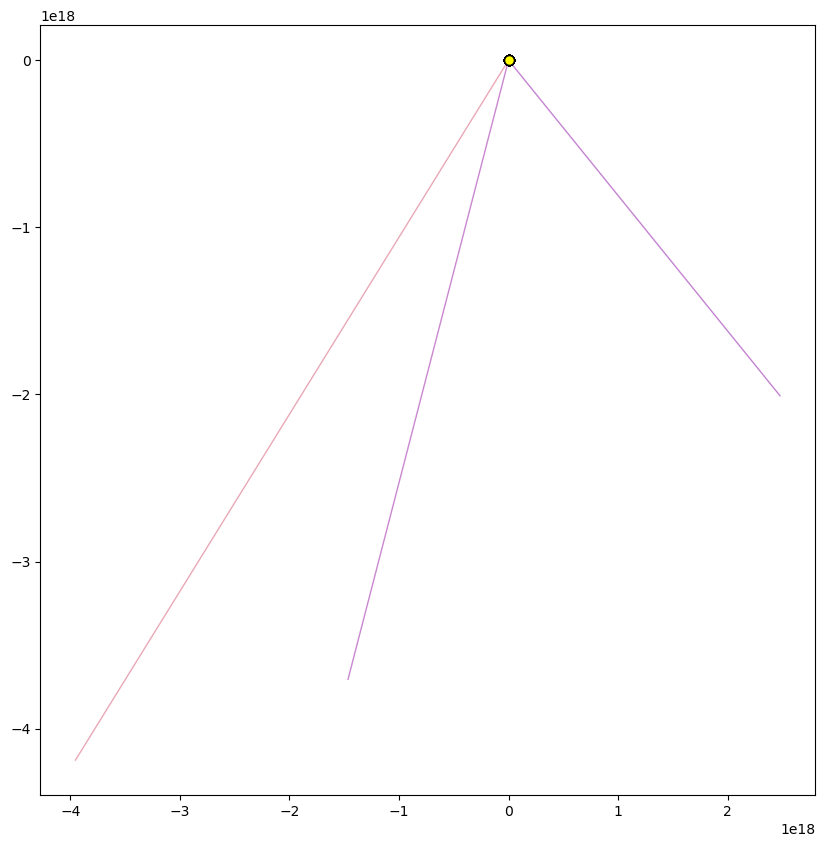

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

# ---- Trajectories ----
positions = traj.detach().cpu().numpy() if hasattr(traj, "detach") else np.asarray(traj)
if isinstance(positions, tuple):
    positions = positions[2]  # fallback for old traj structure
positions = np.asarray(positions)

# Automatically determine plotting window based on trajectory data, with some margin
margin = 0.3  # as ratio of span
x_min_traj = np.nanmin(positions[..., 0])
x_max_traj = np.nanmax(positions[..., 0])
y_min_traj = np.nanmin(positions[..., 1])
y_max_traj = np.nanmax(positions[..., 1])

x_span = x_max_traj - x_min_traj
y_span = y_max_traj - y_min_traj

xmin = x_min_traj - margin * x_span
xmax = x_max_traj + margin * x_span
ymin = y_min_traj - margin * y_span
ymax = y_max_traj + margin * y_span

if positions.ndim == 3:
    n_paths, n_steps, dim = positions.shape
    # Color for each path
    cmap = plt.get_cmap('plasma')
    colors = cmap(np.linspace(0, 1, n_paths))
    # Plot each trajectory (only plotting within window)
    for i in range(n_paths):
        path_x = positions[i, :, 0]
        path_y = positions[i, :, 1]
        mask = (
            (path_x >= xmin) & (path_x <= xmax) &
            (path_y >= ymin) & (path_y <= ymax)
        )
        segment_mask = mask
        if segment_mask.any():
            ax.plot(
                path_x[segment_mask],
                path_y[segment_mask],
                color=colors[i],
                alpha=0.5,
                linewidth=1.0,
            )
    # Mark starting points in yellow if they're inside plotting window
    in_box = (
        (positions[:, 0, 0] >= xmin) & (positions[:, 0, 0] <= xmax) &
        (positions[:, 0, 1] >= ymin) & (positions[:, 0, 1] <= ymax)
    )
    if in_box.any():
        ax.scatter(
            positions[:, 0, 0][in_box], positions[:, 0, 1][in_box],
            color="yellow", edgecolor="black", s=50, marker="o", zorder=6, label="start"
        )
else:
    # fallback to a single trajectory
    path_x = positions[:, 0]
    path_y = positions[:, 1]
    mask = (
        (path_x >= xmin) & (path_x <= xmax) &
        (path_y >= ymin) & (path_y <= ymax)
    )
    if mask.any():
        ax.plot(
            path_x[mask],
            path_y[mask],
            color='black',
            alpha=0.5,
            linewidth=1.0,
            label="trajectory"
        )
    # Mark starting point in yellow if it's in plotting window
    if xmin <= positions[0, 0] <= xmax and ymin <= positions[0, 1] <= ymax:
        ax.scatter(
            positions[0, 0], positions[0, 1],
            color="yellow", edgecolor="black", s=70, marker="o", zorder=6, label="start"
        )

# ---- Define grid within the window (adaptive to data) ----
x = np.linspace(xmin, xmax, 20)
y = np.linspace(ymin, ymax, 20)
xx, yy = np.meshgrid(x, y)
points = np.stack([xx.ravel(), yy.ravel()], axis=1)

# Avoid origin if needed
mask = np.linalg.norm(points, axis=1) > 0.1
masked_points = points[mask]

pts_tensor = torch.tensor(masked_points, dtype=torch.float32)
omega_vecs = omega_form(pts_tensor).detach().numpy()

# ---- Covector field ----
ax.quiver(
    masked_points[:, 0],
    masked_points[:, 1],
    omega_vecs[:, 0],
    omega_vecs[:, 1],
    angles="xy",
    scale_units="xy",
    scale=2.5,
    color="tab:red",
    width=0.005,
    alpha=0.7,
    label="omega"
)

# ---- Styling ----
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_aspect("equal")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_title(r"All Trajectories + Covector field $\omega$")
ax.grid(True, linestyle ="--")
ax.legend(loc="upper right", fontsize=9)

plt.show()